In [ ]:
import random
import graycode
import matplotlib.pyplot as plt
import oapackage as oa
import numpy as np
import math

def fitness(individual):
    x1, x2, x3, x4 = individual
    f1 = (np.sin(x1)*np.cos(x2**2) + 4*np.cos(x3**2)+5)/10
    f2 = (np.sin(x3*x4) + 6*(np.cos(x4**2))**3 + 7)/13.9764
    return f1, f2

def is_valid(individual):
    x1, x2, x3, x4 = individual
    condition1 = x1 + x2 + x3 + x4 <= 15
    condition2 = x3 + x4 >= -15
    condition3 = pow(x1,2) + pow(x2,2) + pow(x3,2) + pow(x4,2) <= 50
    return condition1 and condition2 and condition3

def crossover(parent1, parent2, a_bound, b_bound,  power):
    # одноточечное скрещивание
    g_c = []
    str_pow = "{:0"+str(power)+"b}"
    for i in range(pow(2,power)):
        g_c.append(str_pow.format(graycode.tc_to_gray_code(i)))
    p1_0 = ((parent1[0]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    p1_1 = ((parent1[1]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    p1_2 = ((parent1[2]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    p1_3 = ((parent1[3]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    p2_0 = ((parent2[0]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    p2_1 = ((parent2[1]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    p2_2 = ((parent2[2]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    p2_3 = ((parent2[3]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    chr1 = g_c[int(p1_0)]+g_c[int(p1_1)]+g_c[int(p1_2)]+g_c[int(p1_3)]
    chr2 = g_c[int(p2_0)]+g_c[int(p2_1)]+g_c[int(p2_2)]+g_c[int(p2_3)]
    crossover_point = random.randint(0, 4*power-1)
    child1 = chr1[:crossover_point] + chr2[crossover_point:]
    child2 = chr2[:crossover_point] + chr1[crossover_point:]
    ch1 = []
    ch2 = []
    for i in range(4):
        ch1.append(a_bound+(g_c.index(child1[i*power:(i+1)*power])*2+1)*(b_bound-a_bound)/pow(2,power+1))
        ch2.append(a_bound+(g_c.index(child2[i*power:(i+1)*power])*2+1)*(b_bound-a_bound)/pow(2,power+1))
    return ch1, ch2

def mutate(individual, mutation_rate, a_bound, b_bound,  power):
    # мутация - изменение случайного гена индивида
    g_c = []
    str_pow = "{:0"+str(power)+"b}"
    for i in range(pow(2,power)):
        g_c.append(str_pow.format(graycode.tc_to_gray_code(i)))
    i_0 = ((individual[0]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    i_1 = ((individual[1]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    i_2 = ((individual[2]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    i_3 = ((individual[3]-a_bound)*pow(2,power+1)/(b_bound - a_bound) - 1)/2
    chr = g_c[int(i_0)]+g_c[int(i_1)]+g_c[int(i_2)]+g_c[int(i_3)]
    chr_str = []
    for i in range(len(chr)):
        chr_str.append(chr[i])
    mutated_individual = chr_str[:]
    for i in range(len(mutated_individual)):
        if random.random() < mutation_rate:
            if mutated_individual[i] == '0':
                mutated_individual[i] = '1'
            else:
                mutated_individual[i] = '0'
    m_i = []
    chr = []
    for i in range(4):
        chr_str = ""
        for j in range(power):
            chr_str += mutated_individual[i*power+j]
        chr.append(chr_str)
    for i in range(4):
        m_i.append(a_bound+(g_c.index(chr[i])*2+1)*(b_bound-a_bound)/pow(2,power+1))
    return m_i

def is_point_inside_polygon(x, y, polygon):
    n = len(polygon)
    inside = False
    p1x, p1y = polygon[0]
    
    for i in range(1, n + 1):
        p2x, p2y = polygon[i % n]
        
        if y > min(p1y, p2y):
            if y <= max(p1y, p2y):
                if x <= max(p1x, p2x):
                    if p1y != p2y:
                        xinters = (y - p1y) * (p2x - p1x) / (p2y - p1y) + p1x
                        if p1x == p2x or x <= xinters:
                            inside = not inside
        
        p1x, p1y = p2x, p2y
    
    return inside

def pareto_optimization(a_bound, b_bound, population_size, num_generations, mutation_rate, power, ratio, a1):
    # инициализация начальной популяции
    g_c = []
    str_pow = "{:0"+str(power)+"b}"
    for i in range(pow(2,power)):
        g_c.append(str_pow.format(graycode.tc_to_gray_code(i)))
    population = []
    for i in range(population_size):
        chromosome = []
        population.append(chromosome)
    for k in range(population_size): 
        for i in range(4*power):
            population[k].append(str(random.randint(0,1)))
    chr = []
    for i in range(population_size):
        chr.append(''.join(population[i]))
    x = []
    for k in range(population_size):
        x.append([])
        for i in range(4):
            ch = []
            for j in range(power):
                ch.append(population[k][i*power+j])
            c = ''.join(ch)
            x[k].append(a_bound+(g_c.index(c)*2+1)*(b_bound-a_bound)/pow(2,power+1))
    population = x
    children = []
    children_f = []
    a2 = 1-a1
    optimal_chr_previous = []
    counter_opt = 0
    valid_population = [ind for ind in population if is_valid(ind)]
    pop = []
    for val in population:
        if val not in pop:
            pop.append(val)
    val_pop = []
    for val in valid_population:
        if val not in val_pop:
            val_pop.append(val)
    if len(val_pop)/len(pop) < ratio:
        print("Интервал слишком большой. Введите другой интервал.")
    else:
        for _ in range(num_generations):
            print("_________________________________________________________________________Generation ",_+1," _________________________________________________________________________")
            valid_population = [ind for ind in population if is_valid(ind)]
            print("Population",population)
            x1 = []
            x2 = []
            x3 = []
            x4 = []
            for i in range(population_size):
                x1.append(population[i][0])
                x2.append(population[i][1])
                x3.append(population[i][2])
                x4.append(population[i][3])
            f_v = []
            f_v_1 = []
            f_v_2 = []
            f_n_v = []
            f_n_v_1 = []
            f_n_v_2 = []
            k_v = 0
            k_n_v = 0
            for i in range(population_size):
                if is_valid(population[i]):
                    f_v.append(list(fitness(population[i])))
                    f_v_1.append(f_v[k_v][0])
                    f_v_2.append(f_v[k_v][1])
                    k_v += 1
                else:
                    f_n_v.append(list(fitness(population[i])))
                    f_n_v_1.append(f_n_v[k_n_v][0])
                    f_n_v_2.append(f_n_v[k_n_v][1])
                    k_n_v += 1
            plt.plot(f_v_1[:], f_v_2[:], ".k", markersize=11, label='Допустимые') 
            plt.plot(f_n_v_1[:], f_n_v_2[:], ".r", markersize=11, label='Недопустимые') 
            plt.legend(loc=(0.0, 0.0))
            plt.title("Популяция")
            plt.show()
            fit_ = []
            for i in range (population_size):
                if is_valid(population[i]):
                    fit_.append(a1*fitness(population[i])[0]+a2*fitness(population[i])[1])
            f1, f2 = [], []
            for i in range(len(valid_population)):
                f1.append(fitness(valid_population[i])[0])
                f2.append(fitness(valid_population[i])[1])
            pareto=oa.ParetoDoubleLong()
            for ii in range(len(valid_population)):
                w=oa.doubleVector( (f1[ii], f2[ii]))
                pareto.addvalue(w, ii)
            pareto.show(verbose=1)
            lst=pareto.allindices()
            if len(lst) == 0:
                break
            optimal_chr = []
            for i in range(len(lst)):
                optimal_chr.append(valid_population[lst[i]])
            valid_population_copy = valid_population.copy()
            for i in range(len(lst)):
                valid_population.remove(valid_population_copy[lst[i]])
            unique = []
            for ch in optimal_chr:
                if ch in unique:
                    continue
                else:
                    unique.append(ch)
            optimal_datapoints_f1=[]
            optimal_datapoints_f2=[]
            for i in range(len(lst)):
                optimal_datapoints_f1.append(f1[lst[i]])
                optimal_datapoints_f2.append(f2[lst[i]])
            optimal_datapoints = []
            for i in range(len(optimal_datapoints_f1)):
                optimal_datapoints.append([optimal_datapoints_f1[i],optimal_datapoints_f2[i]])
            optimal_datapoints = np.array(optimal_datapoints)
            optimal_datapoints = optimal_datapoints[optimal_datapoints[:, 1].argsort()]
            fit_ = []
            valid_population_dominated = valid_population
            non_valid_dominated = []
            non_valid_non_dominated = []
            for i in range (population_size):
                if is_valid(population[i]):
                    fit_.append(a1*fitness(population[i])[0]+a2*fitness(population[i])[1])
                else:
                    polygon = [[-10000, -10000], [5000, -10000], list(optimal_datapoints[0])]
                    for j in range(1,len(optimal_datapoints)):
                        polygon.append(list(optimal_datapoints[j]))
                    polygon.append([-10000, 5000])
                    res = is_point_inside_polygon(fitness(population[i])[0], fitness(population[i])[1], polygon)
                    if res:    
                        fit_.append(0.0000000001)
                        non_valid_dominated.append(population[i])
                    else:
                        fit_.append(a1*fitness(population[i])[0]+a2*fitness(population[i])[1])
                        non_valid_non_dominated.append(population[i])
            valid_population_dominated_copy = valid_population_dominated.copy()
            non_valid_non_dominated_copy = non_valid_non_dominated.copy()
            if len(valid_population_dominated) >= len(non_valid_non_dominated):
                for __ in range((len(non_valid_non_dominated))):
                    # отбор родителей
                    parent1 = max(valid_population_dominated_copy, key=lambda x: a1*fitness(x)[0]+a2*fitness(x)[1])
                    valid_population_dominated_copy.remove(parent1)        
                    # выбор родителя 2 с максимальной фитнесс функцией, исключая parent1
                    parent2 = min(non_valid_non_dominated_copy, key=lambda x: a1*fitness(x)[0]+a2*fitness(x)[1])
                    non_valid_non_dominated_copy.remove(parent2)
                    # скрещивание родителей
                    child = crossover(parent1, parent2, a_bound, b_bound,  power)
                    # мутация потомка
                    mutated_child_1 = mutate(child[0], mutation_rate, a_bound, b_bound,  power)
                    mutated_child_2 = mutate(child[1], mutation_rate, a_bound, b_bound,  power)
                    children.append(mutated_child_1)
                    children.append(mutated_child_2)
                    children_f.append(fitness(mutated_child_1))
                    children_f.append(fitness(mutated_child_2))
            else:
                for __ in range((len(valid_population_dominated))):
                    # отбор родителей
                    parent1 = max(valid_population_dominated_copy, key=lambda x: a1*fitness(x)[0]+a2*fitness(x)[1])
                    valid_population_dominated_copy.remove(parent1)        
                    # выбор родителя 2 с максимальной фитнесс функцией, исключая parent1
                    parent2 = min(non_valid_non_dominated_copy, key=lambda x: a1*fitness(x)[0]+a2*fitness(x)[1])
                    non_valid_non_dominated_copy.remove(parent2)
                    # скрещивание родителей
                    child = crossover(parent1, parent2, a_bound, b_bound,  power)
                    # мутация потомка
                    mutated_child_1 = mutate(child[0], mutation_rate, a_bound, b_bound,  power)
                    mutated_child_2 = mutate(child[1], mutation_rate, a_bound, b_bound,  power)
                    children.append(mutated_child_1)
                    children.append(mutated_child_2)
                    children_f.append(fitness(mutated_child_1))
                    children_f.append(fitness(mutated_child_2))
            new_population = []
            for i in range(len(children)):
                new_population.append(children[i])
            
            
            for i in range(min(len(optimal_chr),population_size)):
                new_population.append(optimal_chr[i])
            valid_population_dominated_copy = valid_population_dominated.copy()
            non_valid_non_dominated_copy = non_valid_non_dominated.copy() 
            len_opt = len(new_population)
            if len(valid_population_dominated) <= len(non_valid_non_dominated):
                for __ in range((len(valid_population_dominated))):
                    new_population.append(valid_population_dominated[__])
                for __ in range(min(population_size-len(new_population),len(non_valid_non_dominated_copy))):
                    individual_ = min(non_valid_non_dominated_copy, key=lambda x: a1*fitness(x)[0]+a2*fitness(x)[1])
                    new_population.append(individual_)
                    non_valid_non_dominated_copy.remove(individual_)
            else:
                for __ in range(min(population_size-len(new_population),len(valid_population_dominated_copy))):
                    individual_ = max(valid_population_dominated_copy, key=lambda x: a1*fitness(x)[0]+a2*fitness(x)[1])
                    new_population.append(individual_)
                    valid_population_dominated_copy.remove(individual_)
                for __ in range((len(non_valid_non_dominated))):
                    new_population.append(non_valid_non_dominated[__])
            f_v = []
            f_v_1 = []
            f_v_2 = []
            f_n_v = []
            f_n_v_1 = []
            f_n_v_2 = []
            k_v = 0
            k_n_v = 0
            f_c_1 = []
            f_c_2 = []
            for i in range(len(children_f)):
                f_c_1.append(children_f[i][0])
                f_c_2.append(children_f[i][1])
            for i in range(len(new_population)):
                if is_valid(new_population[i]):
                    f_v.append(list(fitness(new_population[i])))
                    f_v_1.append(f_v[k_v][0])
                    f_v_2.append(f_v[k_v][1])
                    k_v += 1
                else:
                    f_n_v.append(list(fitness(new_population[i])))
                    f_n_v_1.append(f_n_v[k_n_v][0])
                    f_n_v_2.append(f_n_v[k_n_v][1])
                    k_n_v += 1
            plt.plot(f_v_1[:], f_v_2[:], ".k", markersize=11, label='Допустимые доминируемые')
            plt.plot(f_n_v_1[:], f_n_v_2[:], ".r", markersize=11, label='Недопустимые') 
            plt.plot(f_c_1[:], f_c_2[:], ".b", markersize=11, label='Потомки') 
            plt.plot(optimal_datapoints_f1[:len_opt], optimal_datapoints_f2[:len_opt], '.g', markersize=11, label='Допустимые недоминируемые (оптимальные по Парето)')
            plt.legend(loc=(0.0, 0.0))
            plt.title("Предполагаемая граница Парето")
            plt.show()
            i = 0
            y = []
            len_new_population = len(new_population)
            while i<(population_size-len_new_population):
                chromosome = []
                y.append(chromosome)
                i+=1
            k = 0
            while k<(population_size-len_new_population):
                for i in range(4*power):
                    y[k].append(str(random.randint(0,1)))
                k+=1
            chr = []
            i = 0
            while i<(population_size-len_new_population):
                chr.append(''.join(y[i]))
                i+=1
            x = []
            k = 0
            while k<(population_size-len_new_population):
                x.append([])
                for i in range(4):
                    ch = []
                    for j in range(power):
                        ch.append(y[k][i*power+j])
                    c = ''.join(ch)
                    x[k].append(a_bound+(g_c.index(c)*2+1)*(b_bound-a_bound)/pow(2,power+1))
                k+=1
            for i in range(k):    
                new_population.append(x[i])
            f_v = []
            f_v_1 = []
            f_v_2 = []
            f_n_v = []
            f_n_v_1 = []
            f_n_v_2 = []
            k_v = 0
            k_n_v = 0
            for i in range(len(new_population)):
                if is_valid(new_population[i]):
                    f_v.append(list(fitness(new_population[i])))
                    f_v_1.append(f_v[k_v][0])
                    f_v_2.append(f_v[k_v][1])
                    k_v += 1
                else:
                    f_n_v.append(list(fitness(new_population[i])))
                    f_n_v_1.append(f_n_v[k_n_v][0])
                    f_n_v_2.append(f_n_v[k_n_v][1])
                    k_n_v += 1
            plt.plot(f_v_1[:], f_v_2[:], ".k", markersize=11, label='Допустимые доминируемые') 
            plt.plot(f_n_v_1[:], f_n_v_2[:], ".r", markersize=11, label='Недопустимые') 
            plt.plot(f_c_1[:], f_c_2[:], ".b", markersize=11, label='Потомки') 
            plt.plot(optimal_datapoints_f1[:len_opt], optimal_datapoints_f2[:len_opt], '.g', markersize=11, label='Допустимые недоминируемые (оптимальные по Парето)')
            plt.legend(loc=(0.0, 0.0))
            plt.title("Новая популяция")
            plt.show()
            children = []
            children_f = []
            population = new_population.copy()
            opt = []
            for opt_val in optimal_chr:
                if opt_val not in opt:
                    opt.append(opt_val)
            print("Optimal:",opt)
            opt_pareto = opt
            if len(opt) != len(optimal_chr_previous):
                optimal_chr_previous = opt
                counter_opt = 0
            else:
                flag = 0
                for i in range(len(opt)):
                    if opt[i][0] != optimal_chr_previous[i][0] and opt[i][1] != optimal_chr_previous[i][1] and opt[i][2] != optimal_chr_previous[i][2]:
                        flag = 1
                if flag == 0:
                    counter_opt += 1
                else:
                    optimal_chr_previous = opt
                    counter_opt = 0
            if counter_opt == 10:
                break
            opt = []
    return opt_pareto

In [18]:
bound_left = input("Введите левую границу:")
bound_right = input("Введите правую границу:")
number_species = input("Введите количество особей:")
number_generations = input("Введите количество поколений:")
mutation_rate = input("Введите вероятность мутации:")
power_of_two = input("Введите степень двойки для разбиения интервала:")
occupancy_ratio = input("Введите процент занимаемости:")

bound_left = float(bound_left)
bound_right = float(bound_right)
number_species = int(number_species)
number_generations = int(number_generations)
mutation_rate = float(mutation_rate)
power_of_two = int(power_of_two)
occupancy_ratio = float(occupancy_ratio)

In [19]:
print(bound_left,bound_right,number_species,number_generations,mutation_rate,power_of_two,occupancy_ratio)

-5.0 5.0 100 10 0.9 4 0.1


_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[4.0625, 4.0625, 0.9375, 0.9375], [-3.4375, -3.4375, 0.9375, -1.5625], [-2.1875, -0.3125, 1.5625, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [-0.9375, 3.4375, 3.4375, 2.8125], [-1.5625, -1.5625, -2.1875, -4.6875], [-1.5625, 2.8125, -2.1875, -3.4375], [4.0625, -1.5625, 1.5625, 2.1875], [-3.4375, -2.1875, 4.6875, -2.8125], [-4.0625, 0.3125, -4.6875, -1.5625], [3.4375, -2.8125, 3.4375, 3.4375], [1.5625, 1.5625, -3.4375, -2.8125], [-2.1875, -3.4375, 2.8125, 2.8125], [1.5625, 3.4375, 2.8125, 4.0625], [-2.8125, 0.9375, 0.3125, -2.8125], [3.4375, 4.6875, 4.0625, -2.8125], [-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 4.0625, -3.4375, -2.1875], [-3.4375, -4.6875, 2.1875, -3.4375], [-4.0625, -0.9375, -2.8125, 4.0625], [0.3125, -4.6875, 4.6875, 3.4375], [2.1875, -2.1875, 0.9375, 3.4375], [2.8125, -2.8125, -4.0625, 4.0625

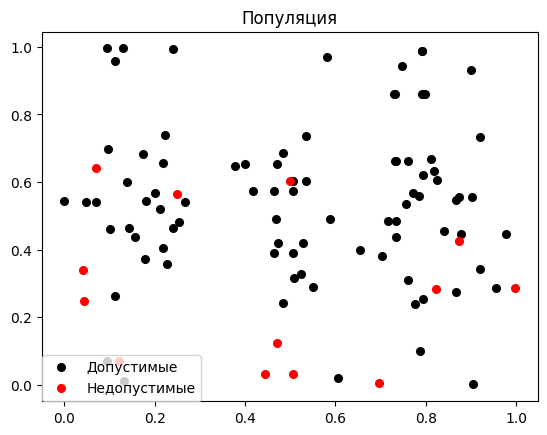

Pareto: 6 optimal values, 6 objects


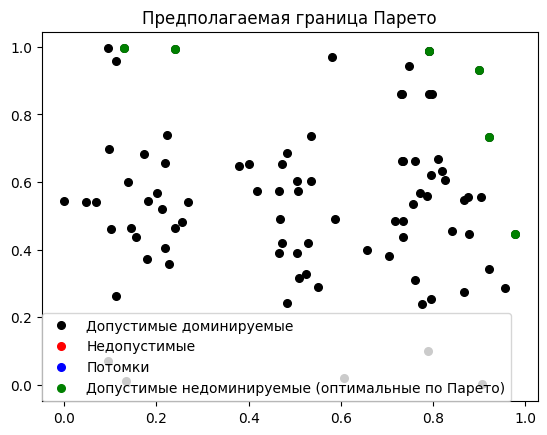

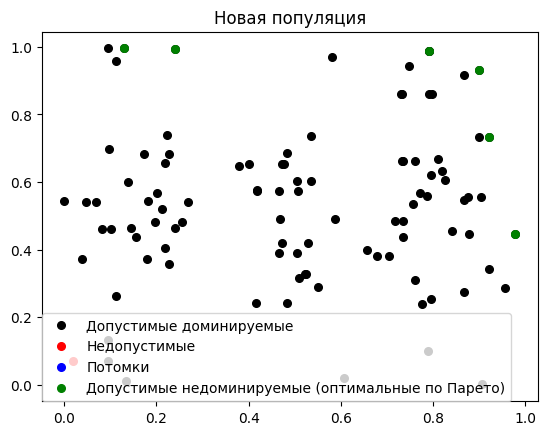

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [-1.5625, 2.8125, -2.1875, -3.4375], [0.3125, -2.1875, -4.0625, -3

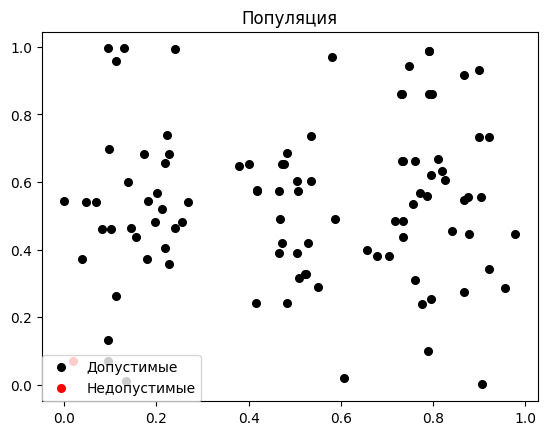

Pareto: 6 optimal values, 6 objects


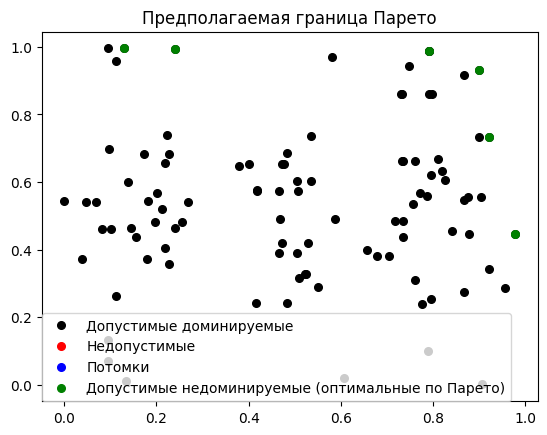

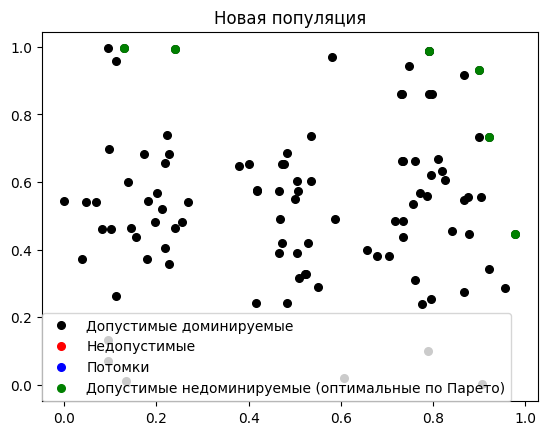

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [2.8125, 4.6875, 0.3125, -0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [3.4375, 2.8125, -0.3125, -3.43

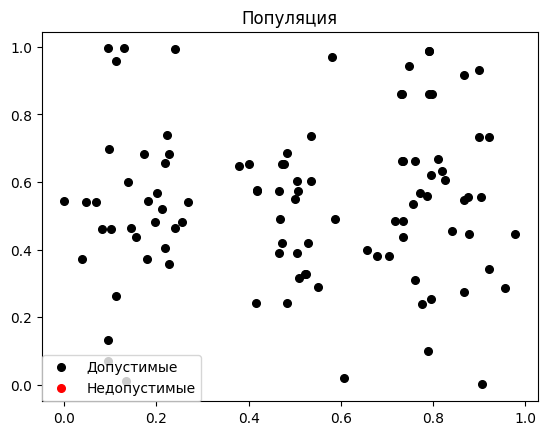

Pareto: 6 optimal values, 6 objects


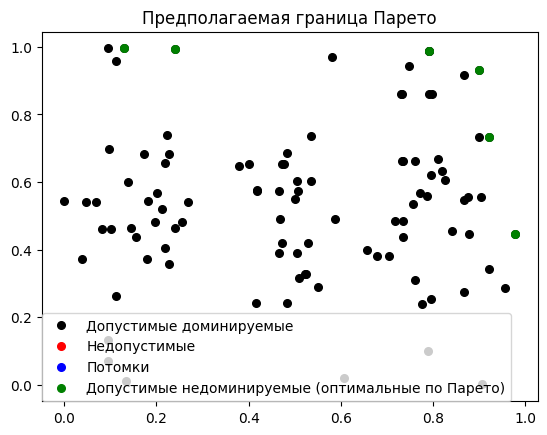

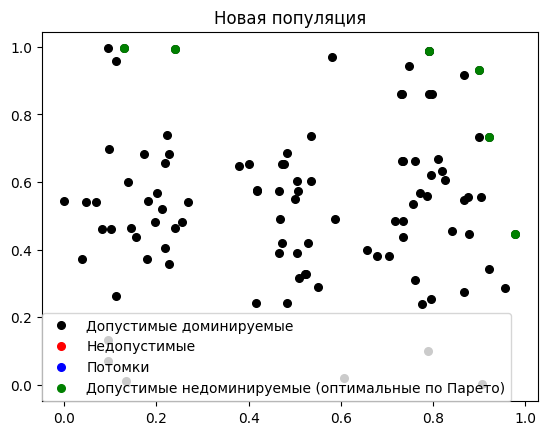

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [2.8125, 4.6875, 0.3125, -0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [3.4375, 2.8125, -0.3125, -3.43

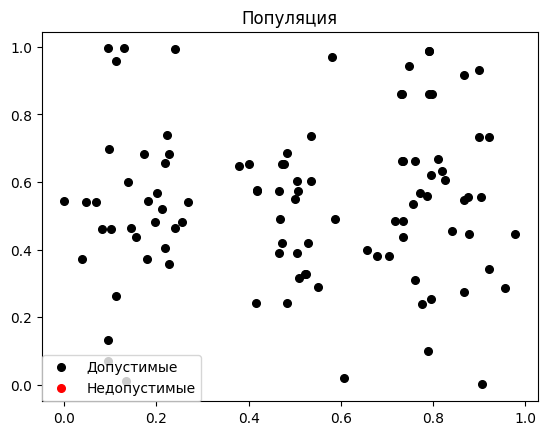

Pareto: 6 optimal values, 6 objects


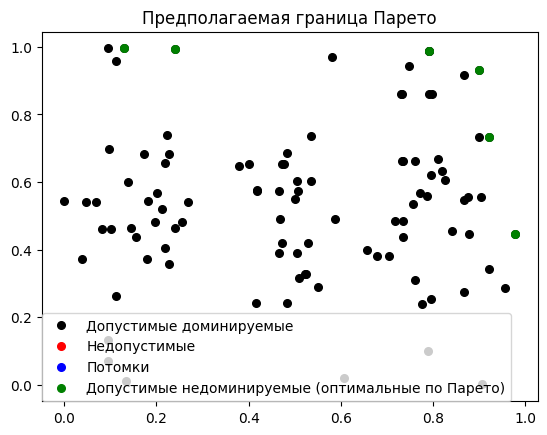

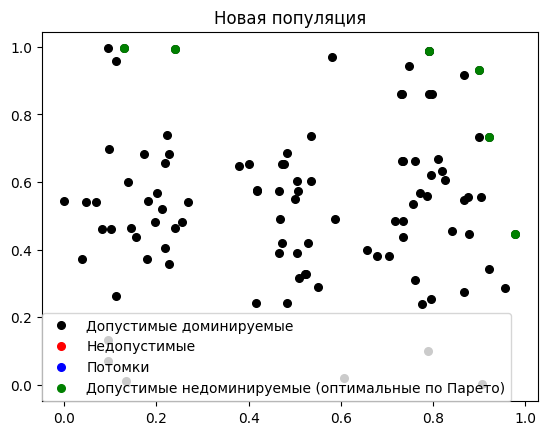

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [2.8125, 4.6875, 0.3125, -0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [3.4375, 2.8125, -0.3125, -3.43

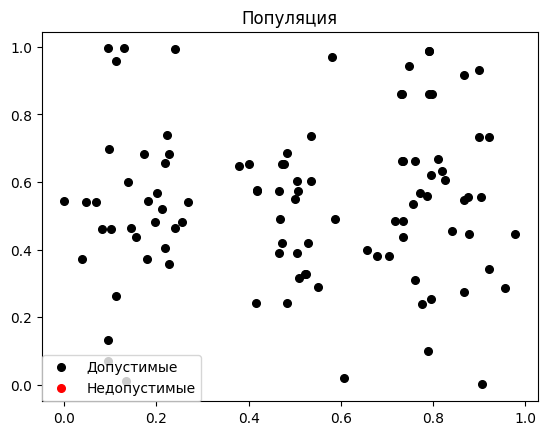

Pareto: 6 optimal values, 6 objects


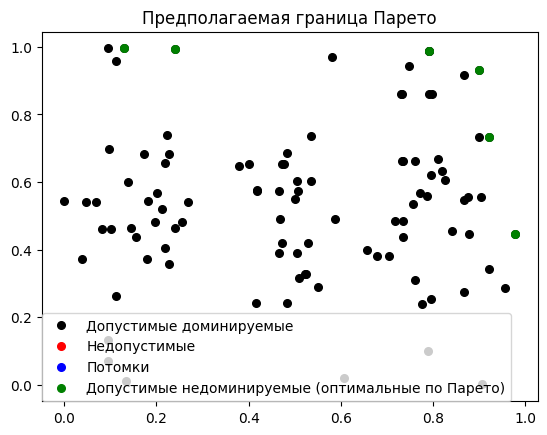

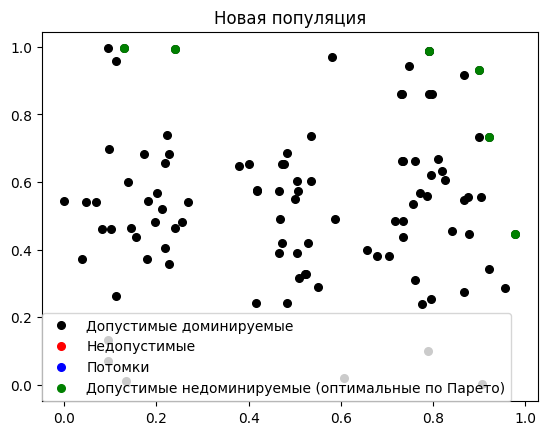

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [2.8125, 4.6875, 0.3125, -0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [3.4375, 2.8125, -0.3125, -3.43

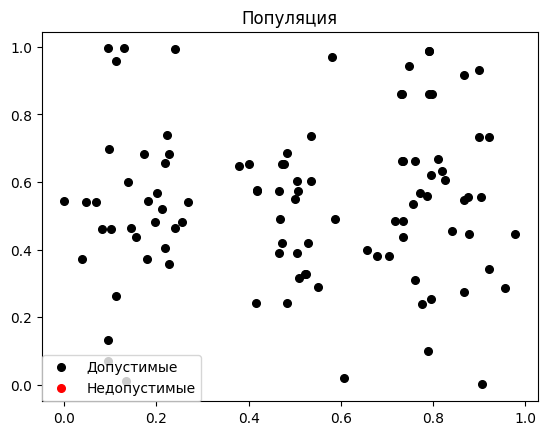

Pareto: 6 optimal values, 6 objects


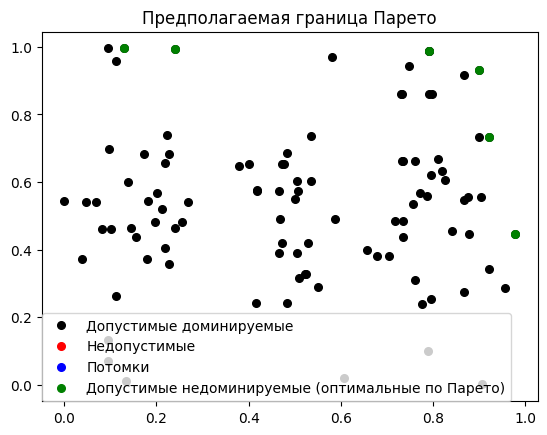

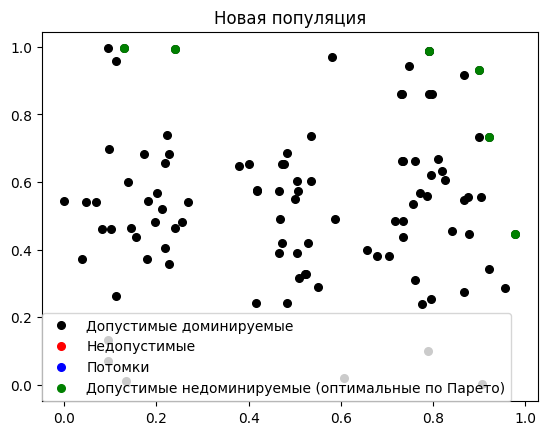

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [2.8125, 4.6875, 0.3125, -0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [3.4375, 2.8125, -0.3125, -3.43

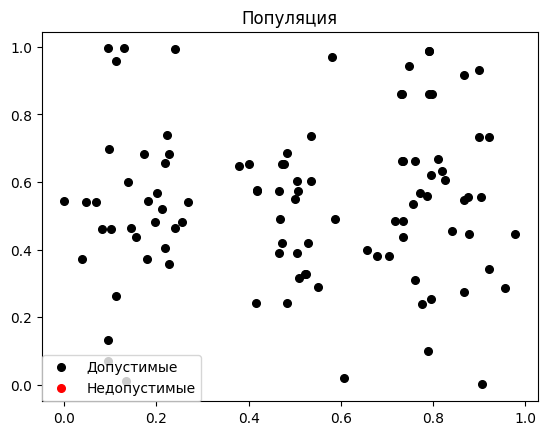

Pareto: 6 optimal values, 6 objects


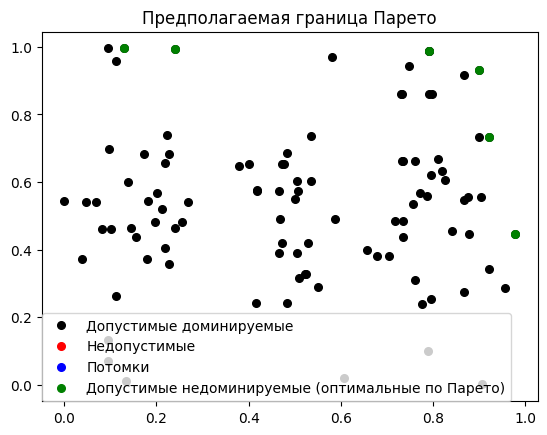

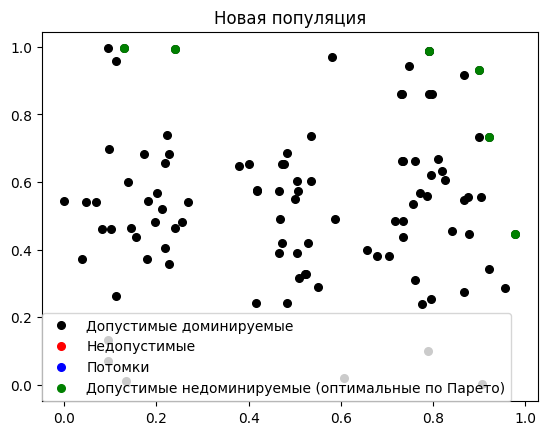

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [2.8125, 4.6875, 0.3125, -0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [3.4375, 2.8125, -0.3125, -3.43

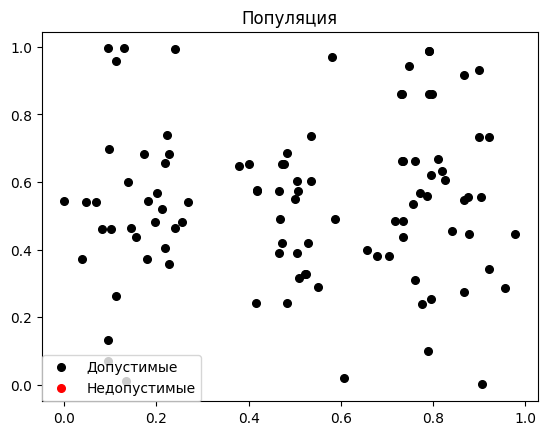

Pareto: 6 optimal values, 6 objects


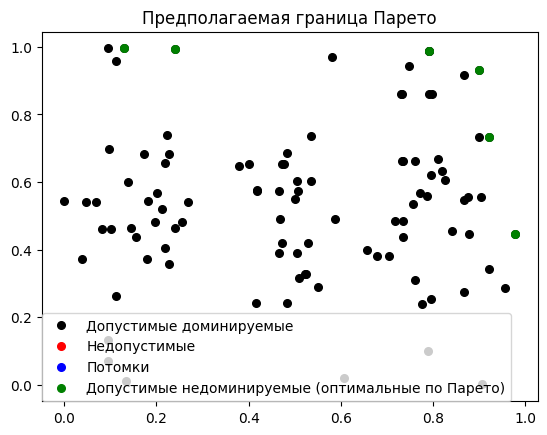

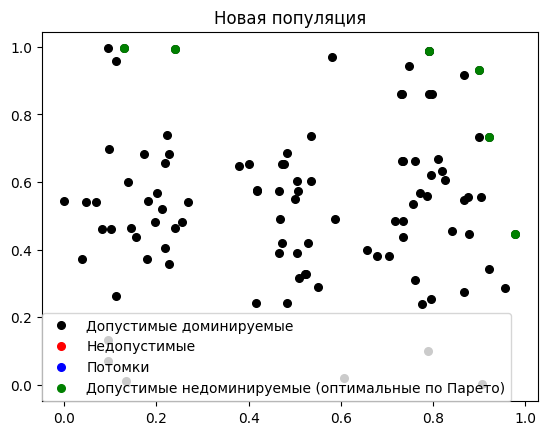

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [2.8125, 4.6875, 0.3125, -0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [3.4375, 2.8125, -0.3125, -3.43

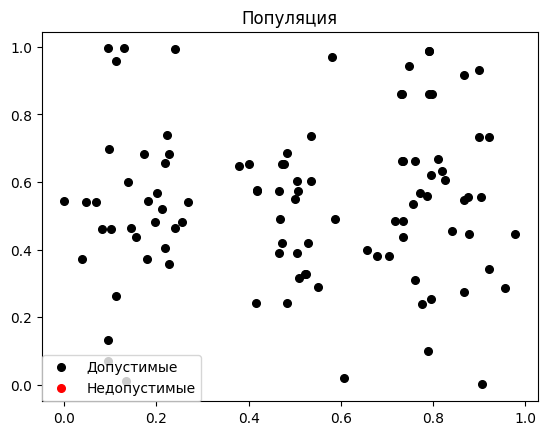

Pareto: 6 optimal values, 6 objects


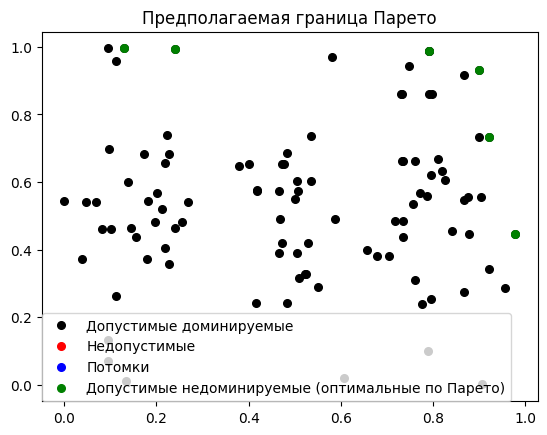

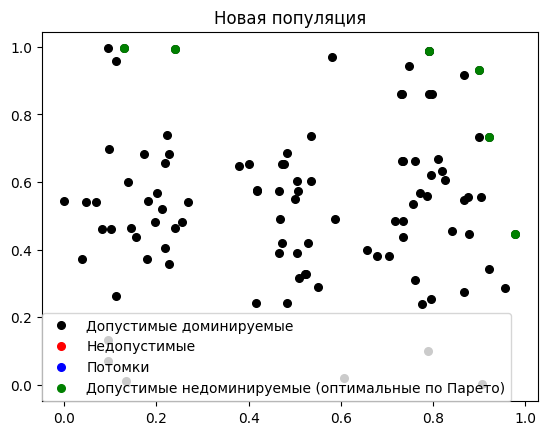

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125], [2.8125, 2.8125, 3.4375, 0.3125], [0.9375, -0.9375, 2.1875, 0.3125], [4.6875, -2.1875, 0.9375, 0.3125], [2.8125, 4.6875, 0.3125, -0.3125], [4.0625, -2.1875, -4.6875, -0.3125], [-2.1875, -0.3125, 1.5625, 0.3125], [4.6875, 2.8125, 3.4375, -0.3125], [0.3125, 2.8125, -3.4375, 0.3125], [-4.0625, 1.5625, 3.4375, -0.3125], [2.1875, 1.5625, -3.4375, 0.3125], [3.4375, 2.8125, -0.3125, -3.4

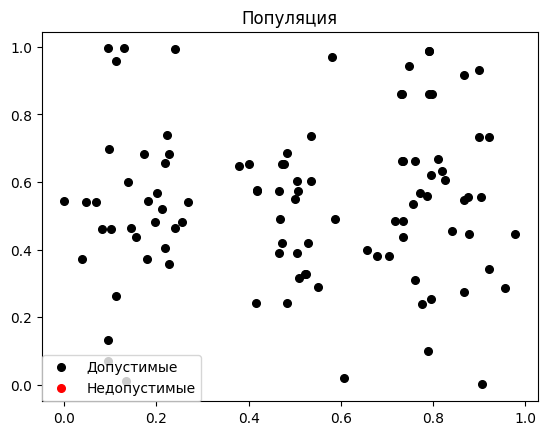

Pareto: 6 optimal values, 6 objects


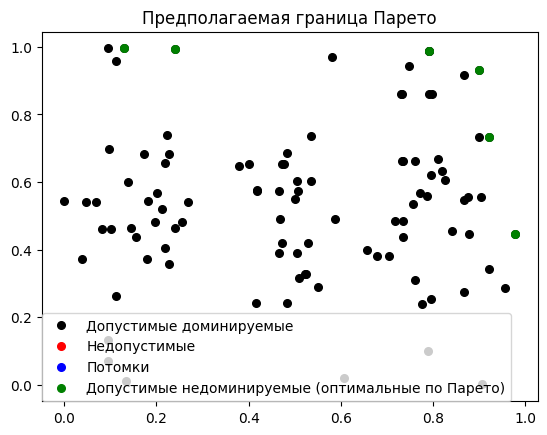

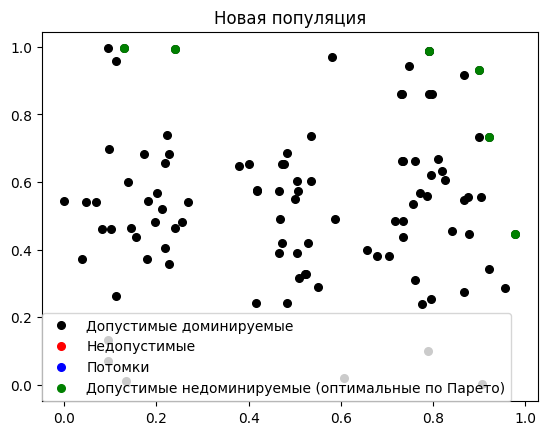

Optimal: [[-2.8125, -4.0625, -0.3125, -3.4375], [-3.4375, 2.8125, 3.4375, 0.3125], [4.0625, -4.6875, -0.3125, 2.8125], [-0.3125, 2.8125, 0.3125, 0.3125], [3.4375, 4.0625, -4.0625, -0.3125], [-3.4375, -0.3125, 4.6875, 0.3125]]
A1 =  0.1
A2 =  0.9
--- 2.9167938232421875 seconds ---
_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[-0.9375, 3.4375, 2.1875, 3.4375], [-0.9375, -4.0625, -1.5625, -1.5625], [-2.8125, -0.3125, 1.5625, -1.5625], [4.0625, -4.6875, -3.4375, 3.4375], [-3.4375, 4.6875, -1.5625, 3.4375], [0.3125, -2.8125, -1.5625, 4.6875], [4.6875, 2.1875, 4.6875, 1.5625], [0.9375, -3.4375, 2.8125, 2.1875], [-4.6875, 2.1875, -2.1875, -1.5625], [-1.5625, -0.3125, -0.9375, -2.1875], [0.3125, 4.0625, 1.5625, 4.6875], [1.5625, 0.3125, -2.1875, 2.8125], [-2.1875, -2.1875, -2.8125, 2.1875], [4.6875, 2.8125, -0.9375, 4.6875], [-4.6875, 2.8125, -0.3125, -2.8125], [1.56

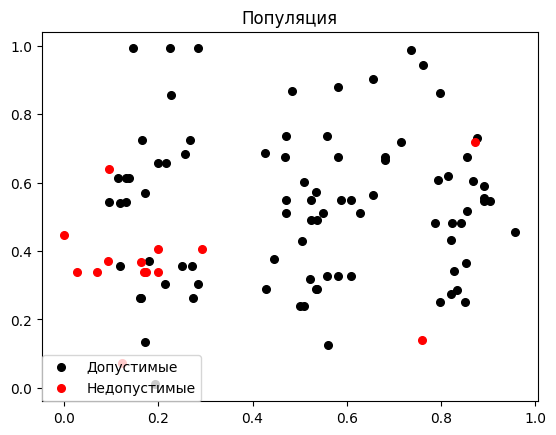

Pareto: 9 optimal values, 9 objects


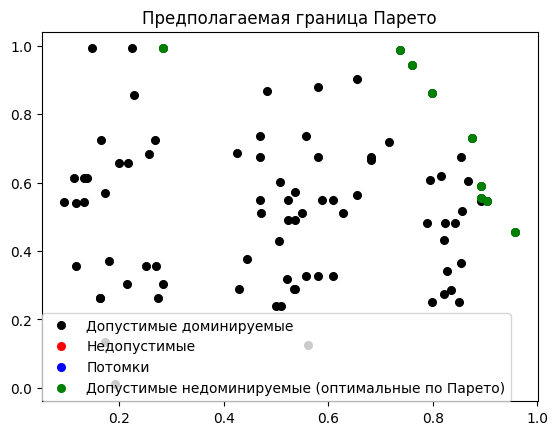

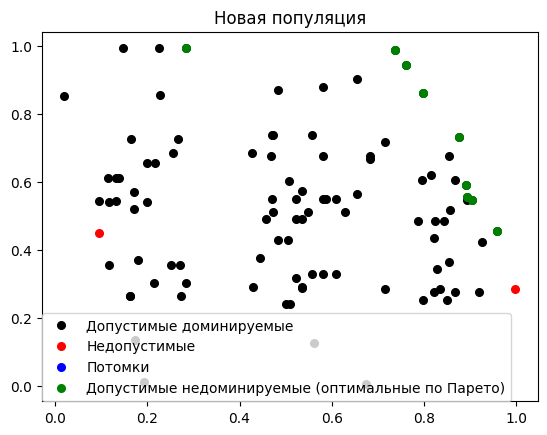

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [-1.5625, -0.3125, 0.9375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.1875, 0.3125], [-4.0625, -2.1875, -2.

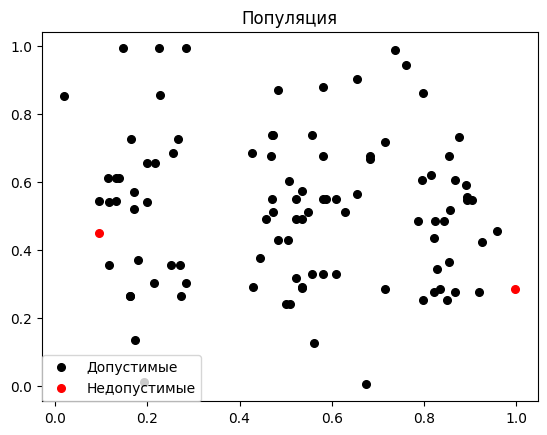

Pareto: 9 optimal values, 9 objects


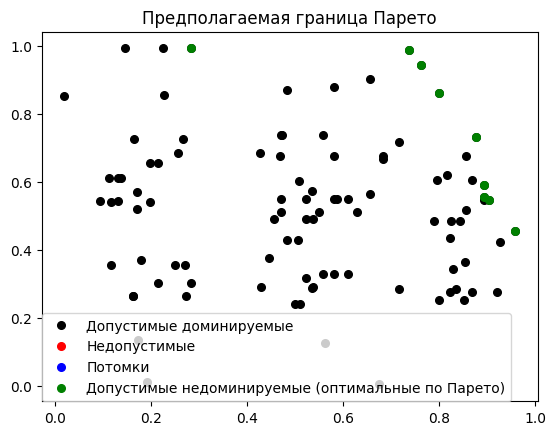

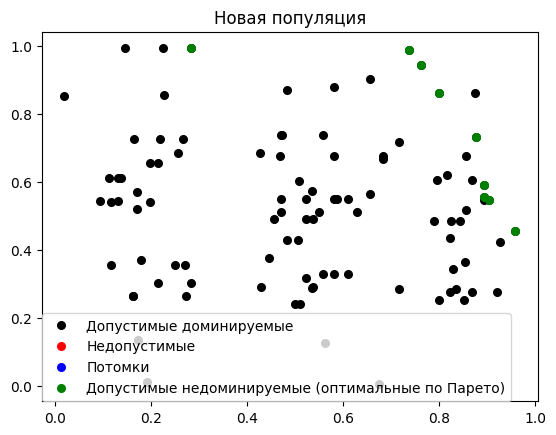

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [-1.5625, -0.3125, 0.9375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.1875, 0.3125], [-4.0625, -2.1875, -2.

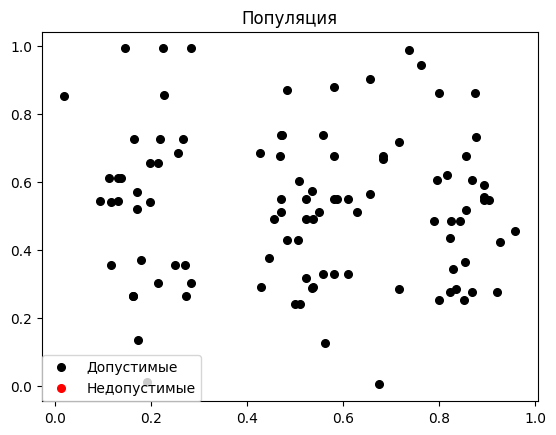

Pareto: 9 optimal values, 9 objects


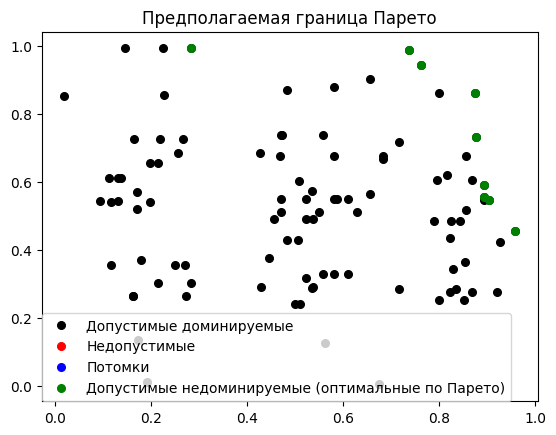

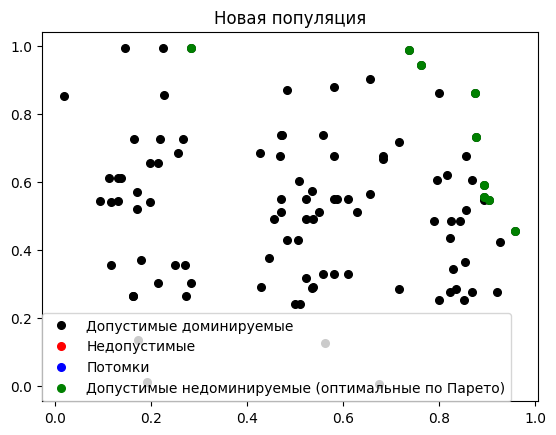

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125], [-1.5625, -0.3125, 0.9375, -0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.1875

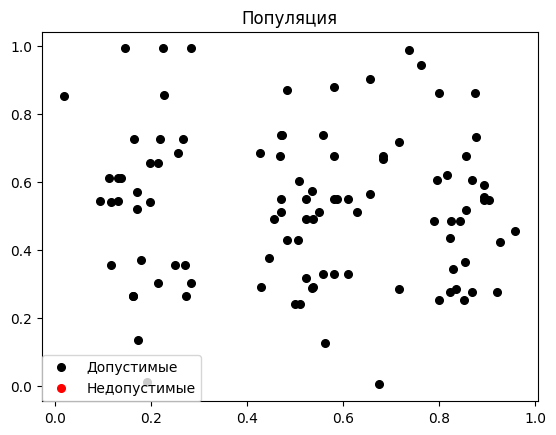

Pareto: 9 optimal values, 9 objects


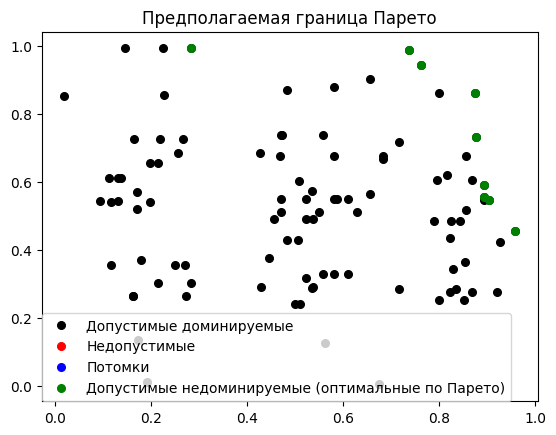

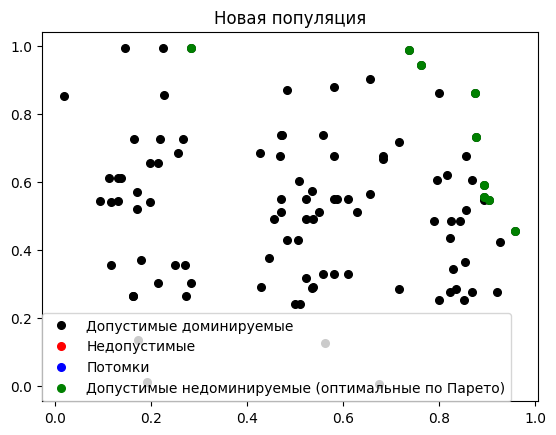

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125], [-1.5625, -0.3125, 0.9375, -0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.1875

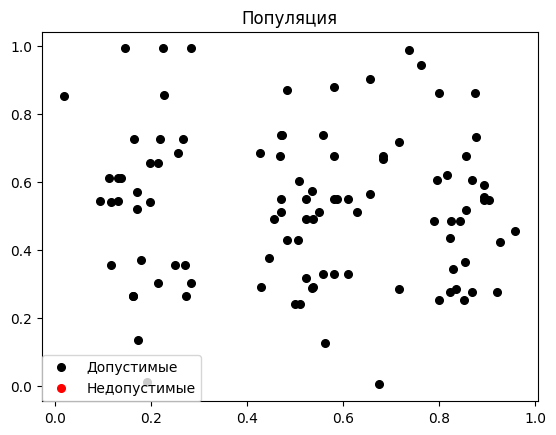

Pareto: 9 optimal values, 9 objects


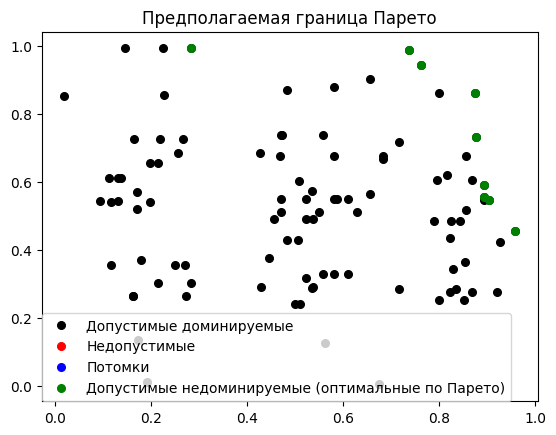

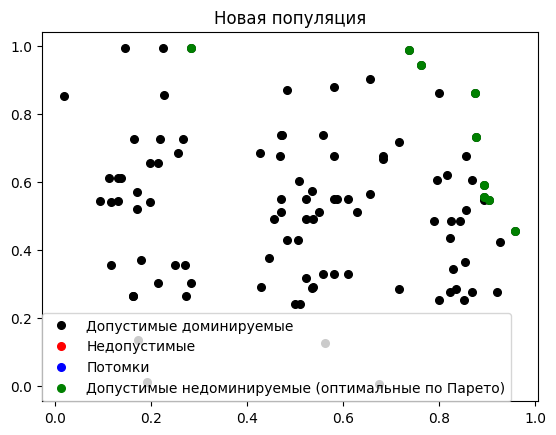

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125], [-1.5625, -0.3125, 0.9375, -0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.1875

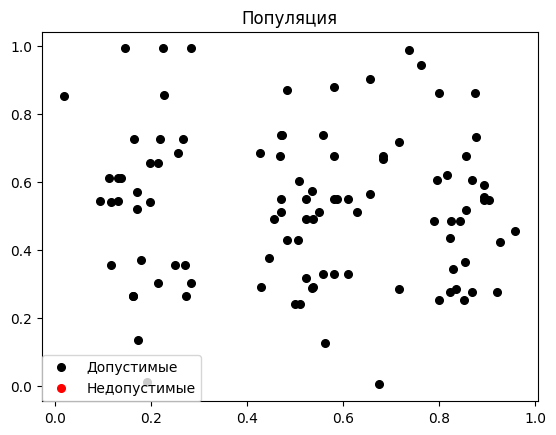

Pareto: 9 optimal values, 9 objects


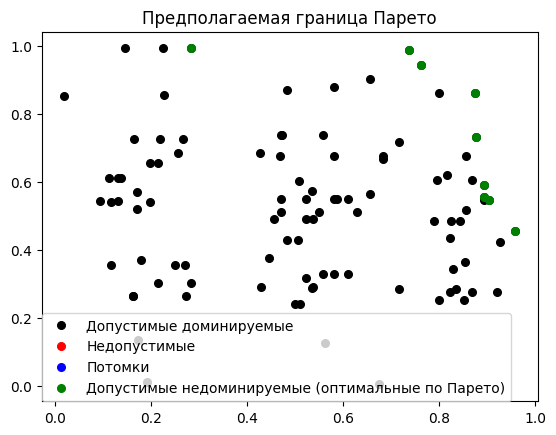

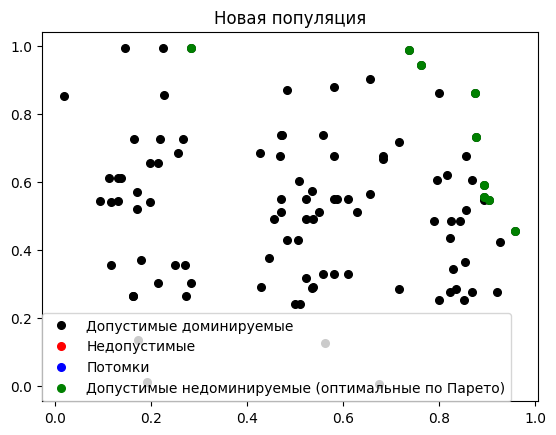

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125], [-1.5625, -0.3125, 0.9375, -0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.1875

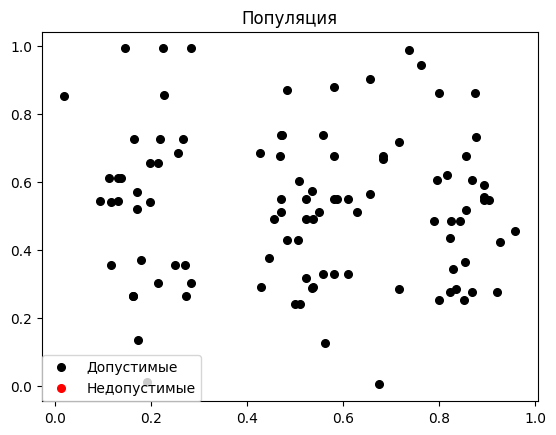

Pareto: 9 optimal values, 9 objects


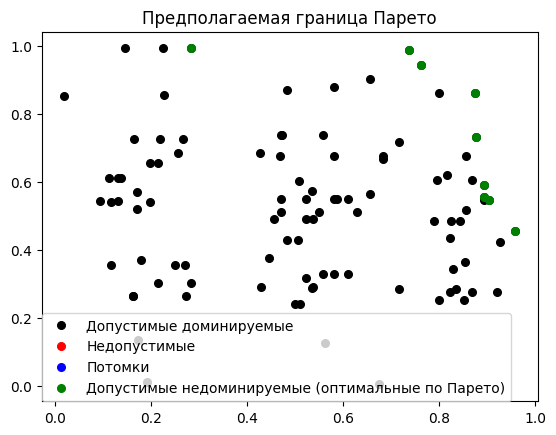

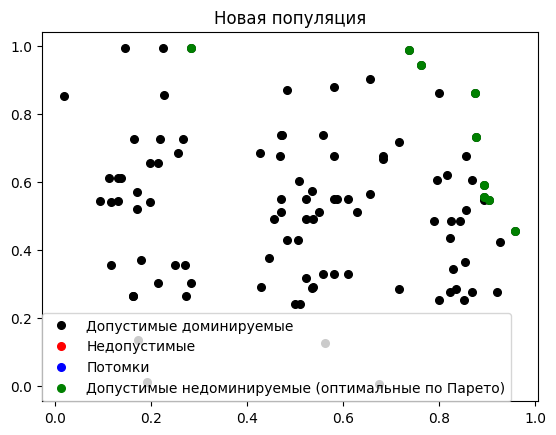

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125], [-1.5625, -0.3125, 0.9375, -0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.1875

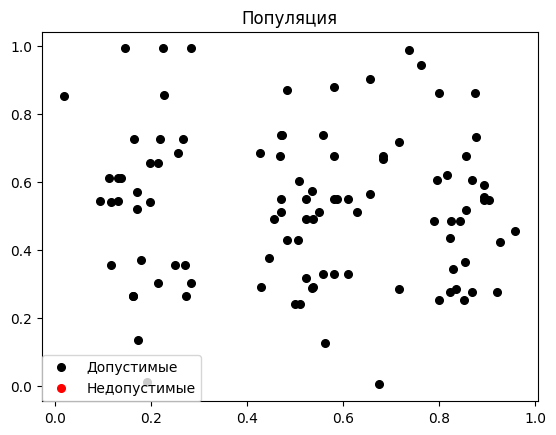

Pareto: 9 optimal values, 9 objects


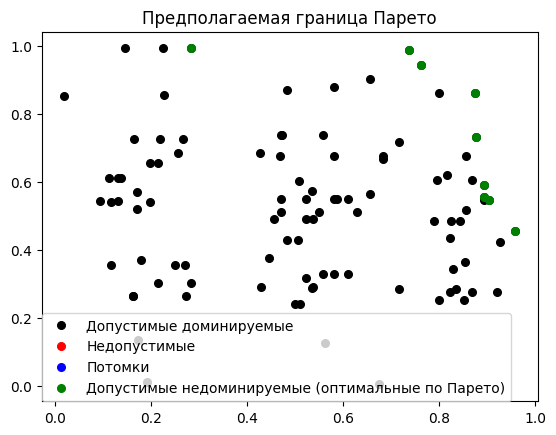

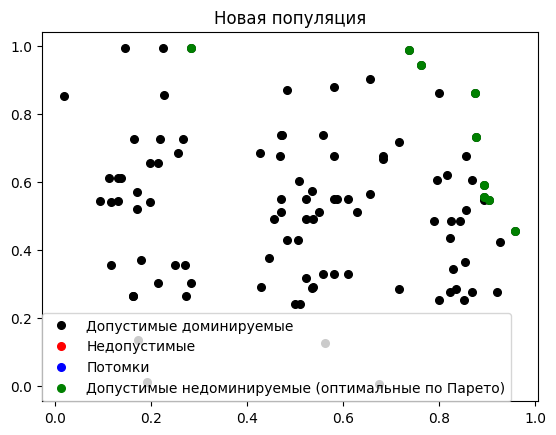

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125], [-1.5625, -0.3125, 0.9375, -0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.1875

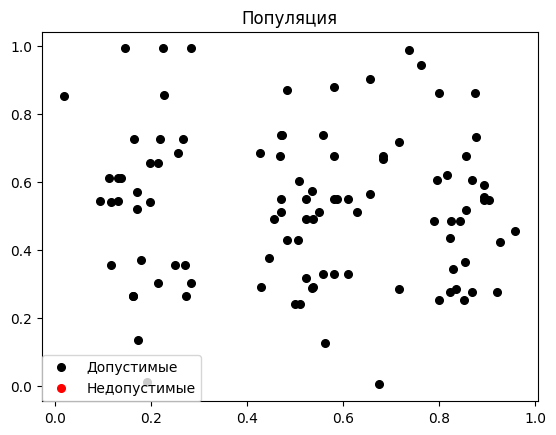

Pareto: 9 optimal values, 9 objects


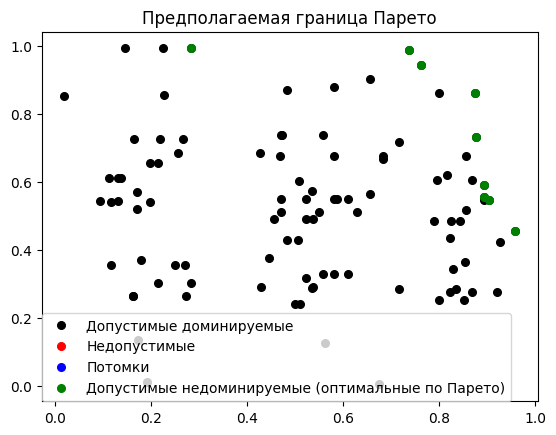

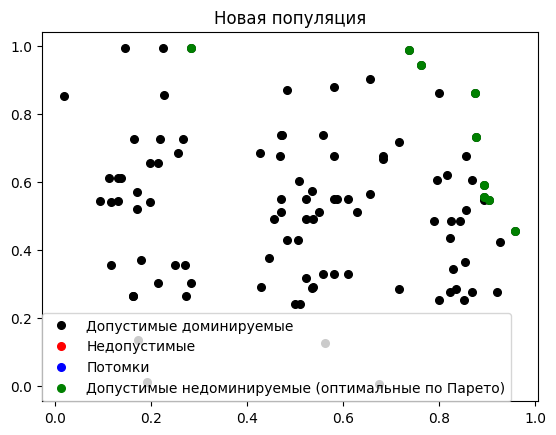

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125], [-1.5625, -0.3125, 0.9375, -0.3125], [-4.0625, -2.1875, 3.4375, -0.3125], [-2.1875, 2.8125, 4.0625, 0.3125], [-1.5625, -3.4375, -4.0625, -0.3125], [0.9375, -0.9375, -2.187

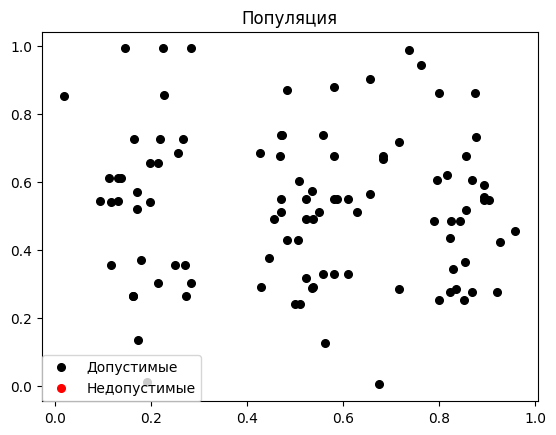

Pareto: 9 optimal values, 9 objects


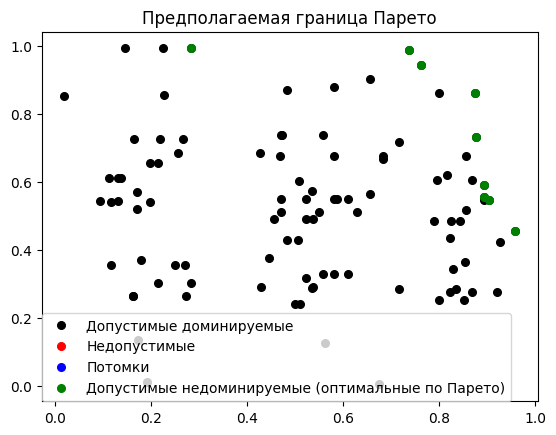

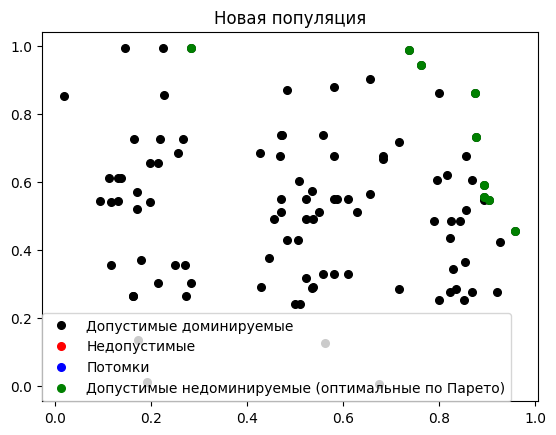

Optimal: [[-4.6875, 2.8125, -0.3125, -2.8125], [-4.0625, -2.1875, 0.9375, 0.3125], [-4.0625, 4.0625, -3.4375, -0.3125], [4.0625, 2.1875, 0.3125, -0.9375], [-4.6875, 0.9375, -4.0625, -0.3125], [2.1875, 3.4375, 0.3125, -2.1875], [-3.4375, -1.5625, 0.3125, 3.4375], [0.9375, 2.1875, 0.3125, 2.1875], [2.1875, 0.3125, 3.4375, -0.3125]]
A1 =  0.2
A2 =  0.8
--- 2.985565662384033 seconds ---
_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[1.5625, -1.5625, 0.9375, -3.4375], [2.1875, 1.5625, 4.0625, 0.3125], [-3.4375, 0.9375, -2.1875, 4.0625], [-2.8125, -2.8125, -4.0625, 0.9375], [3.4375, 0.9375, -4.0625, 2.1875], [-4.6875, 2.8125, -0.9375, 3.4375], [-0.9375, 3.4375, -2.1875, -1.5625], [-0.3125, -1.5625, 4.6875, -4.6875], [-2.1875, -4.0625, -1.5625, 0.9375], [2.8125, -4.0625, -2.1875, 4.6875], [-0.3125, -0.9375, -4.6875, -4.0625], [0.9375, -1.5625, -2.1875, -2.8125], [2.1

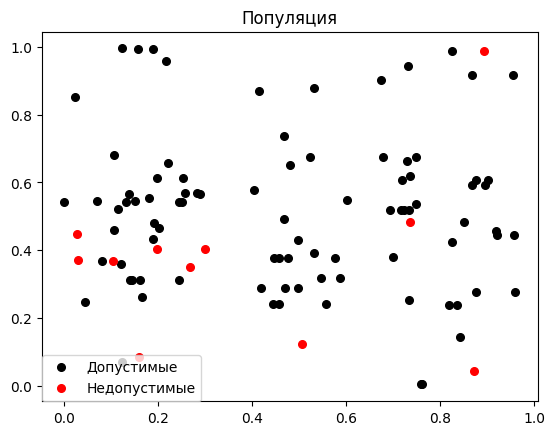

Pareto: 6 optimal values, 6 objects


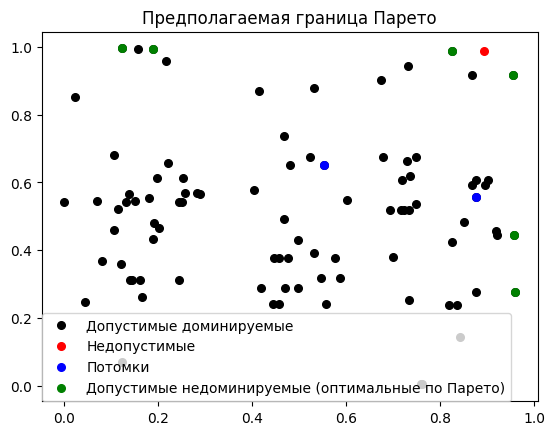

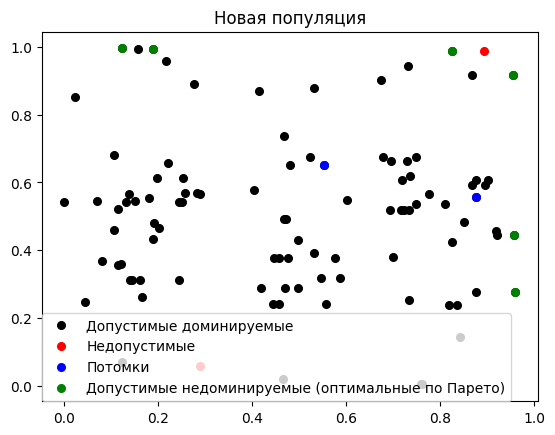

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[-3.4375, 1.5625, 0.3125, 2.8125], [-1.5625, -1.5625, 2.8125, 3.4375], [2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-4.6875, 2.8125, -0.9375, 3.4375], [-2.1875, -2.8125, -0.3125, 

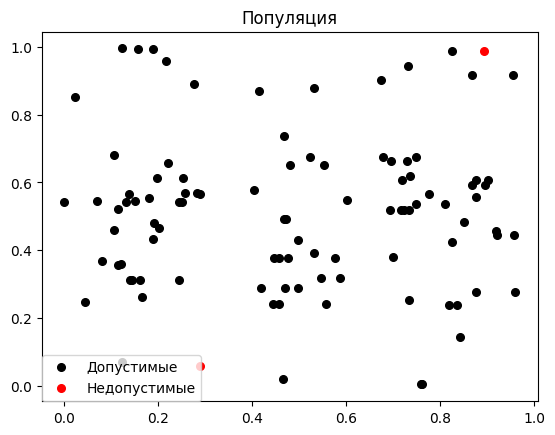

Pareto: 6 optimal values, 6 objects


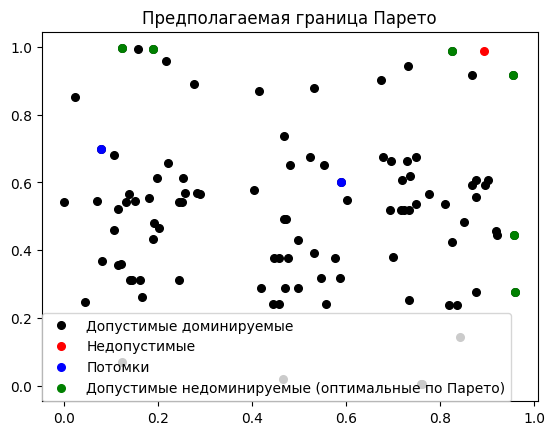

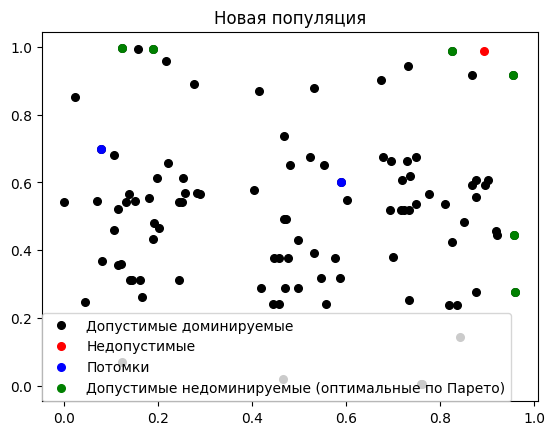

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[-3.4375, 1.5625, 4.6875, -3.4375], [4.0625, 1.5625, 2.1875, -3.4375], [2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-2.1875, 4.6875, 1.5625, -0.3125], [-4.6875, 2.8125, -0.9375, 3

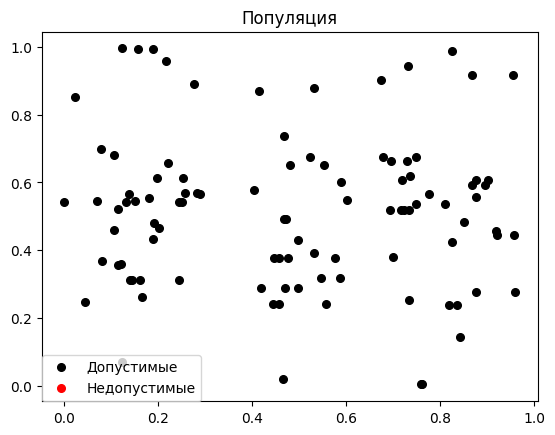

Pareto: 6 optimal values, 6 objects


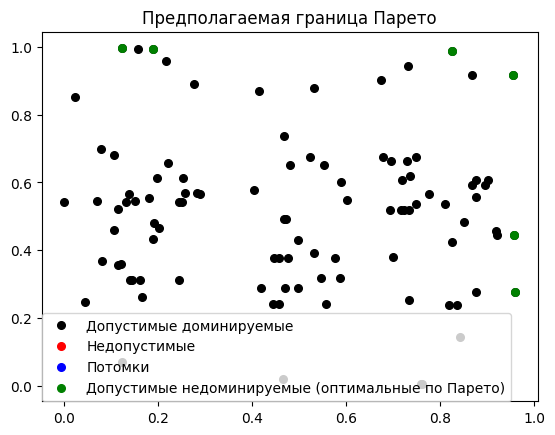

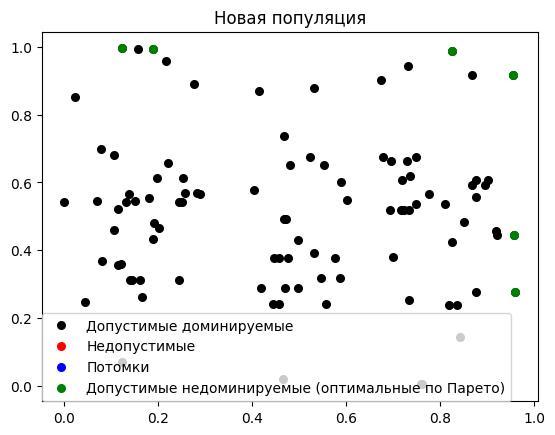

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-2.1875, 4.6875, 1.5625, -0.3125], [-4.6875, 2.8125, -0.9375, 3.4375], [-2.1875, -2.8125, -0.3125, 3.4375], [-3.4375, -1.5625, 0.3125,

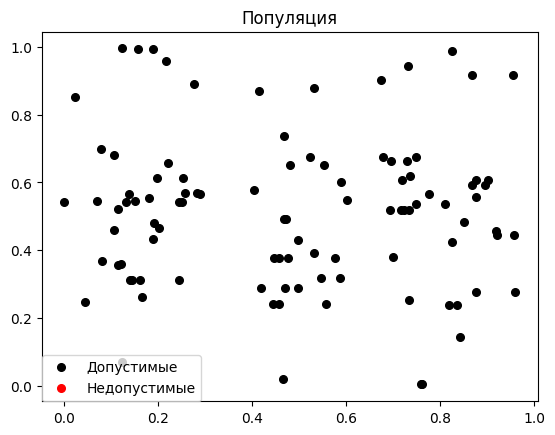

Pareto: 6 optimal values, 6 objects


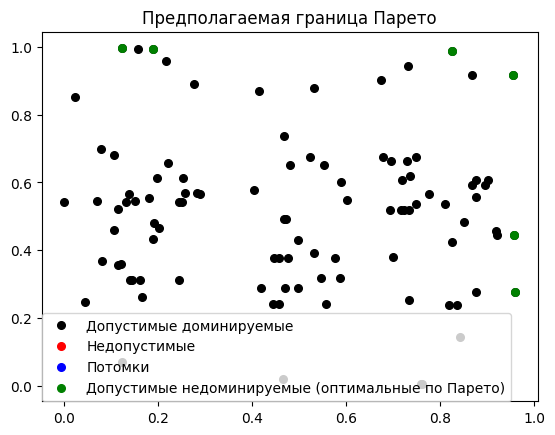

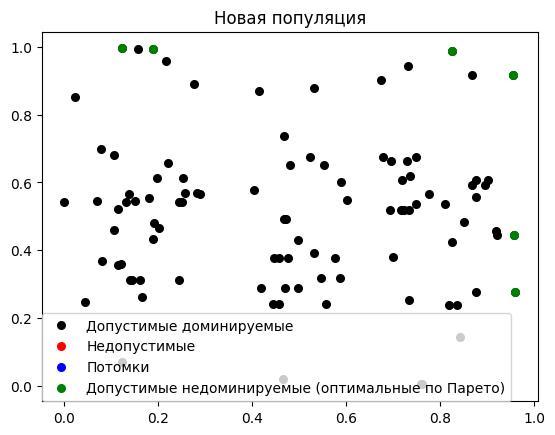

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-2.1875, 4.6875, 1.5625, -0.3125], [-4.6875, 2.8125, -0.9375, 3.4375], [-2.1875, -2.8125, -0.3125, 3.4375], [-3.4375, -1.5625, 0.3125,

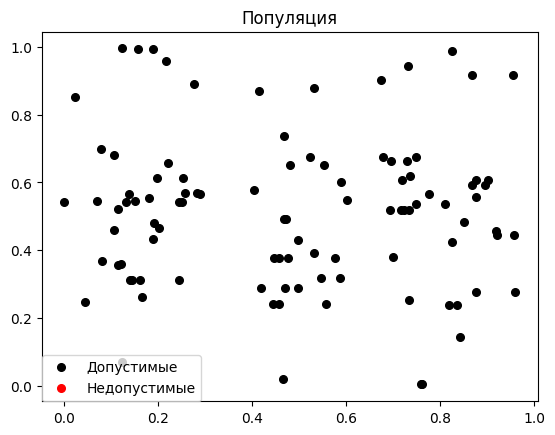

Pareto: 6 optimal values, 6 objects


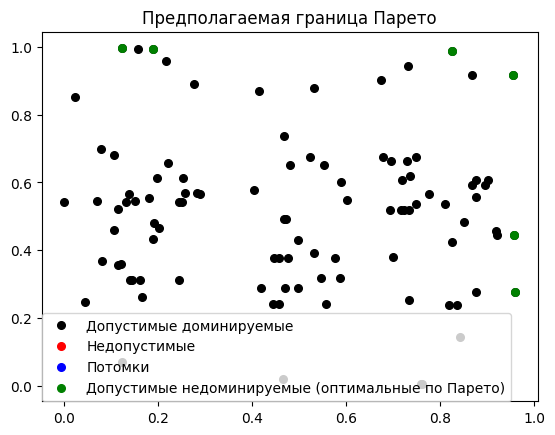

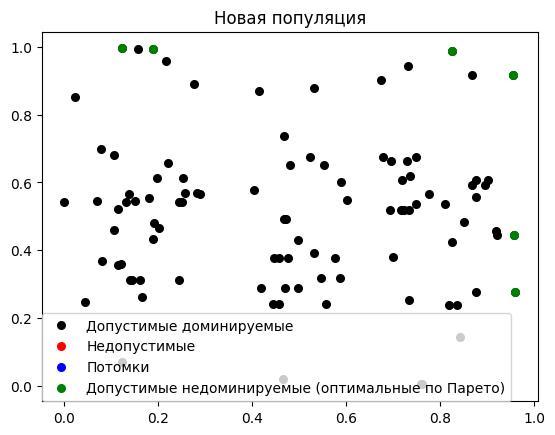

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-2.1875, 4.6875, 1.5625, -0.3125], [-4.6875, 2.8125, -0.9375, 3.4375], [-2.1875, -2.8125, -0.3125, 3.4375], [-3.4375, -1.5625, 0.3125,

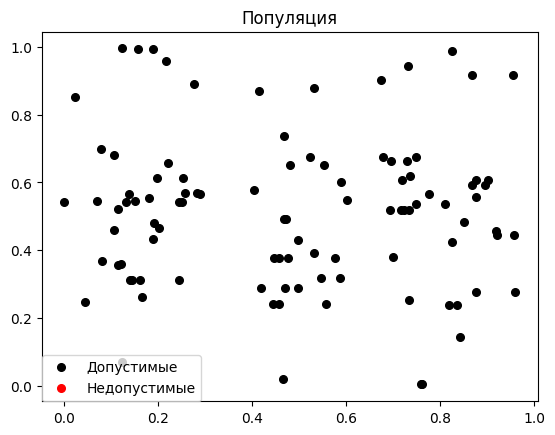

Pareto: 6 optimal values, 6 objects


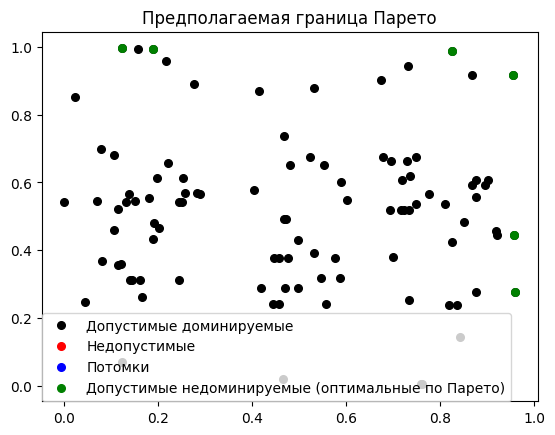

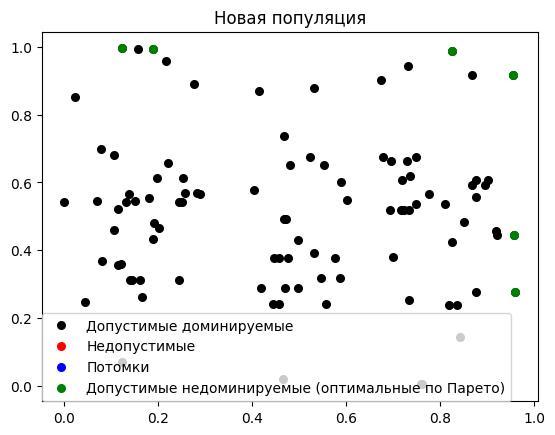

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-2.1875, 4.6875, 1.5625, -0.3125], [-4.6875, 2.8125, -0.9375, 3.4375], [-2.1875, -2.8125, -0.3125, 3.4375], [-3.4375, -1.5625, 0.3125,

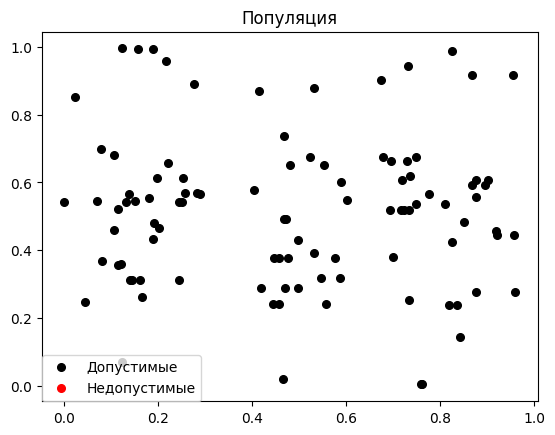

Pareto: 6 optimal values, 6 objects


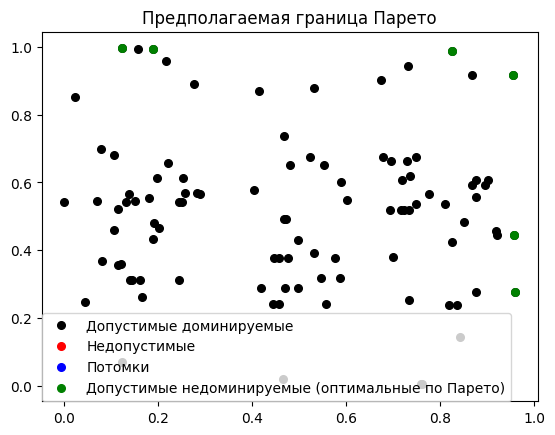

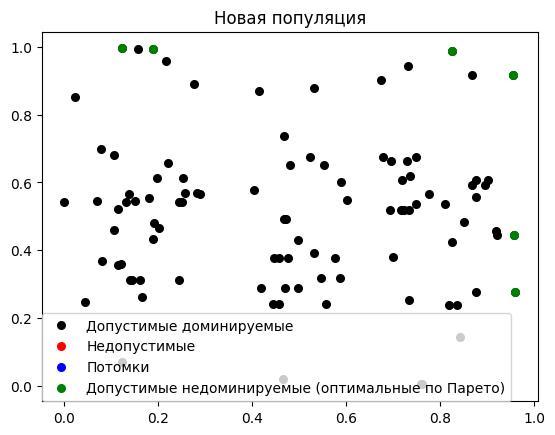

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-2.1875, 4.6875, 1.5625, -0.3125], [-4.6875, 2.8125, -0.9375, 3.4375], [-2.1875, -2.8125, -0.3125, 3.4375], [-3.4375, -1.5625, 0.3125,

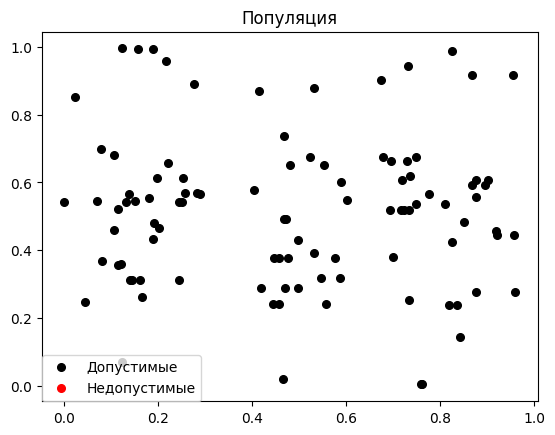

Pareto: 6 optimal values, 6 objects


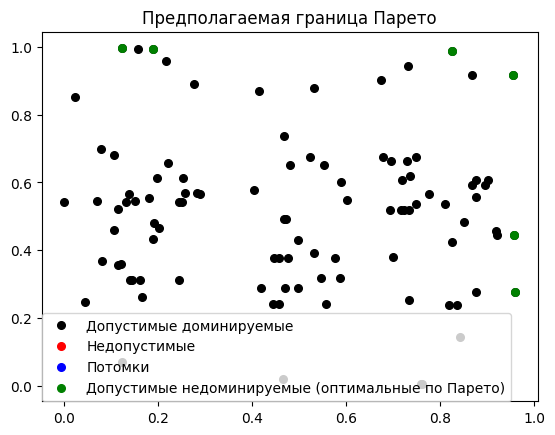

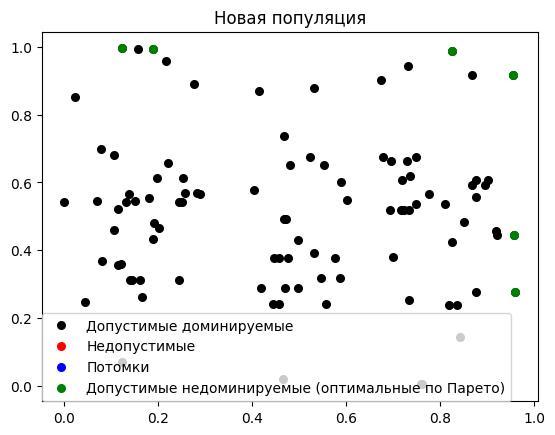

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-2.1875, 4.6875, 1.5625, -0.3125], [-4.6875, 2.8125, -0.9375, 3.4375], [-2.1875, -2.8125, -0.3125, 3.4375], [-3.4375, -1.5625, 0.3125,

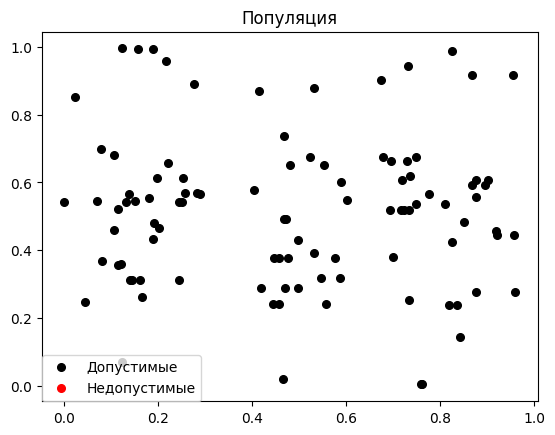

Pareto: 6 optimal values, 6 objects


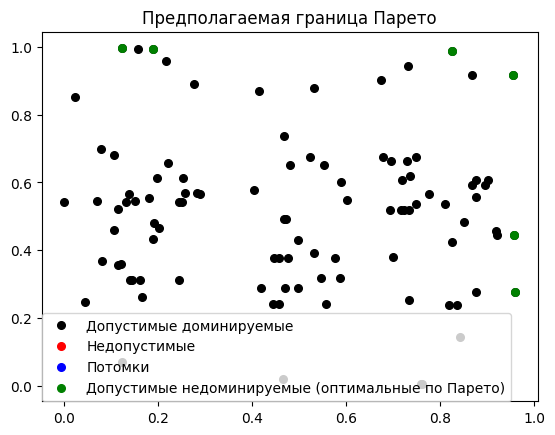

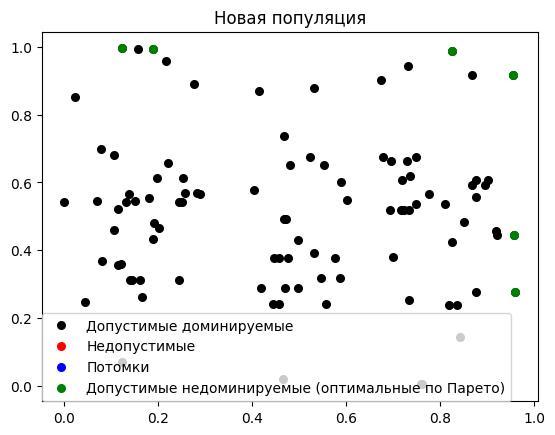

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125], [0.3125, -4.6875, -0.3125, 0.3125], [-2.8125, 3.4375, -0.9375, -0.3125], [-2.1875, -0.3125, -0.9375, 0.3125], [-0.3125, 2.8125, -2.1875, 0.3125], [2.1875, 1.5625, 4.0625, 0.3125], [0.3125, 3.4375, -1.5625, -0.3125], [2.1875, 1.5625, -2.8125, 0.3125], [-2.1875, 4.6875, 1.5625, -0.3125], [-4.6875, 2.8125, -0.9375, 3.4375], [-2.1875, -2.8125, -0.3125, 3.4375], [-3.4375, -1.5625, 0.3125

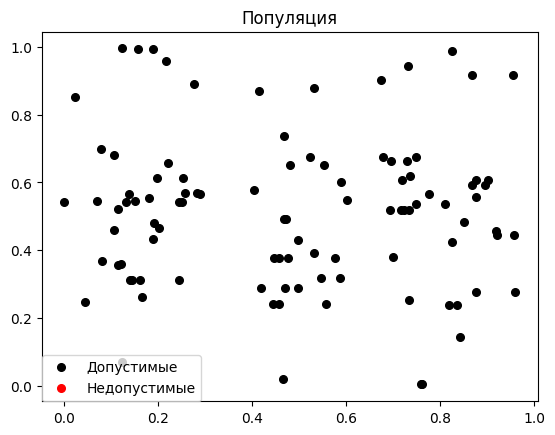

Pareto: 6 optimal values, 6 objects


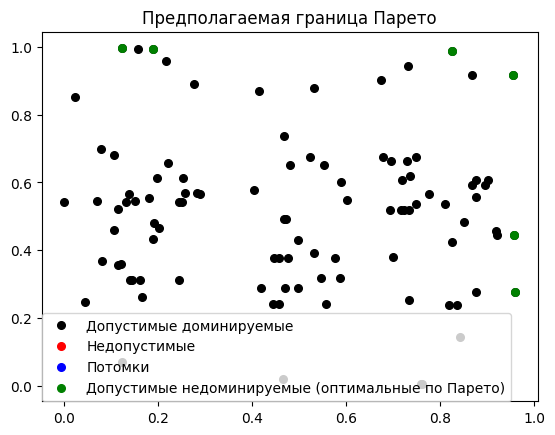

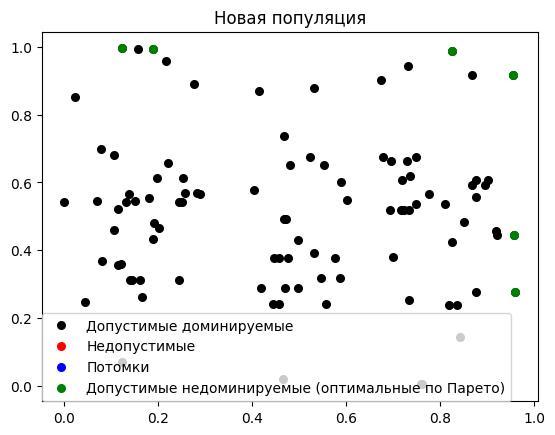

Optimal: [[2.1875, -3.4375, -0.3125, 2.8125], [0.3125, 4.6875, 4.0625, 0.3125], [2.8125, -3.4375, 4.6875, 0.3125], [-0.9375, 1.5625, -0.3125, 1.5625], [-0.9375, -4.0625, -0.3125, 0.3125], [-2.8125, 4.6875, -3.4375, -0.3125]]
A1 =  0.30000000000000004
A2 =  0.7
--- 3.0040292739868164 seconds ---
_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[0.9375, 0.9375, 4.0625, -1.5625], [-0.3125, -4.0625, -1.5625, -0.3125], [3.4375, 4.6875, -2.8125, -3.4375], [2.8125, -1.5625, 2.8125, 1.5625], [-4.0625, 0.3125, -0.3125, 4.0625], [2.1875, 4.0625, 2.8125, 0.9375], [-4.0625, 4.6875, 2.8125, 1.5625], [-0.3125, -2.8125, -2.1875, -2.1875], [3.4375, -4.0625, -4.6875, -0.3125], [0.3125, -2.1875, 0.9375, -1.5625], [-0.3125, -3.4375, -2.8125, -0.9375], [2.1875, 1.5625, 0.3125, -0.9375], [-0.9375, 0.9375, 4.6875, -4.6875], [1.5625, 2.1875, 2.8125, 3.4375], [3.4375, 0.9375, 2.1875, -1

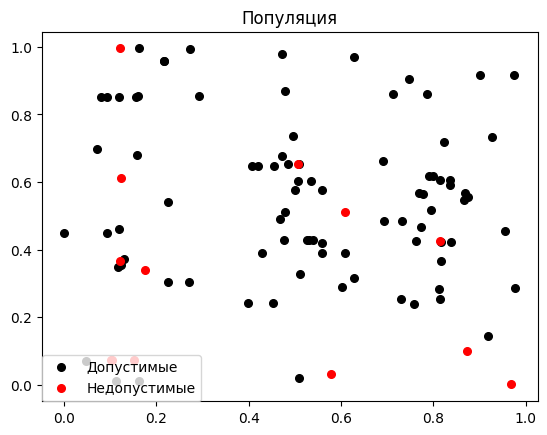

Pareto: 6 optimal values, 6 objects


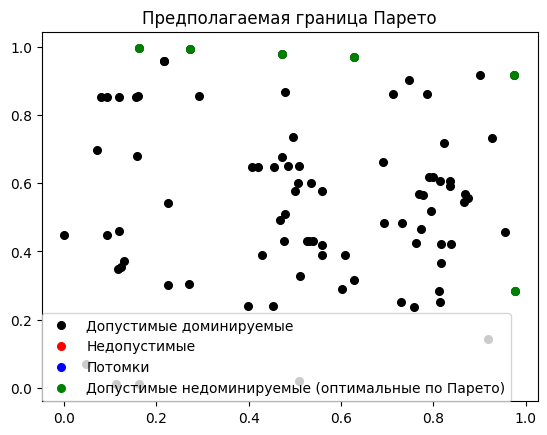

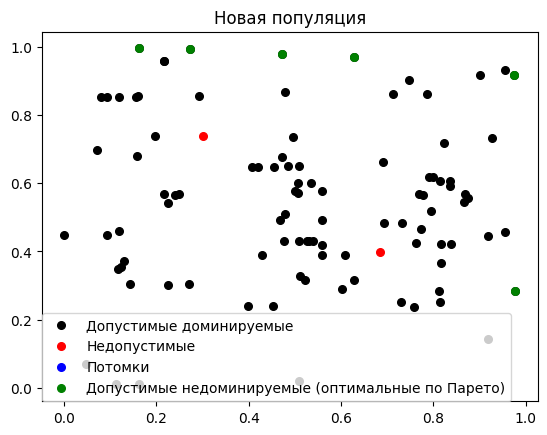

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.1875, -3.4375, 0.9375], [-3.4375, 3.4375, 3.4375, 0.9375], [2.1875, 1.5625, 0

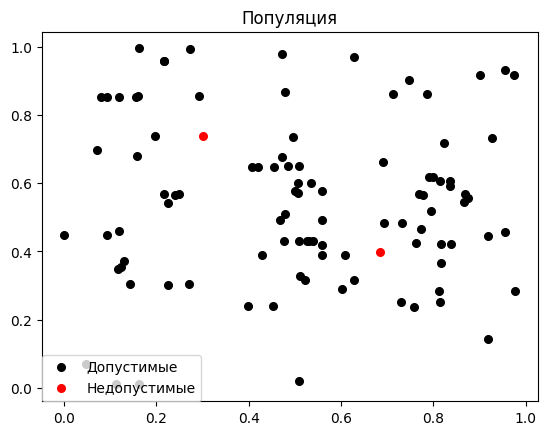

Pareto: 7 optimal values, 7 objects


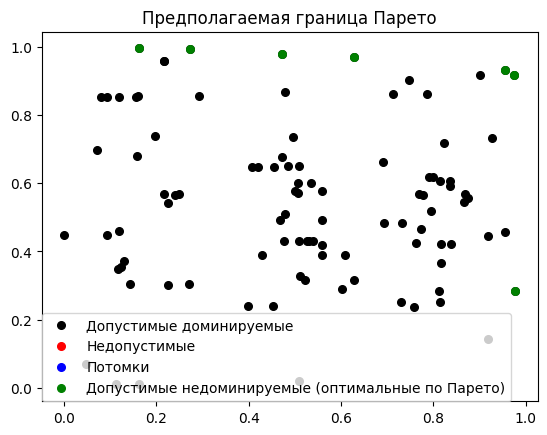

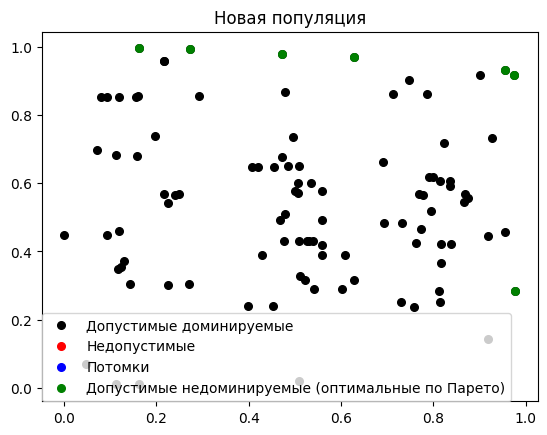

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.187

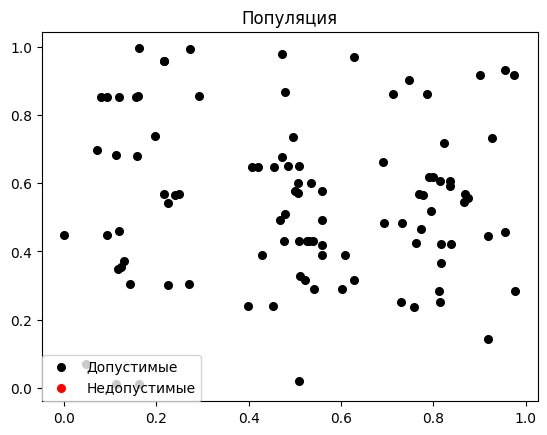

Pareto: 7 optimal values, 7 objects


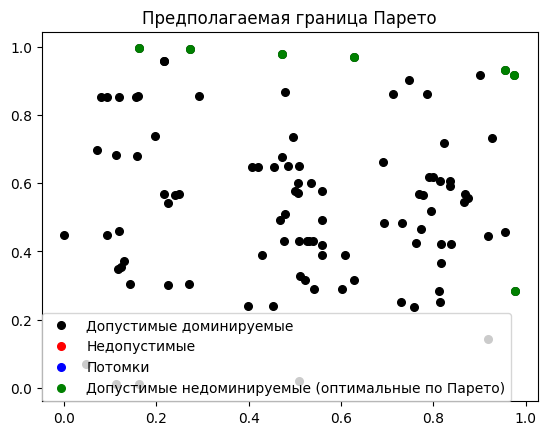

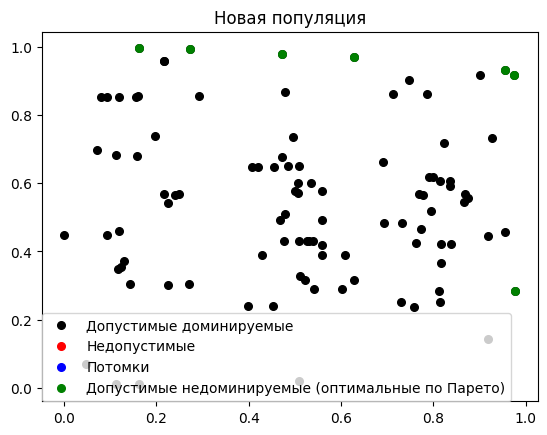

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.187

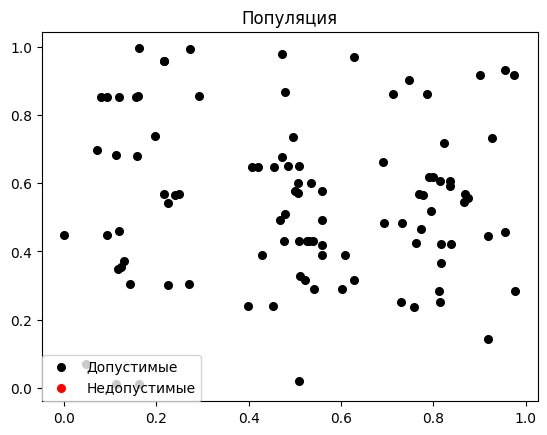

Pareto: 7 optimal values, 7 objects


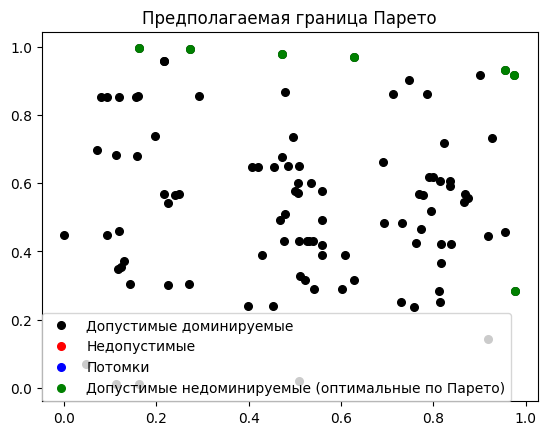

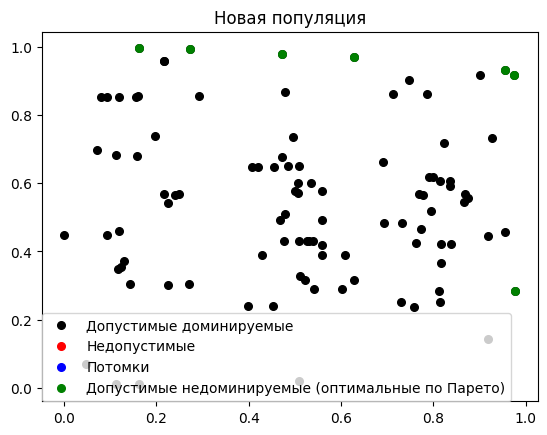

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.187

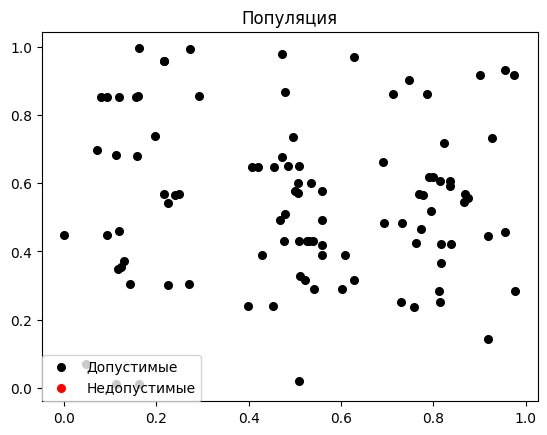

Pareto: 7 optimal values, 7 objects


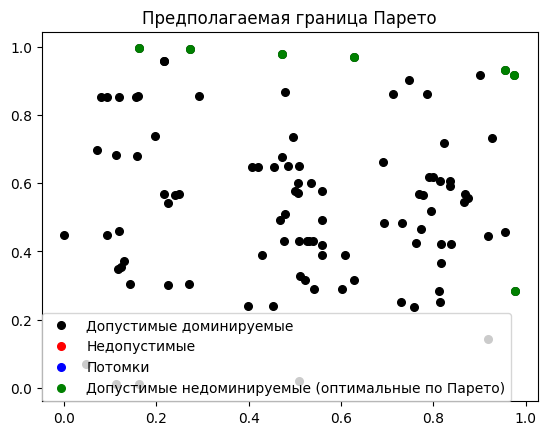

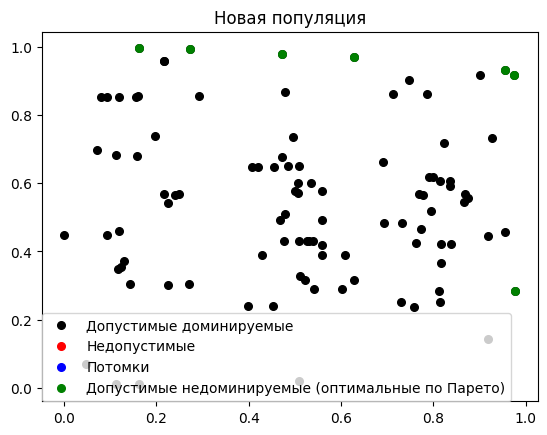

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.187

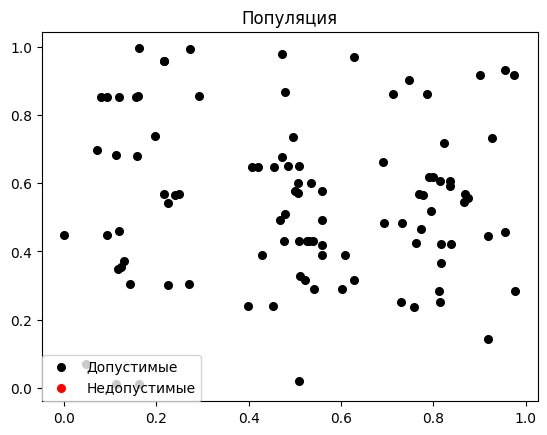

Pareto: 7 optimal values, 7 objects


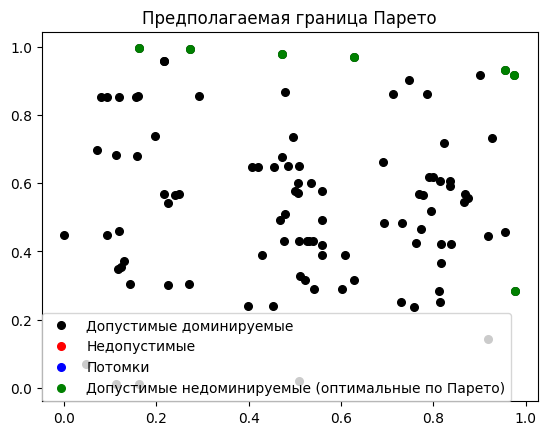

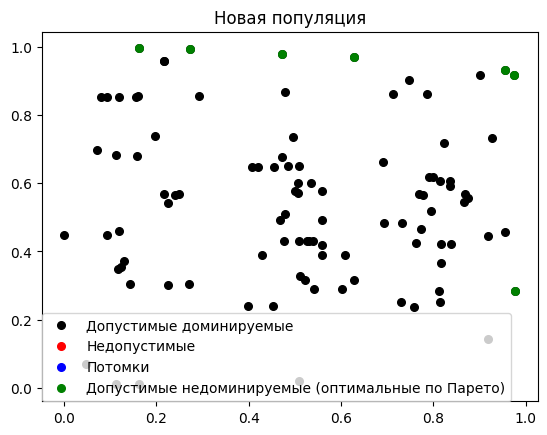

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.187

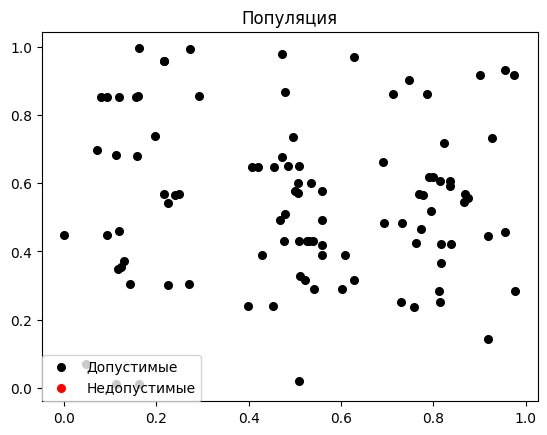

Pareto: 7 optimal values, 7 objects


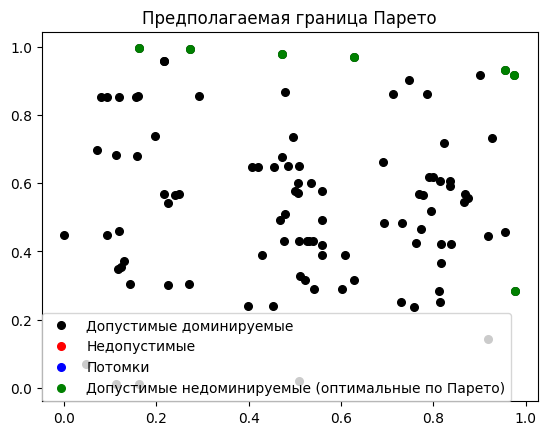

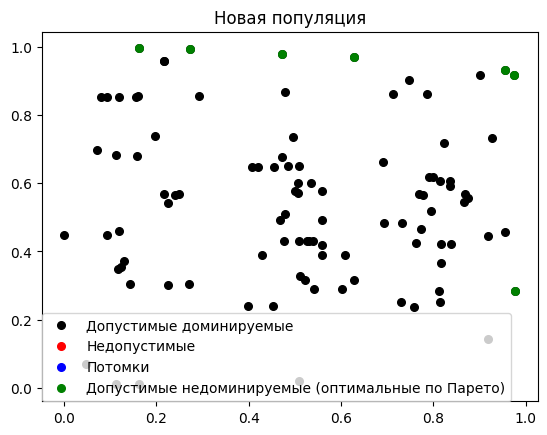

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.187

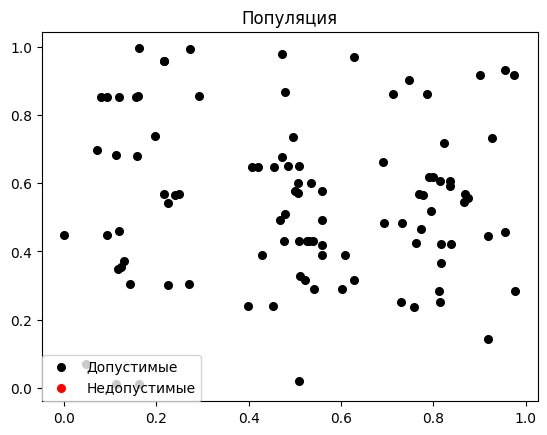

Pareto: 7 optimal values, 7 objects


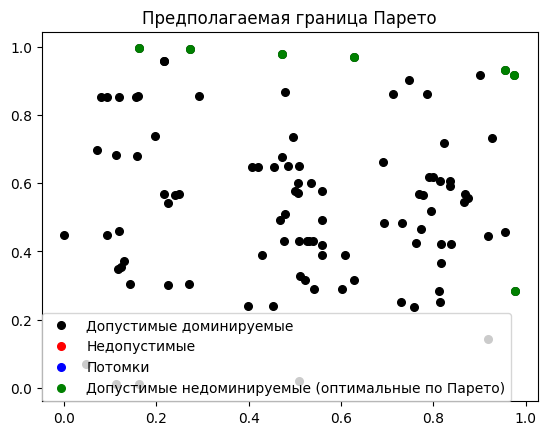

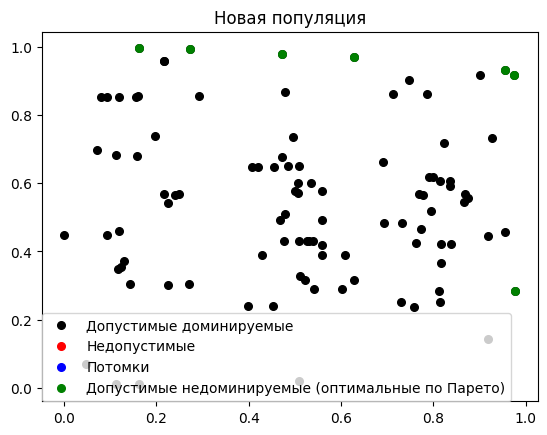

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.187

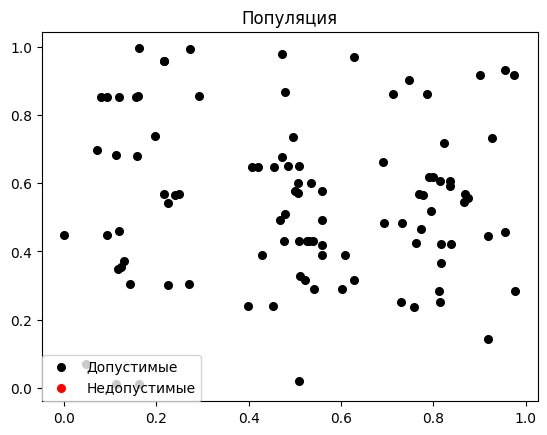

Pareto: 7 optimal values, 7 objects


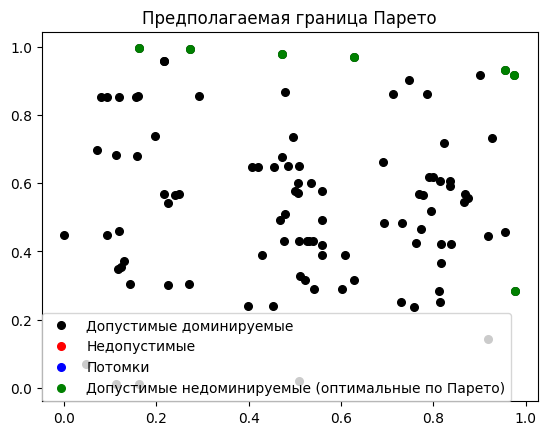

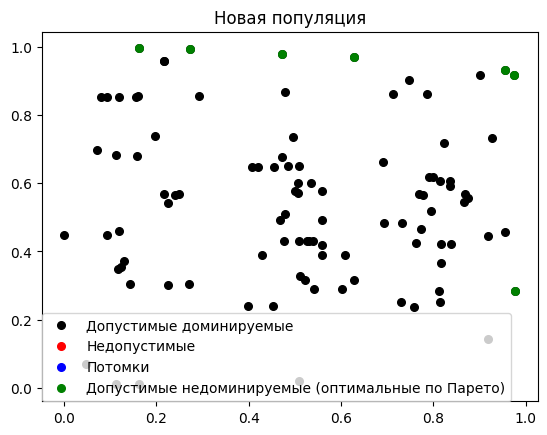

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125], [0.3125, 2.1875, 0.3125, -0.3125], [4.6875, -2.1875, -0.9375, 0.3125], [-0.9375, -2.1875, -3.4375, 0.3125], [-3.4375, -0.3125, -0.3125, -3.4375], [4.0625, 0.3125, -3.4375, 0.3125], [0.3125, -0.3125, -3.4375, 3.4375], [-0.3125, -2.8125, -2.8125, 0.3125], [0.9375, 1.5625, 0.3125, -3.4375], [-4.0625, 2.18

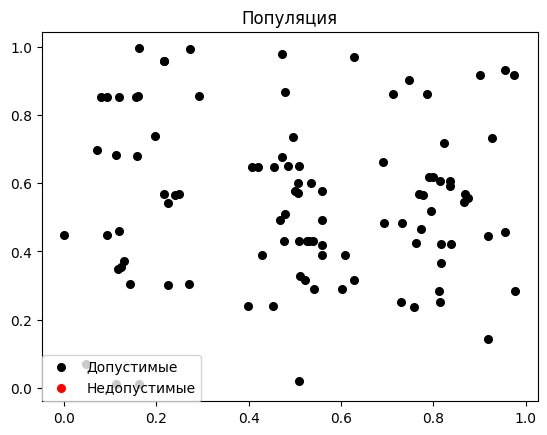

Pareto: 7 optimal values, 7 objects


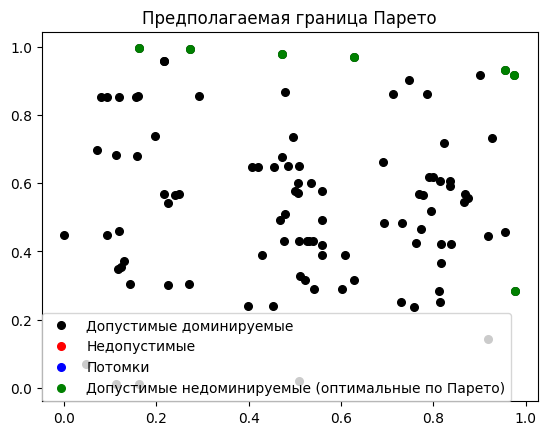

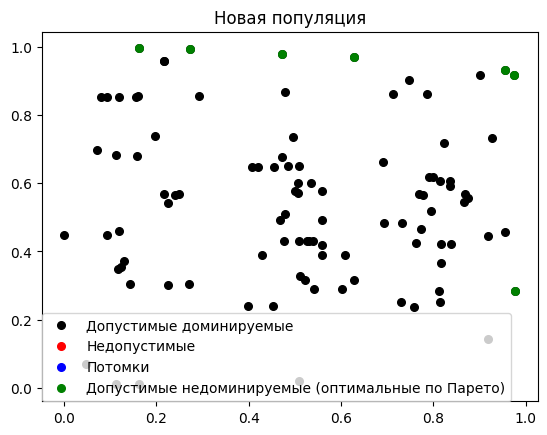

Optimal: [[-4.0625, 0.3125, -0.3125, 4.0625], [1.5625, -0.3125, -2.1875, -0.3125], [2.1875, -0.9375, 4.0625, 0.3125], [-0.9375, -1.5625, -4.6875, -0.3125], [-1.5625, -1.5625, 0.3125, -0.3125], [4.0625, 2.1875, -2.8125, -0.3125], [-0.9375, 4.0625, -0.3125, -0.3125]]
A1 =  0.4
A2 =  0.6
--- 3.2174551486968994 seconds ---
_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[-4.6875, 2.8125, 4.0625, -4.0625], [0.9375, 4.6875, 4.6875, 1.5625], [-2.1875, -0.9375, 4.0625, 3.4375], [-2.8125, 4.6875, 0.3125, 3.4375], [-4.6875, 2.1875, 0.9375, 2.1875], [-3.4375, 1.5625, -2.8125, 0.9375], [-2.1875, -3.4375, -0.3125, -3.4375], [-0.9375, 4.0625, 4.6875, 2.1875], [4.6875, -3.4375, 4.6875, 2.1875], [4.6875, 1.5625, 0.9375, 1.5625], [-4.6875, -1.5625, 2.8125, 4.6875], [-0.9375, 4.0625, -0.3125, 2.1875], [0.9375, 1.5625, -4.0625, 4.6875], [-0.3125, -1.5625, 2.8125, -2.8125], [1.5625

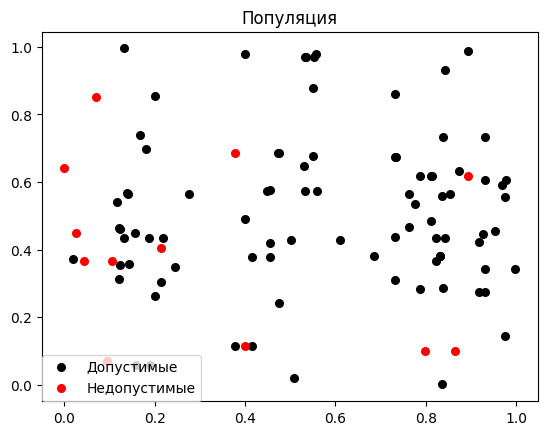

Pareto: 5 optimal values, 5 objects


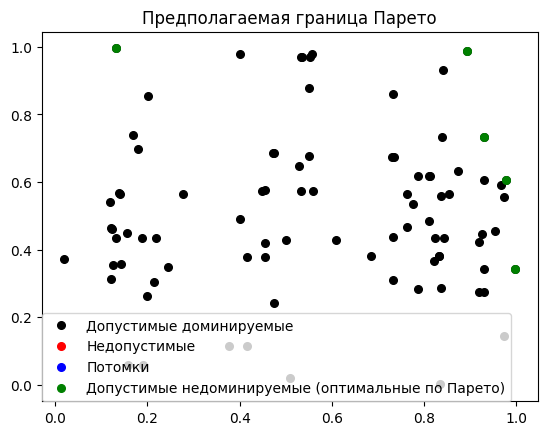

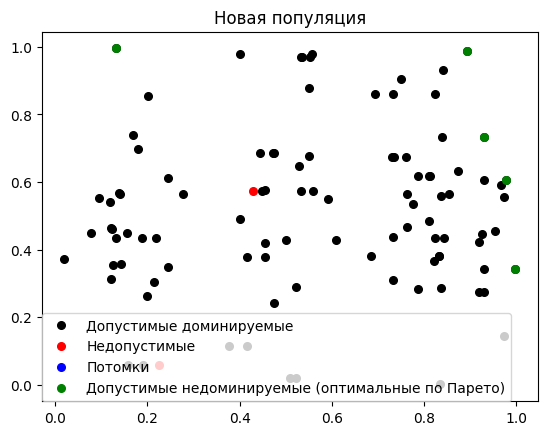

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0.3125], [-0.9375, 2.8125, 2.1875, 0.3125], [-0.3125, -4.0625, -3.4375, 0.9375], [-0.3125, -4.0625, 2.1875, -0

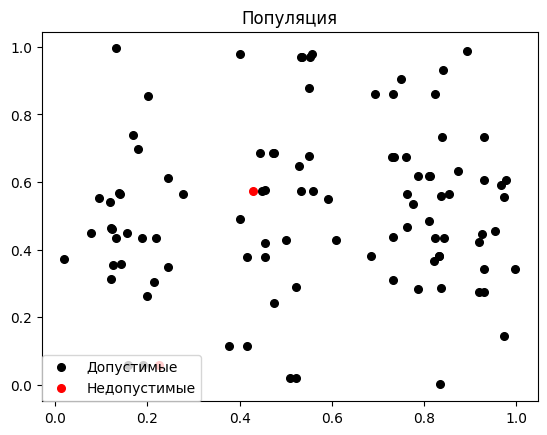

Pareto: 5 optimal values, 5 objects


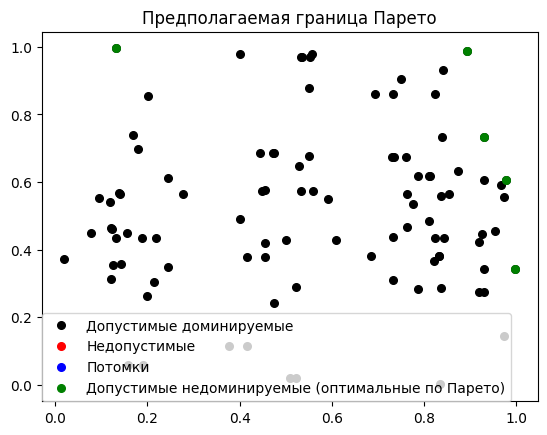

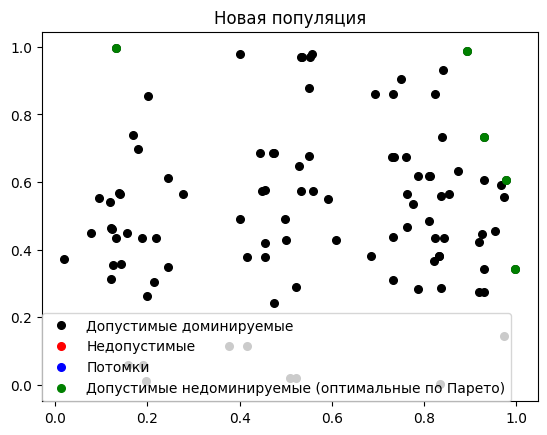

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [0.3125, 0.3125, 3.4375, -0.3125], [-2.1875, -2.1875, 0.9375, -0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [4.6875, -0.3125, 3.4375, -0.3125], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0.

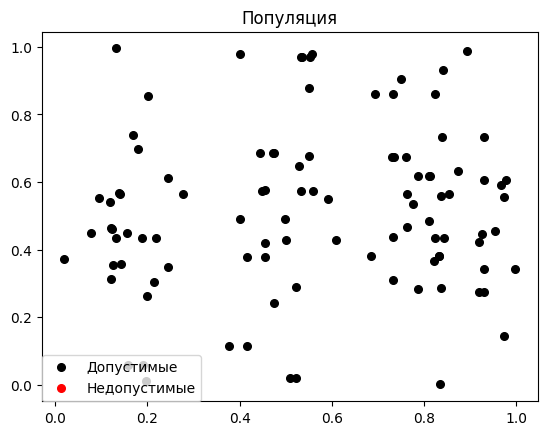

Pareto: 5 optimal values, 5 objects


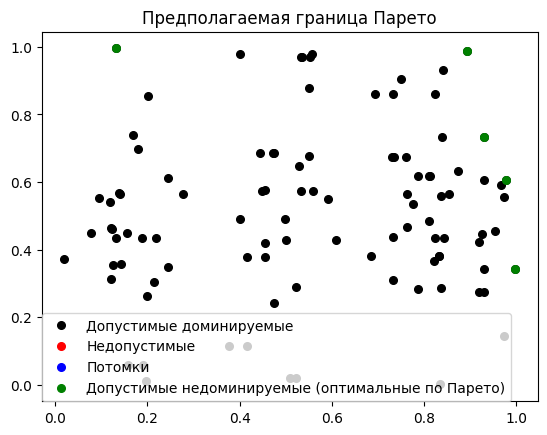

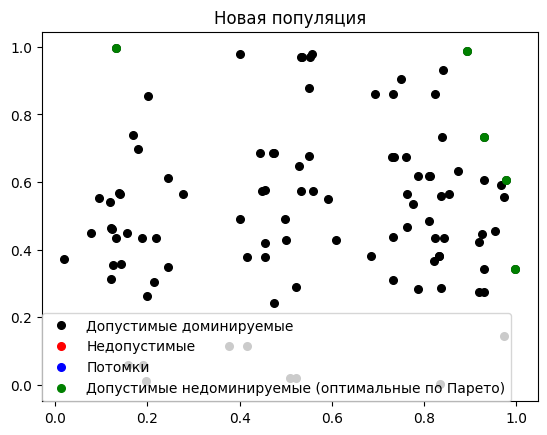

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [0.3125, 0.3125, 3.4375, -0.3125], [-2.1875, -2.1875, 0.9375, -0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [4.6875, -0.3125, 3.4375, -0.3125], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0.

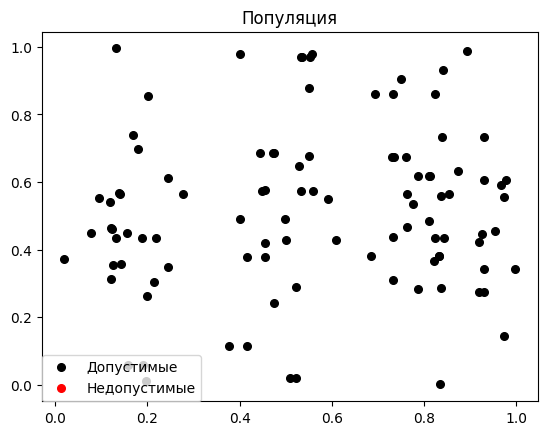

Pareto: 5 optimal values, 5 objects


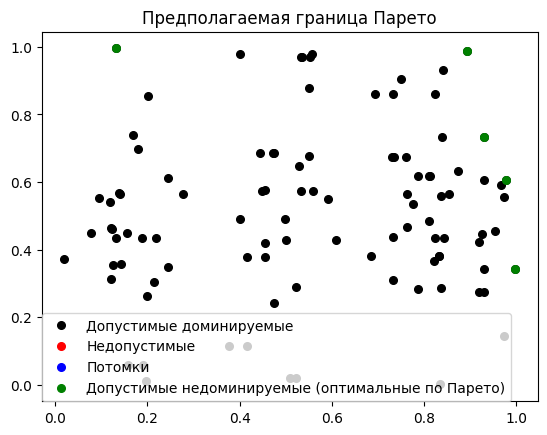

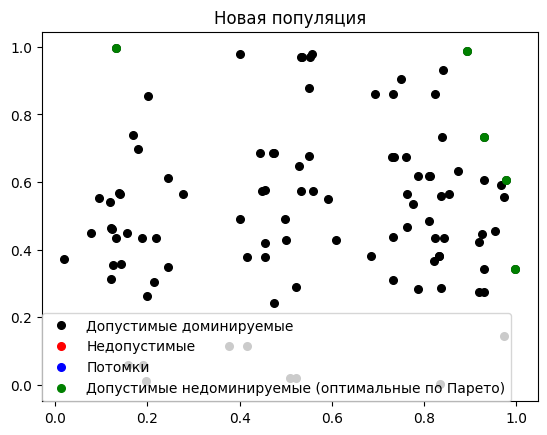

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [0.3125, 0.3125, 3.4375, -0.3125], [-2.1875, -2.1875, 0.9375, -0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [4.6875, -0.3125, 3.4375, -0.3125], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0.

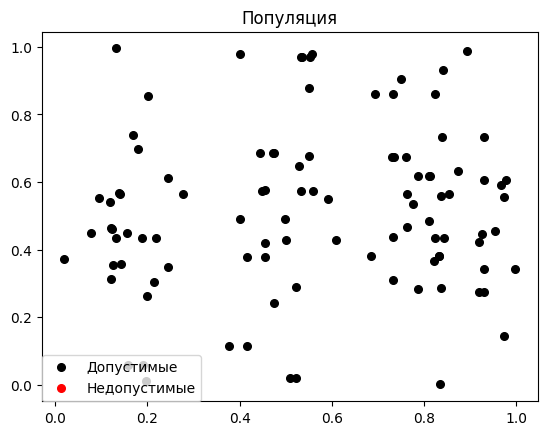

Pareto: 5 optimal values, 5 objects


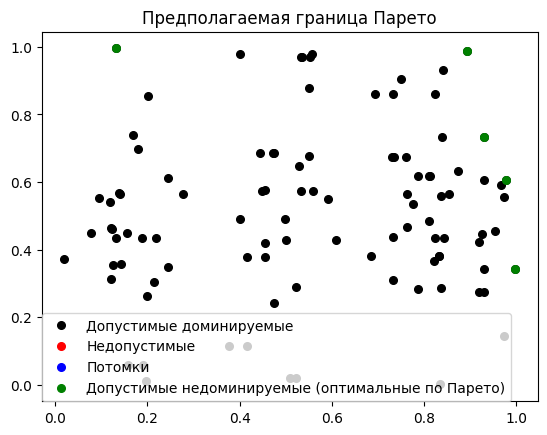

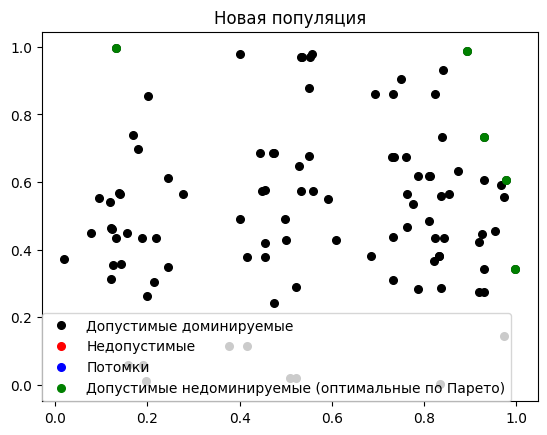

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [0.3125, 0.3125, 3.4375, -0.3125], [-2.1875, -2.1875, 0.9375, -0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [4.6875, -0.3125, 3.4375, -0.3125], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0.

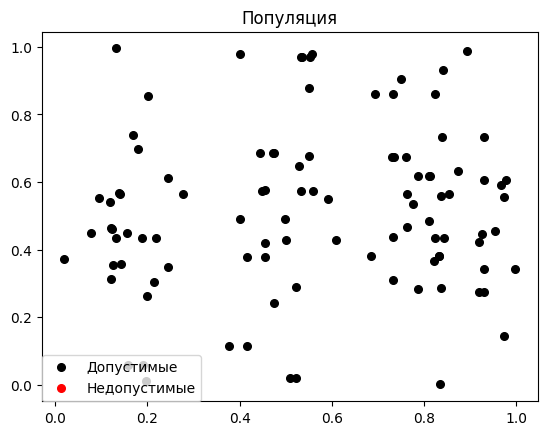

Pareto: 5 optimal values, 5 objects


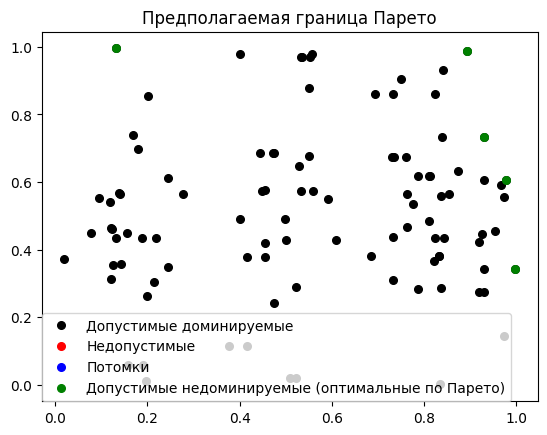

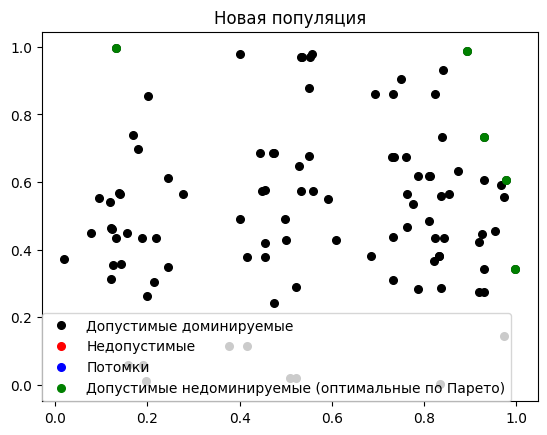

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [0.3125, 0.3125, 3.4375, -0.3125], [-2.1875, -2.1875, 0.9375, -0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [4.6875, -0.3125, 3.4375, -0.3125], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0.

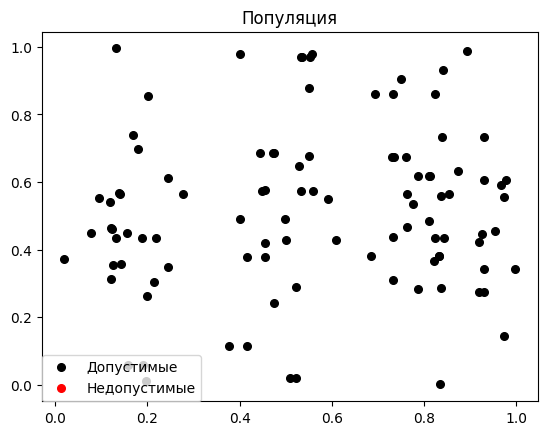

Pareto: 5 optimal values, 5 objects


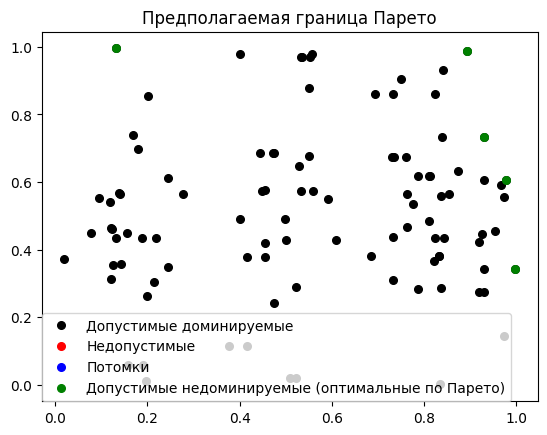

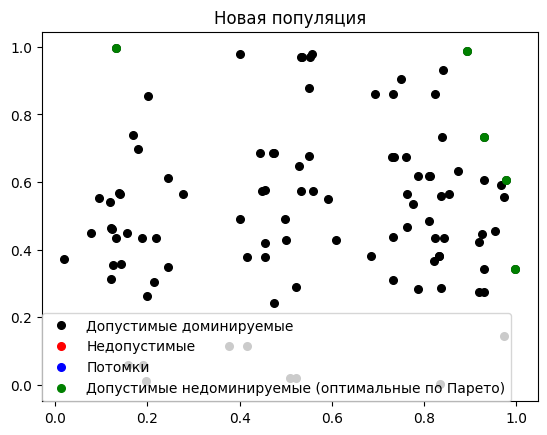

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [0.3125, 0.3125, 3.4375, -0.3125], [-2.1875, -2.1875, 0.9375, -0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [4.6875, -0.3125, 3.4375, -0.3125], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0.

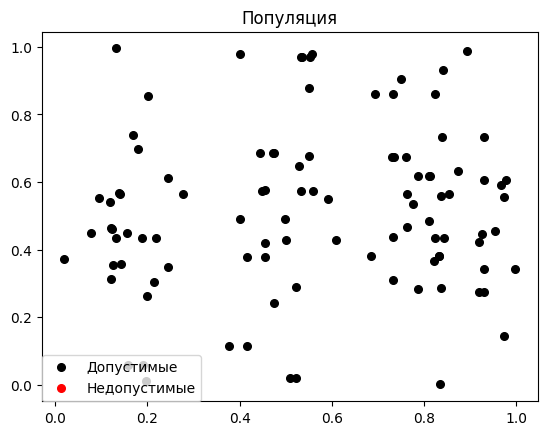

Pareto: 5 optimal values, 5 objects


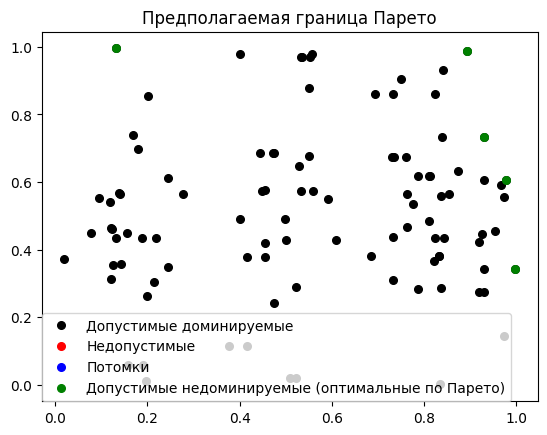

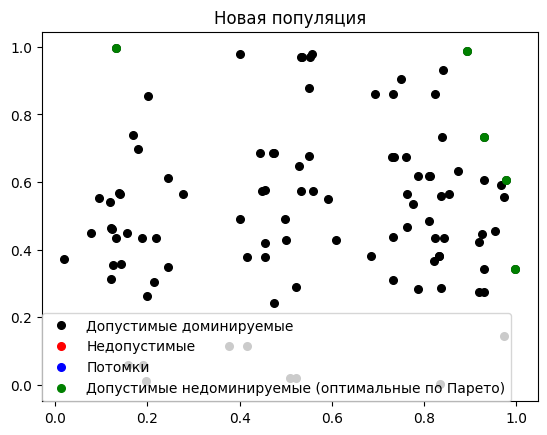

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [0.3125, 0.3125, 3.4375, -0.3125], [-2.1875, -2.1875, 0.9375, -0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [4.6875, -0.3125, 3.4375, -0.3125], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0.

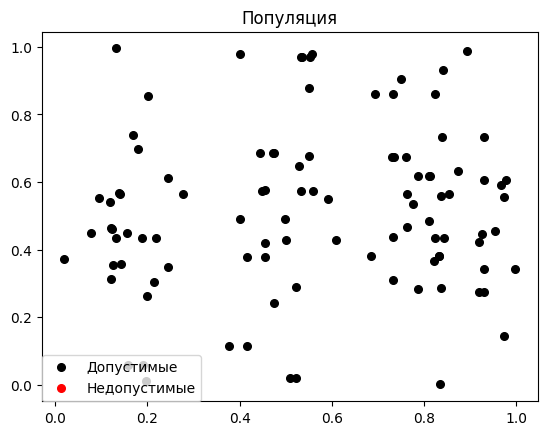

Pareto: 5 optimal values, 5 objects


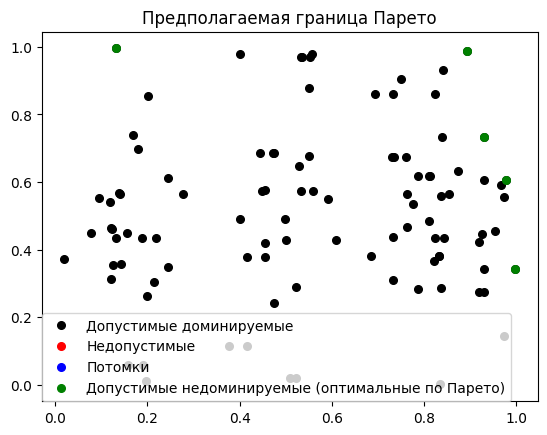

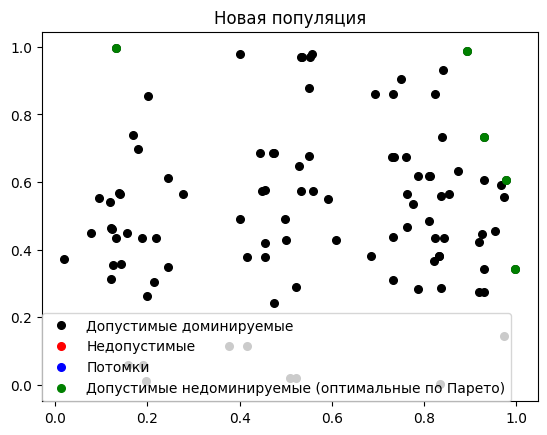

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125], [-4.0625, -4.0625, 0.3125, 0.3125], [0.3125, 0.3125, 3.4375, -0.3125], [-2.1875, -2.1875, 0.9375, -0.3125], [-2.1875, -3.4375, -3.4375, 0.3125], [-2.1875, -3.4375, -0.3125, -3.4375], [4.6875, -4.0625, 0.3125, -0.9375], [4.6875, -0.3125, 3.4375, -0.3125], [-2.8125, 4.6875, -0.3125, 3.4375], [-4.0625, -0.3125, 2.8125, 0.3125], [4.6875, 1.5625, 0.3125, 2.8125], [2.8125, -3.4375, 2.1875, 0.3125], [0.3125, 1.5625, 0.3125, 0.9375], [-4.0625, 2.1875, -2.1875, -0

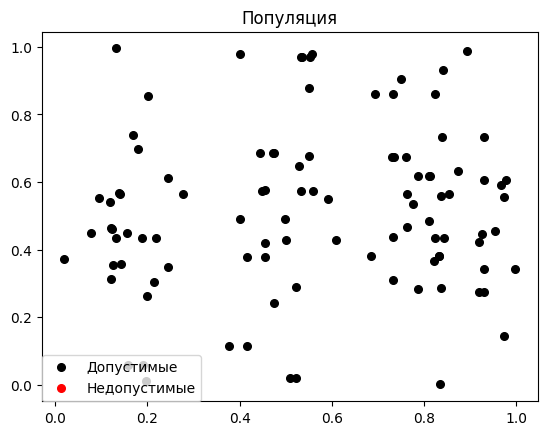

Pareto: 5 optimal values, 5 objects


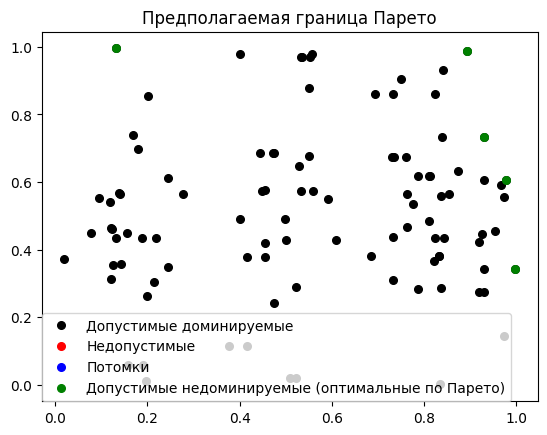

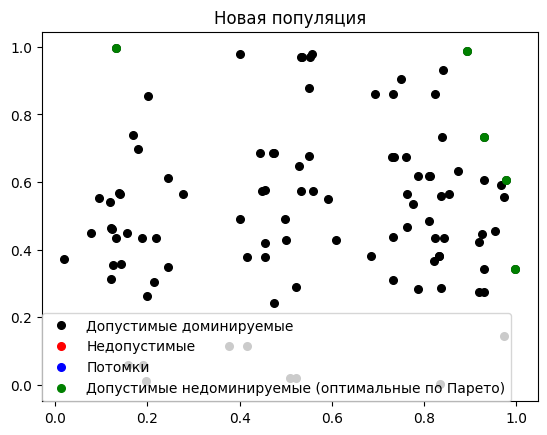

Optimal: [[-2.8125, 4.6875, 0.3125, 3.4375], [4.6875, -4.6875, 0.3125, 1.5625], [-1.5625, -4.6875, 3.4375, 0.3125], [0.9375, 0.3125, 0.3125, -3.4375], [2.8125, -0.3125, -4.6875, -0.3125]]
A1 =  0.5
A2 =  0.5
--- 3.3002495765686035 seconds ---
_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[3.4375, -2.1875, 1.5625, -2.1875], [-0.3125, -4.0625, 2.8125, -0.9375], [-0.3125, -0.9375, -1.5625, 4.0625], [-0.3125, 1.5625, -1.5625, 2.1875], [2.8125, 4.6875, 4.0625, 2.1875], [-0.9375, 2.8125, -2.1875, -3.4375], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, -4.0625, 2.1875, 2.1875], [-4.6875, 4.6875, -2.8125, 2.8125], [-0.9375, 0.3125, -4.0625, -0.3125], [-3.4375, -1.5625, -0.9375, 3.4375], [4.6875, -4.0625, 0.3125, 4.0625], [4.0625, 4.6875, 1.5625, -2.8125], [4.0625, 3.4375, -2.8125, -0.3125], [-4.6875, 3.4375, 3.4375, -4.6875], [-0.3125, -3.4375, 0.3125, -4.6875], [-4.06

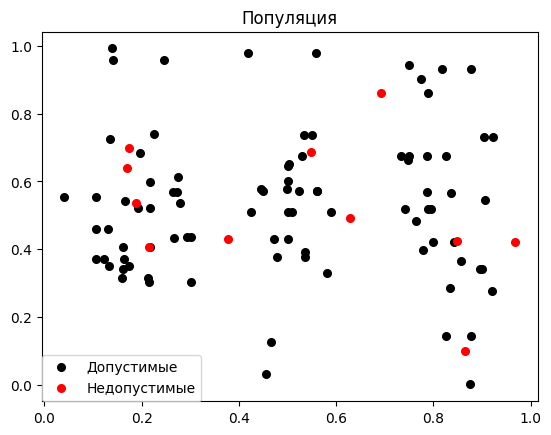

Pareto: 5 optimal values, 5 objects


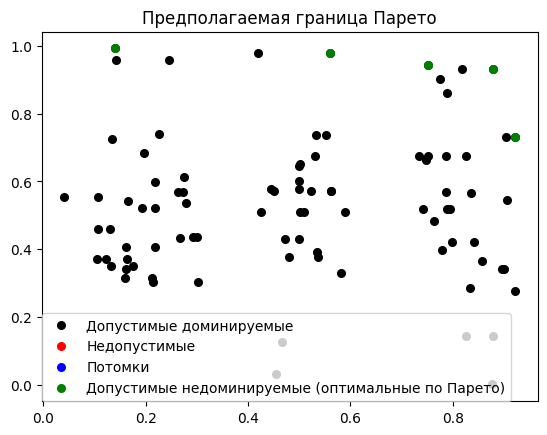

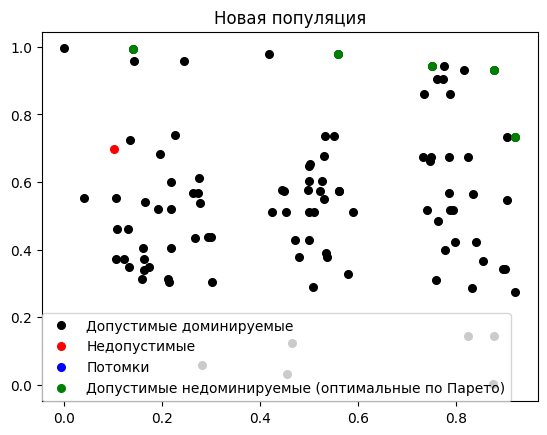

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [0.3125, -0.9375, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125, 0.9375, 2.1875], [2.1875, -2.8125, 0.9375, -3.4375], [4.6875, 2.1875, -0.9375, -3.4375], [-3.4375, -1.5625, -0.9375, 3.4375], [1.5625, -2.8125, 3.4375, 2.1875], [-0.3125, -2.8125, -3.4

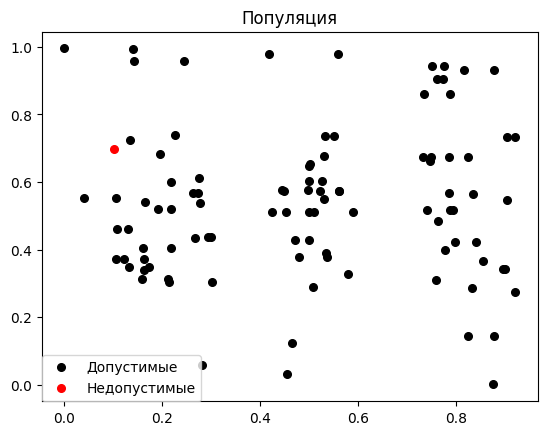

Pareto: 6 optimal values, 6 objects


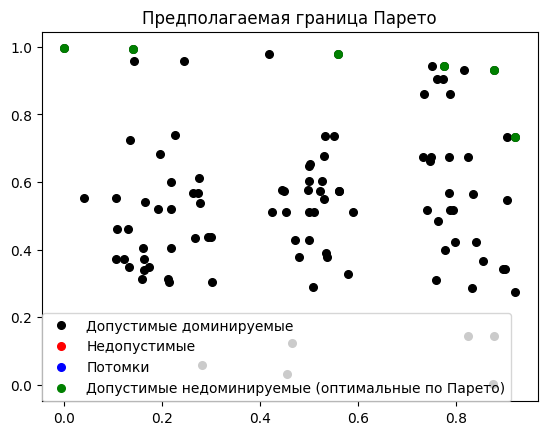

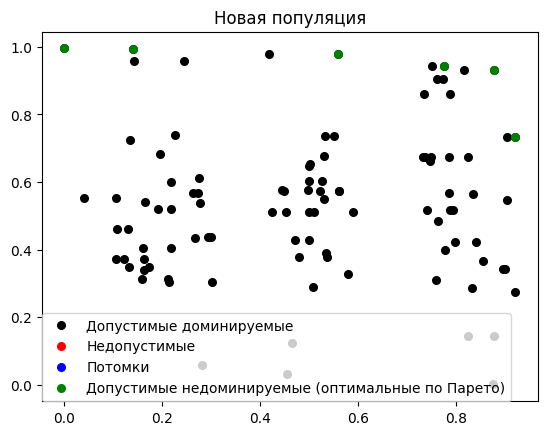

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, 2.1875, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [0.9375, 4.0625, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125, 

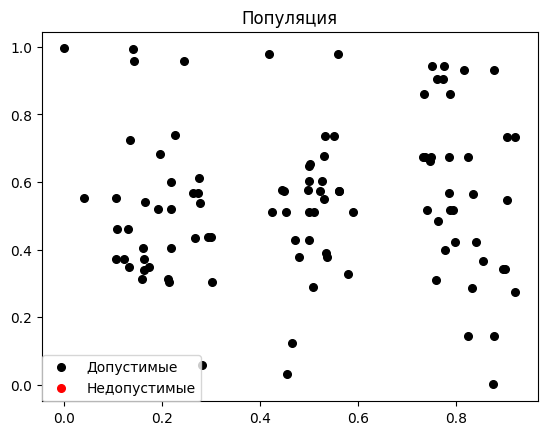

Pareto: 6 optimal values, 6 objects


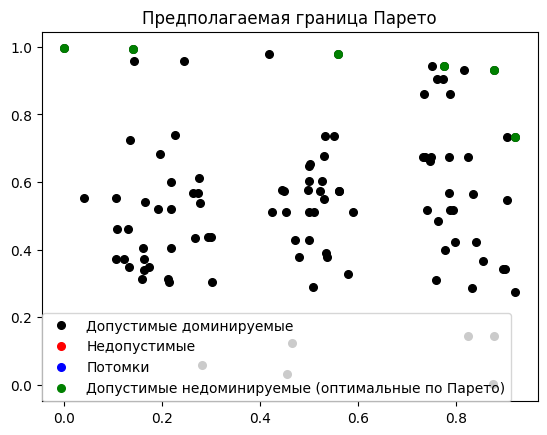

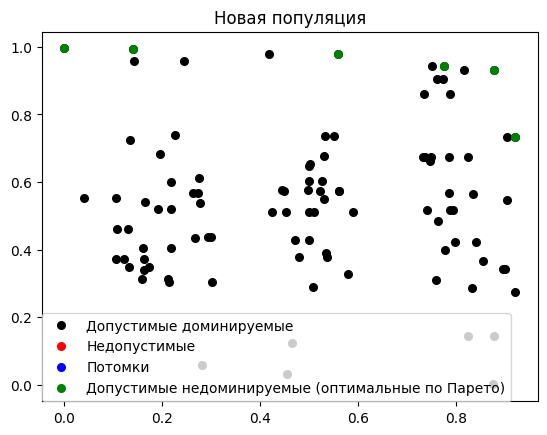

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, 2.1875, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [0.9375, 4.0625, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125, 

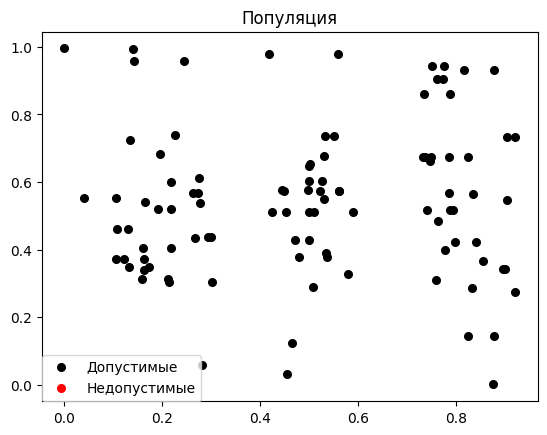

Pareto: 6 optimal values, 6 objects


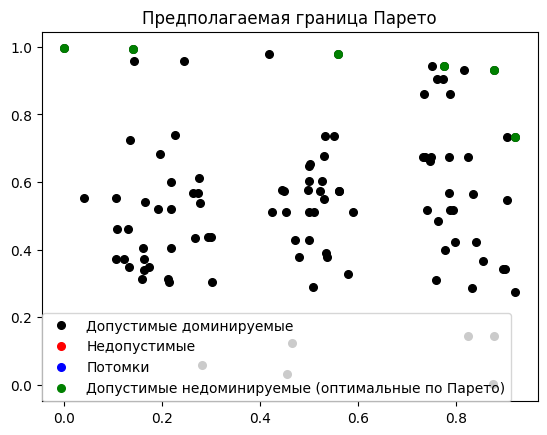

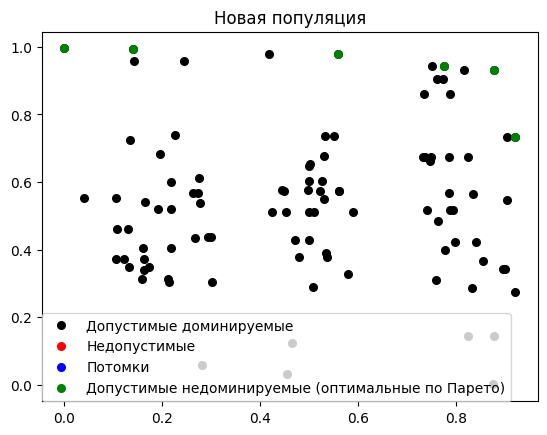

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, 2.1875, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [0.9375, 4.0625, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125, 

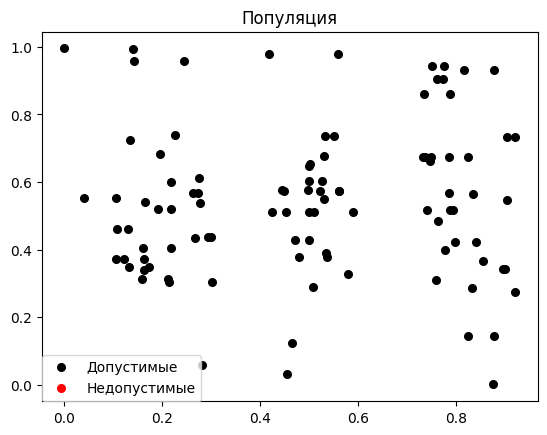

Pareto: 6 optimal values, 6 objects


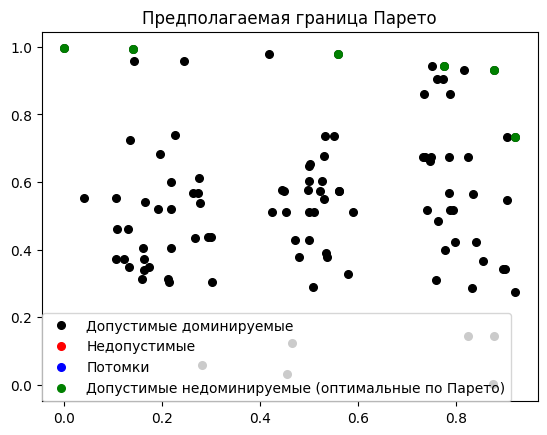

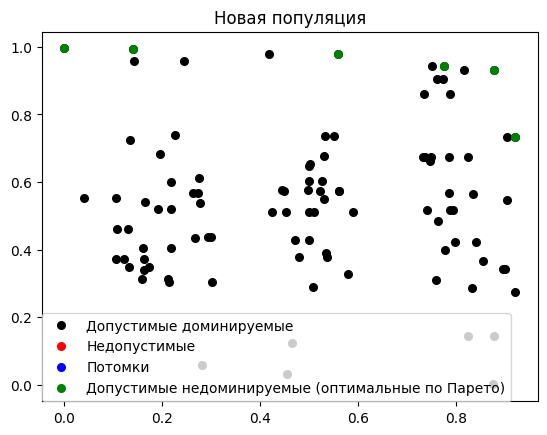

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, 2.1875, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [0.9375, 4.0625, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125, 

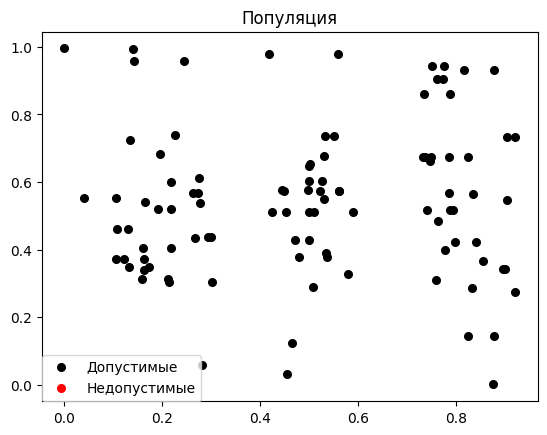

Pareto: 6 optimal values, 6 objects


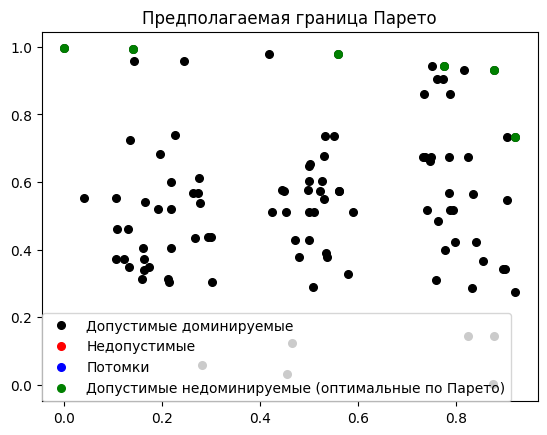

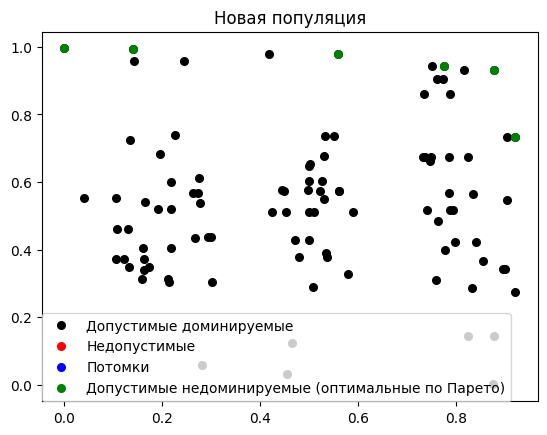

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, 2.1875, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [0.9375, 4.0625, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125, 

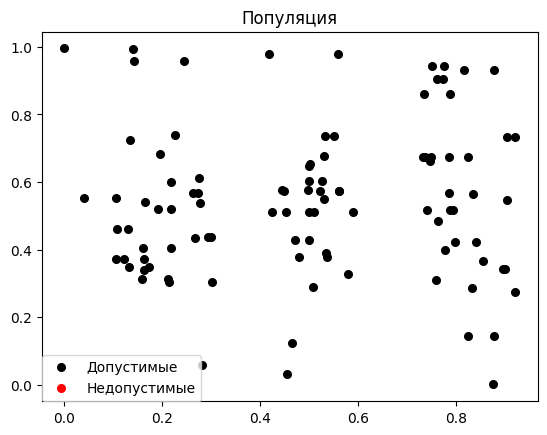

Pareto: 6 optimal values, 6 objects


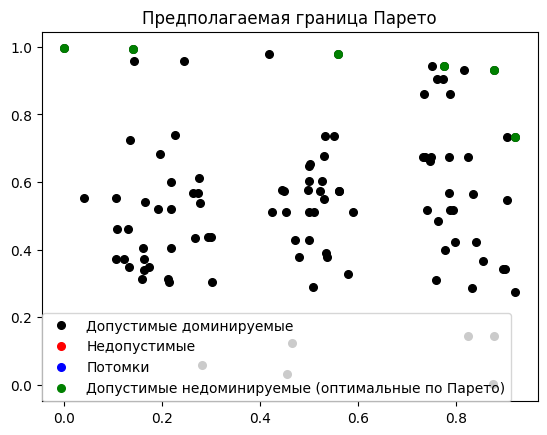

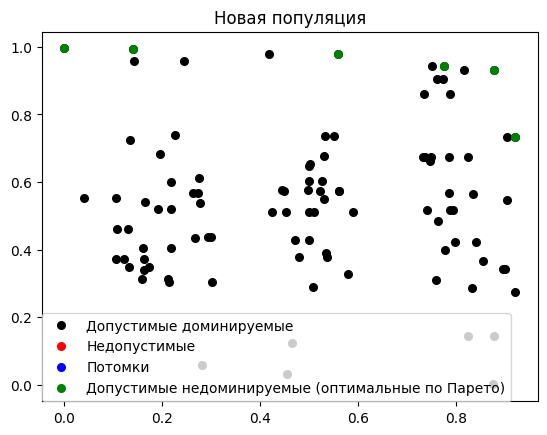

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, 2.1875, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [0.9375, 4.0625, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125, 

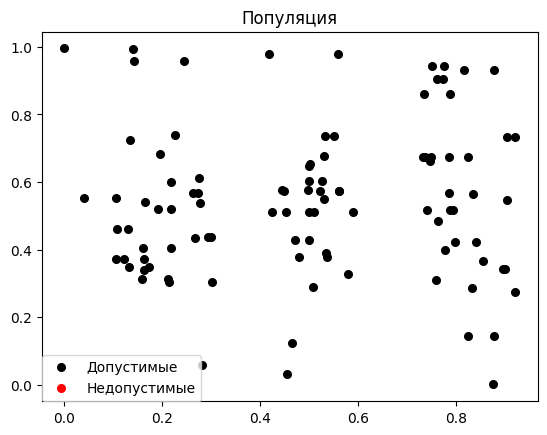

Pareto: 6 optimal values, 6 objects


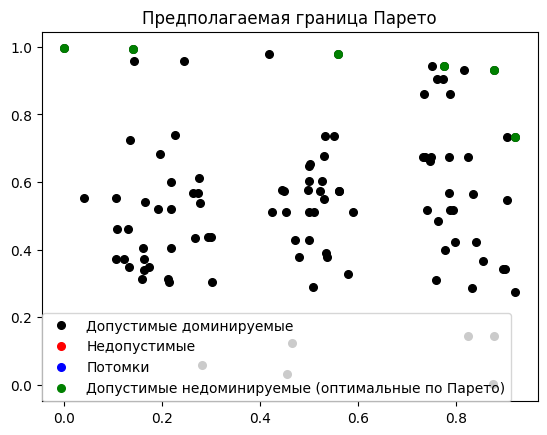

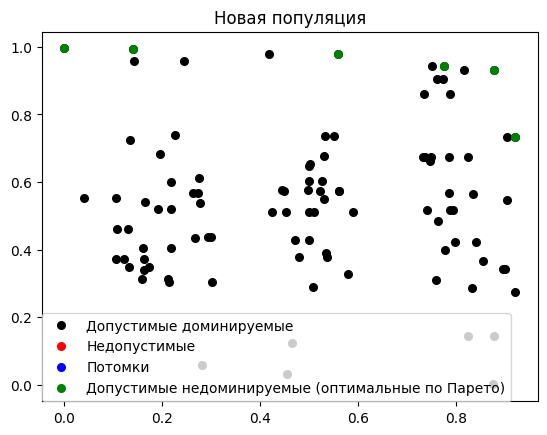

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, 2.1875, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [0.9375, 4.0625, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125, 

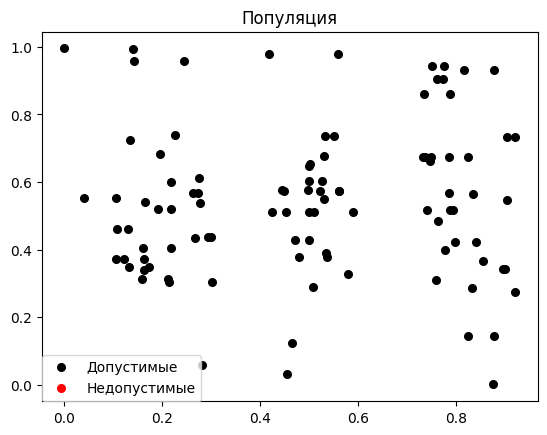

Pareto: 6 optimal values, 6 objects


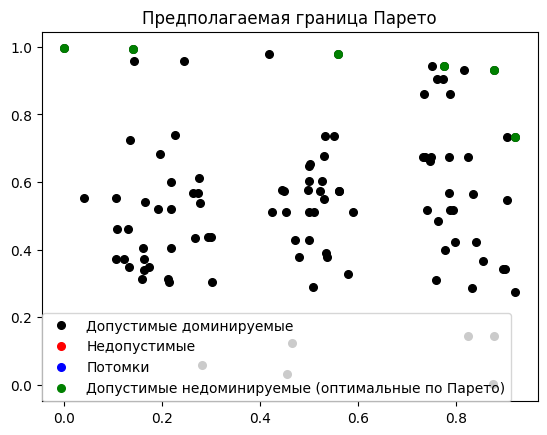

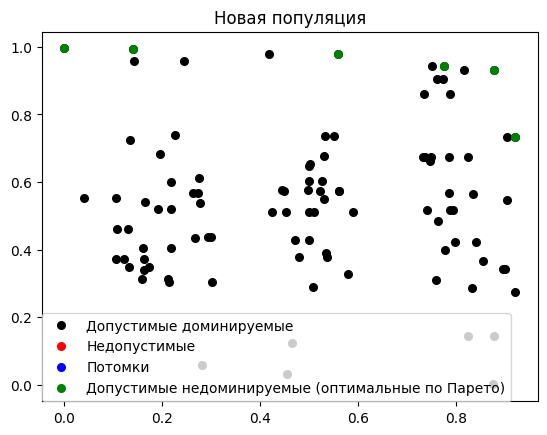

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125], [-0.9375, 0.3125, 0.3125, 0.3125], [0.9375, -2.1875, 0.3125, 3.4375], [-4.0625, -2.8125, 0.9375, 0.3125], [0.3125, -0.9375, -0.9375, 0.3125], [0.9375, 2.1875, -0.9375, 0.3125], [2.1875, -2.8125, -3.4375, 0.3125], [0.9375, 4.0625, -3.4375, 0.3125], [-1.5625, 4.0625, -0.9375, 3.4375], [-4.6875, 2.1875, -0.3125, -2.1875], [0.3125, -0.3125, 0.9375, -3.4375], [0.9375, 0.3125,

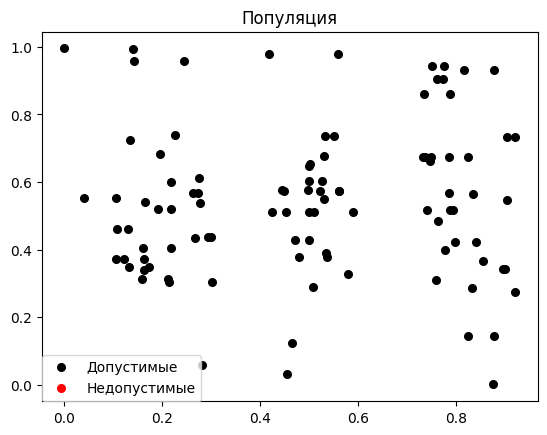

Pareto: 6 optimal values, 6 objects


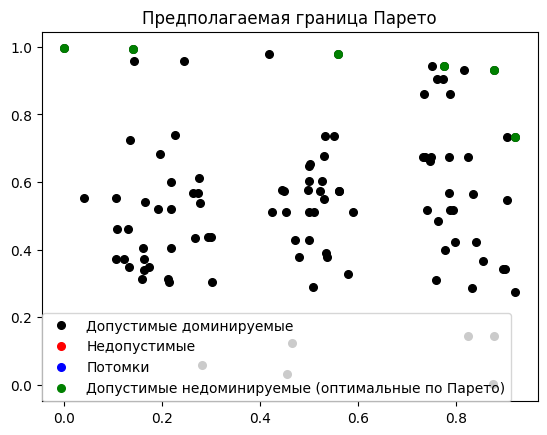

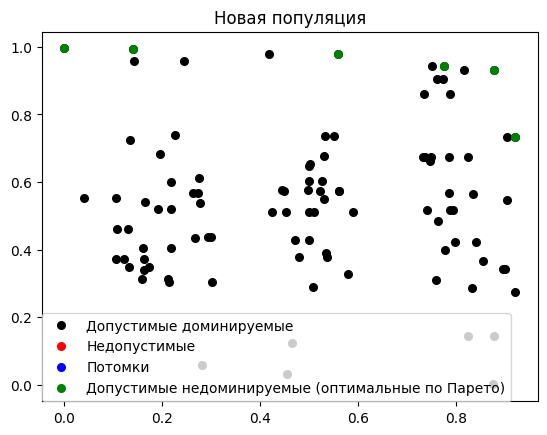

Optimal: [[-0.9375, 0.3125, -4.0625, -0.3125], [-0.3125, 1.5625, -0.3125, -3.4375], [-2.1875, -4.6875, 2.8125, 0.3125], [-3.4375, -4.0625, 0.3125, 0.3125], [-0.3125, 4.0625, -0.9375, -0.3125], [-1.5625, -0.3125, -4.6875, -0.3125]]
A1 =  0.6000000000000001
A2 =  0.3999999999999999
--- 3.329441785812378 seconds ---
_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[-2.1875, -2.8125, -4.0625, -3.4375], [0.9375, 4.6875, -2.1875, 1.5625], [-3.4375, 2.1875, -0.9375, 1.5625], [-2.8125, 0.3125, 2.1875, 0.3125], [-4.0625, 2.8125, 1.5625, -4.0625], [4.6875, -0.3125, -4.0625, 4.6875], [-1.5625, 2.8125, 0.9375, -4.0625], [-0.3125, 0.3125, -2.1875, -3.4375], [-4.0625, 0.3125, -1.5625, 0.3125], [0.9375, 0.3125, -2.1875, -4.0625], [1.5625, 4.6875, 2.8125, -4.0625], [-0.9375, 2.1875, 2.1875, 2.1875], [-2.8125, -0.3125, -2.1875, -1.5625], [4.6875, 0.3125, -2.1875, 0.3125], [-0.937

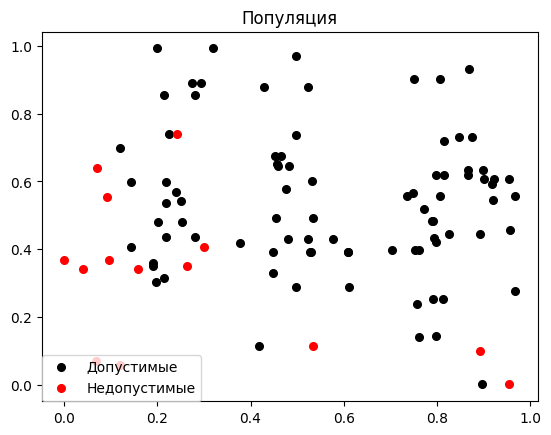

Pareto: 7 optimal values, 7 objects


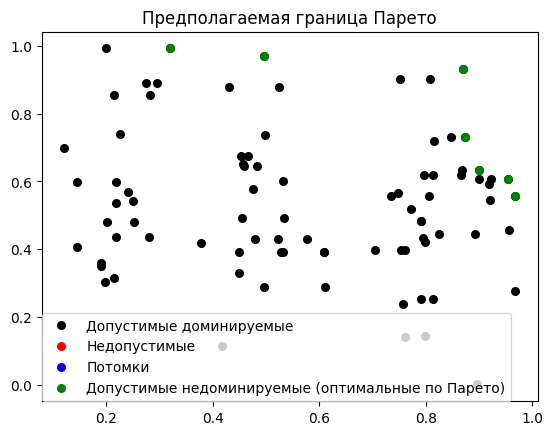

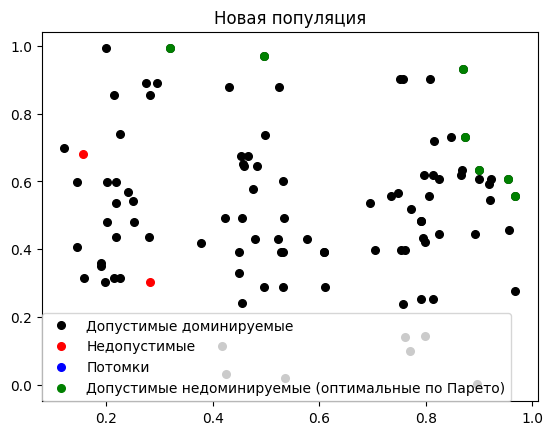

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [-0.3125, 0.3125, -0.3125, -0.9375], [-4.0625, -2.8125, -0.93

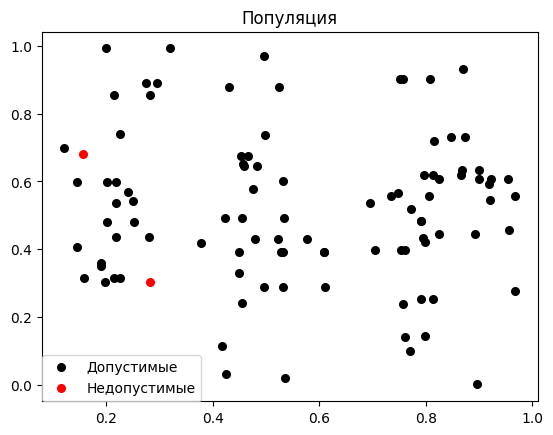

Pareto: 7 optimal values, 7 objects


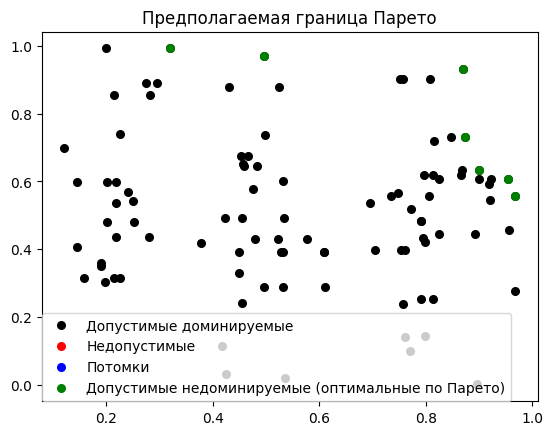

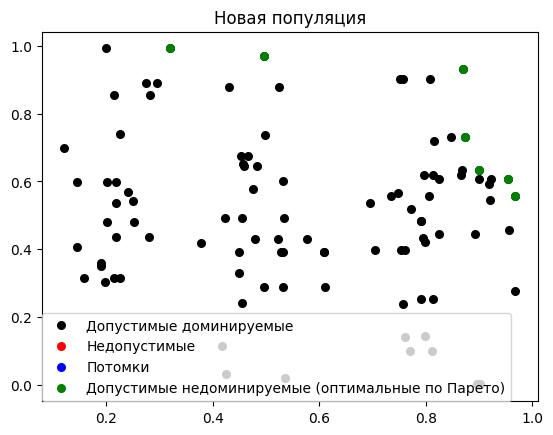

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [0.3125, -2.1875, -0.9375, 0.3125], [-0.3125, 0.3125, -0.3125

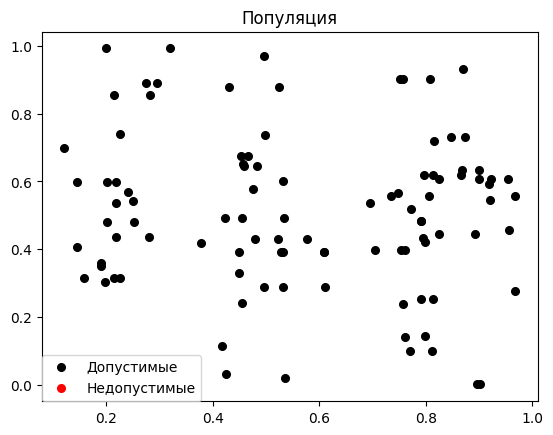

Pareto: 7 optimal values, 7 objects


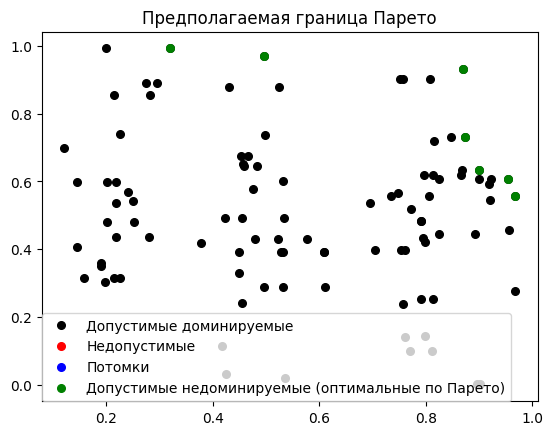

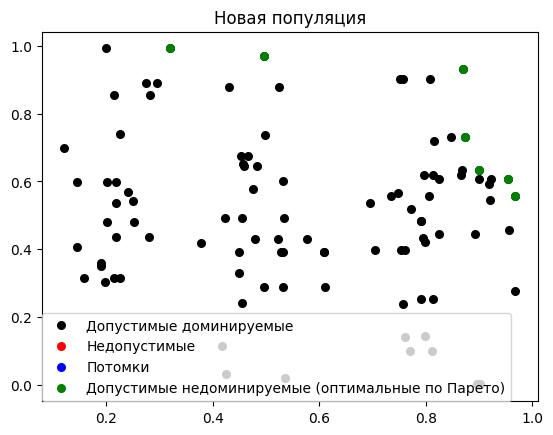

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [0.3125, -2.1875, -0.9375, 0.3125], [-0.3125, 0.3125, -0.3125

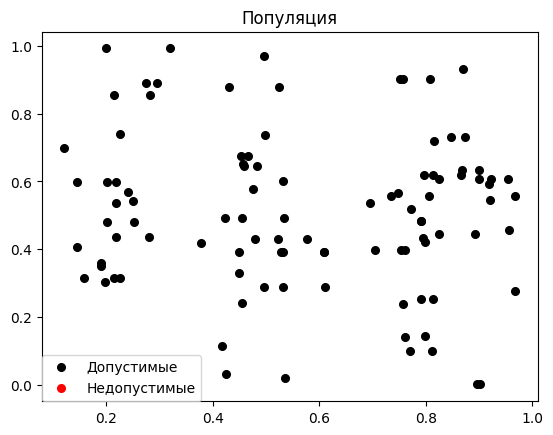

Pareto: 7 optimal values, 7 objects


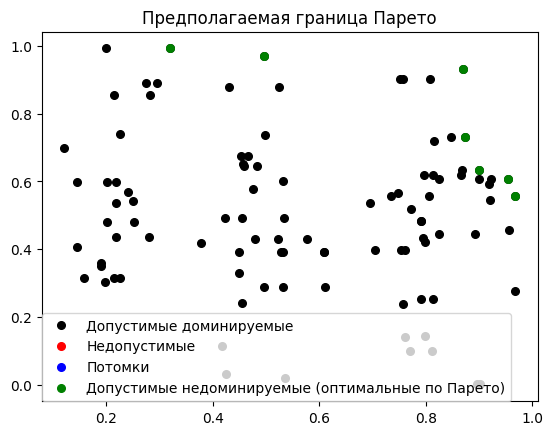

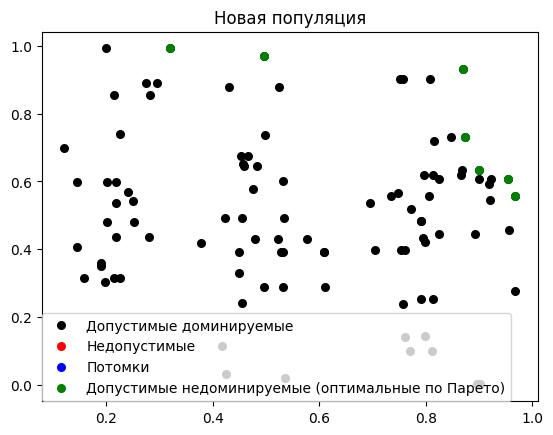

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [0.3125, -2.1875, -0.9375, 0.3125], [-0.3125, 0.3125, -0.3125

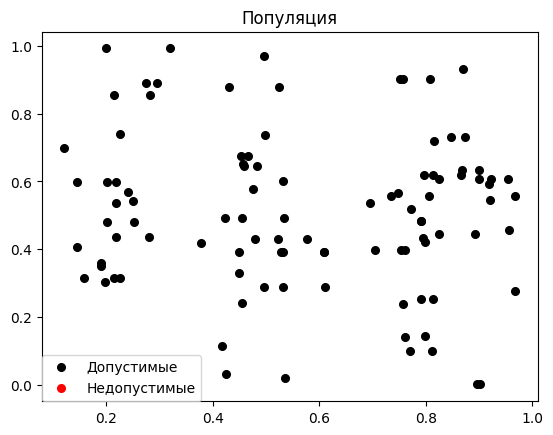

Pareto: 7 optimal values, 7 objects


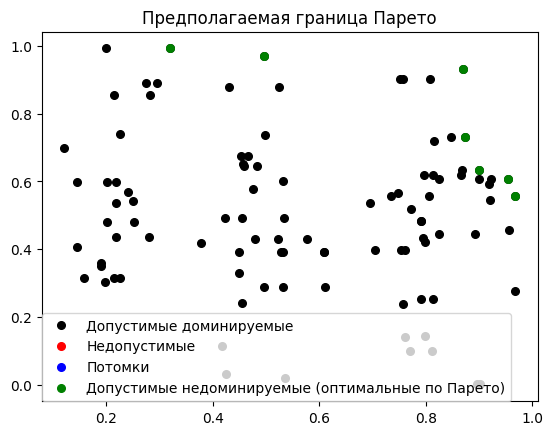

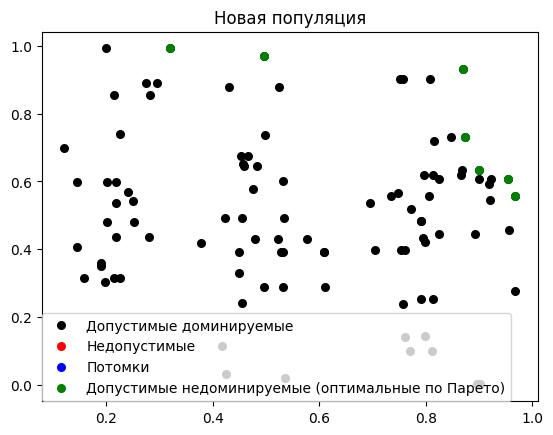

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [0.3125, -2.1875, -0.9375, 0.3125], [-0.3125, 0.3125, -0.3125

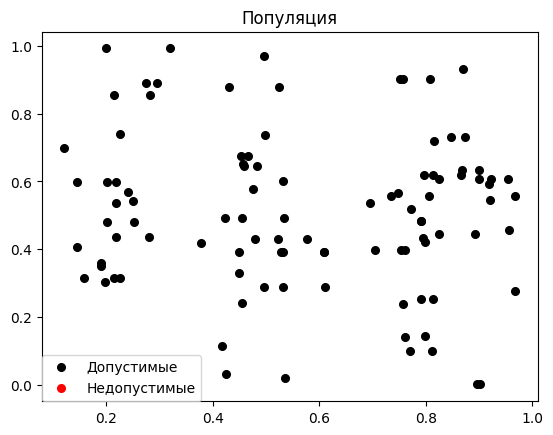

Pareto: 7 optimal values, 7 objects


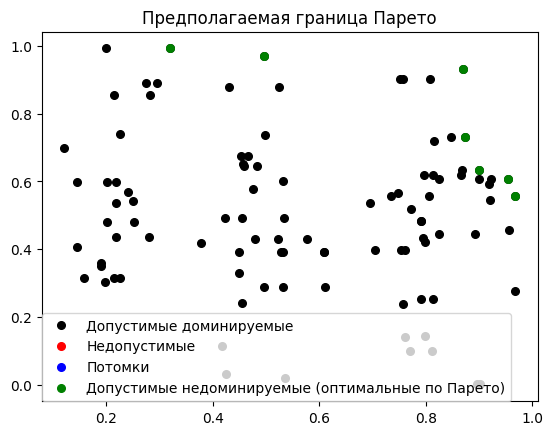

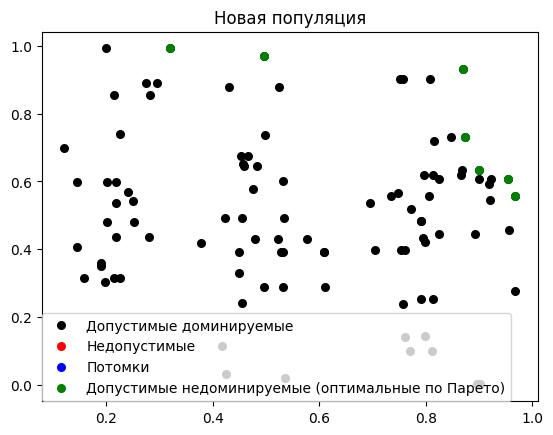

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [0.3125, -2.1875, -0.9375, 0.3125], [-0.3125, 0.3125, -0.3125

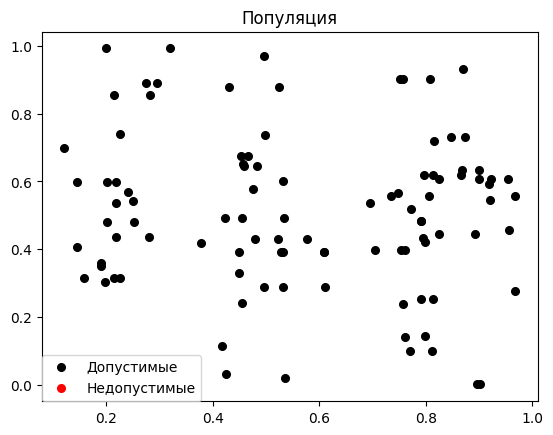

Pareto: 7 optimal values, 7 objects


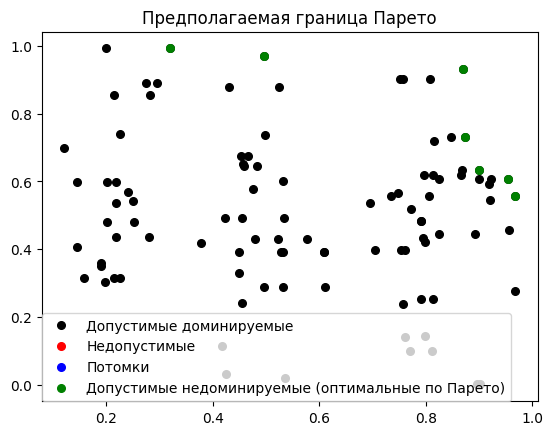

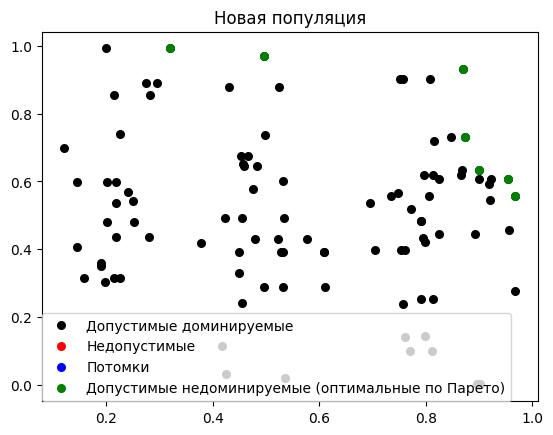

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [0.3125, -2.1875, -0.9375, 0.3125], [-0.3125, 0.3125, -0.3125

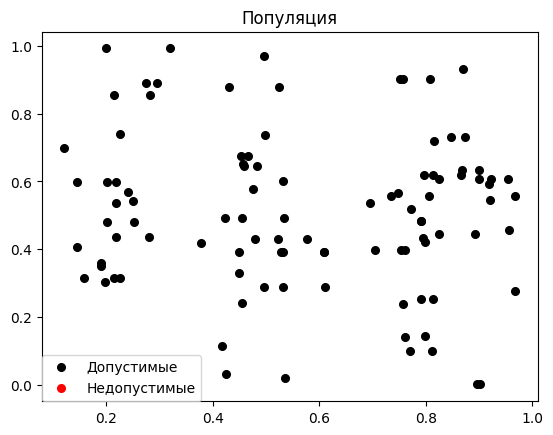

Pareto: 7 optimal values, 7 objects


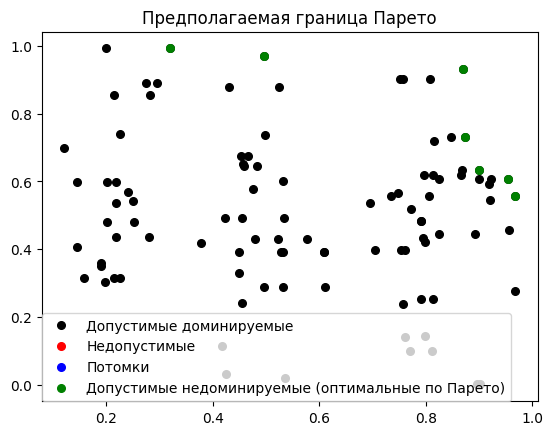

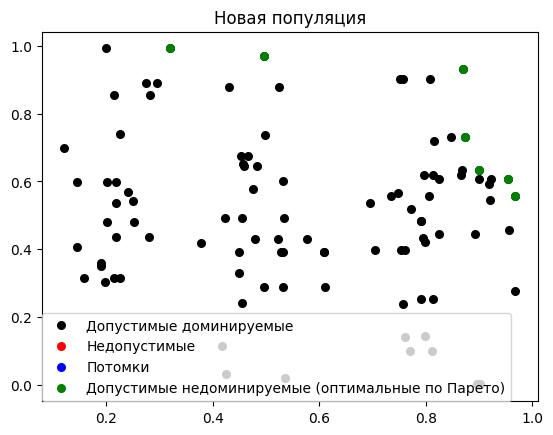

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [0.3125, -2.1875, -0.9375, 0.3125], [-0.3125, 0.3125, -0.3125

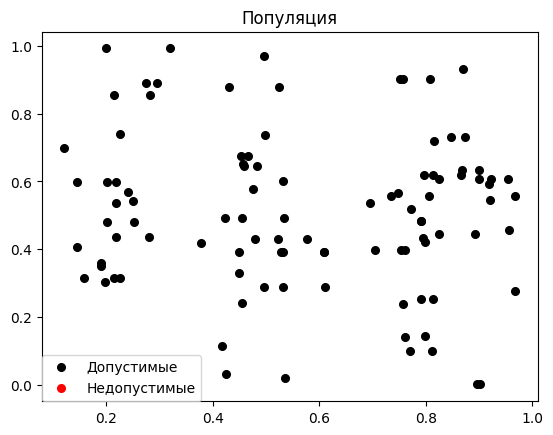

Pareto: 7 optimal values, 7 objects


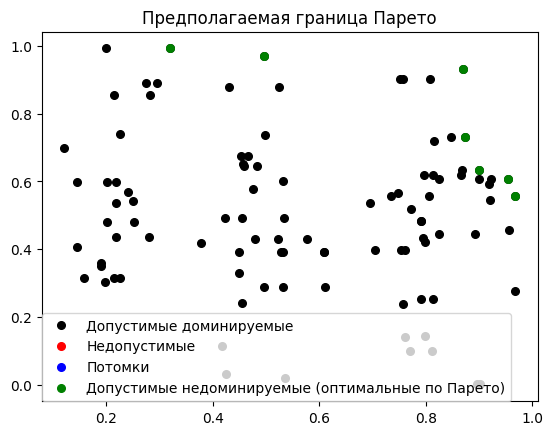

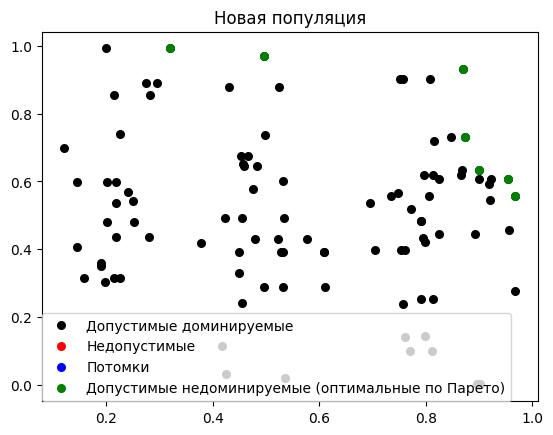

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125], [2.1875, -0.9375, 0.9375, -0.3125], [-2.8125, -1.5625, 0.3125, -3.4375], [2.8125, -0.9375, -0.3125, 0.9375], [4.0625, -0.9375, 0.3125, 3.4375], [-3.4375, 2.1875, 0.3125, -3.4375], [-2.8125, 4.0625, 0.3125, 2.1875], [0.9375, -3.4375, -0.3125, 2.1875], [0.3125, -2.1875, -0.9375, 0.3125], [-0.3125, 0.3125, -0.312

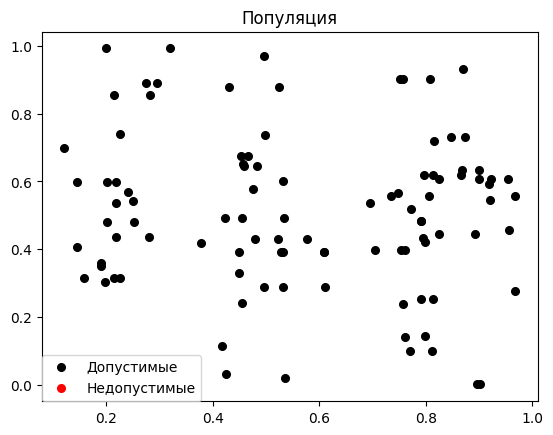

Pareto: 7 optimal values, 7 objects


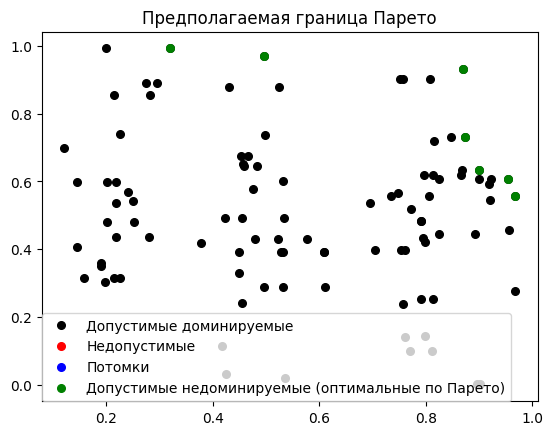

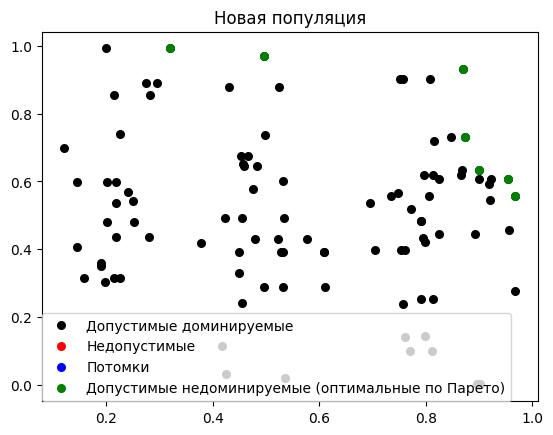

Optimal: [[-2.8125, 0.3125, 2.1875, 0.3125], [-0.9375, -4.0625, 0.3125, -3.4375], [-2.8125, 3.4375, -0.3125, -3.4375], [-4.6875, 0.3125, 4.0625, 0.3125], [3.4375, -0.3125, -0.3125, -0.3125], [-2.8125, 2.8125, 0.3125, 0.9375], [-1.5625, -4.0625, 0.3125, 2.8125]]
A1 =  0.7000000000000001
A2 =  0.29999999999999993
--- 3.5328409671783447 seconds ---
_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[2.8125, -2.8125, -3.4375, -2.8125], [-2.1875, -3.4375, -4.6875, -2.1875], [2.8125, 0.9375, -0.9375, 2.8125], [-1.5625, -4.6875, 3.4375, -1.5625], [-3.4375, 3.4375, 4.0625, -0.9375], [-2.8125, 0.9375, 4.0625, -4.0625], [-4.6875, 0.9375, 4.0625, -4.0625], [-4.0625, -0.3125, 2.8125, 2.8125], [-0.9375, 3.4375, 4.0625, -3.4375], [-0.9375, 2.8125, 2.8125, -1.5625], [-2.8125, 4.0625, 4.6875, -2.8125], [2.8125, -1.5625, -0.9375, -1.5625], [4.0625, -2.8125, 2.8125, -0.9375], [-1.56

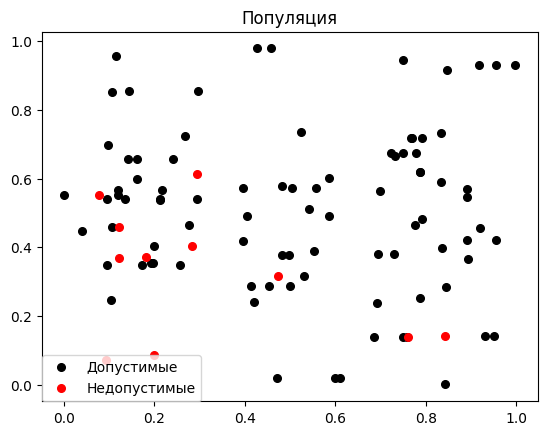

Pareto: 3 optimal values, 3 objects


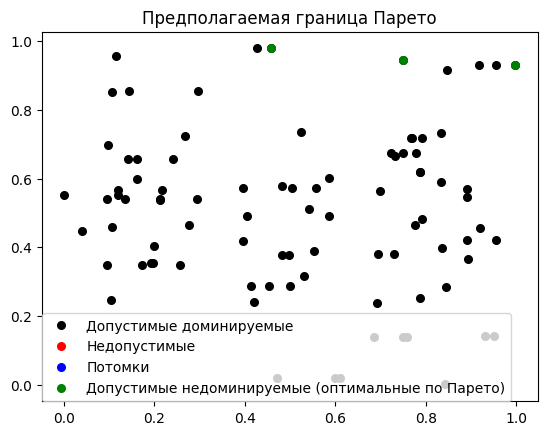

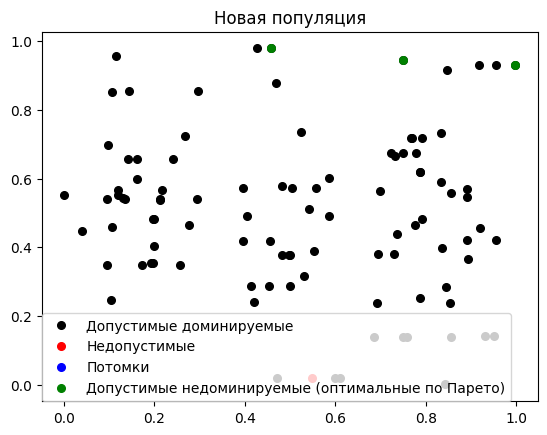

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.4375, 3.4375], [2.8125, 3.4375, -0.9375, 3.4375], [2.8125, 1.5625, 3.4375,

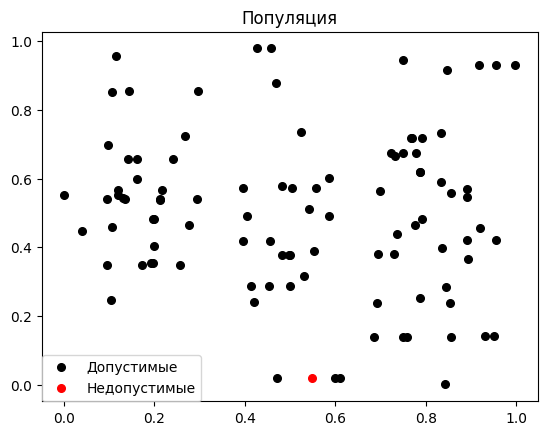

Pareto: 3 optimal values, 3 objects


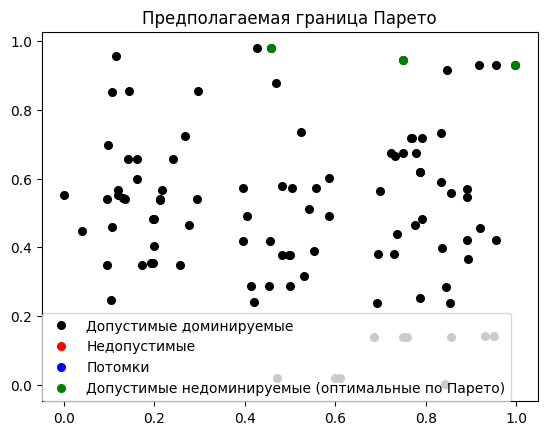

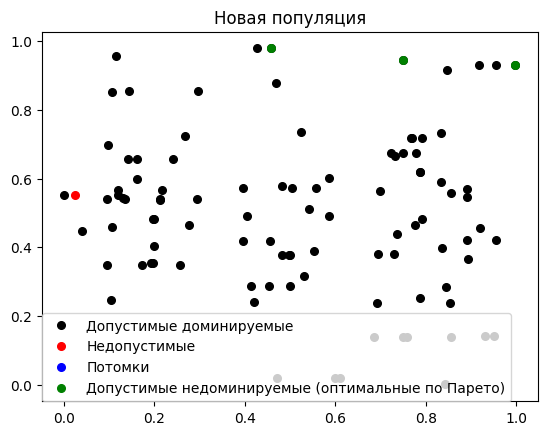

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [4.6875, -4.6875, 0.9375, -0.9375], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.4375, 3.4375], [2.8125, 3.4375, -0.937

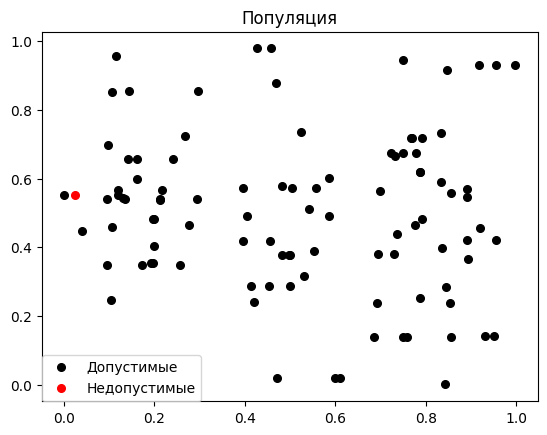

Pareto: 3 optimal values, 3 objects


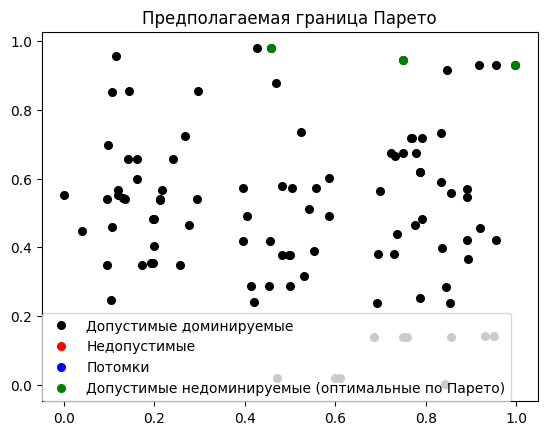

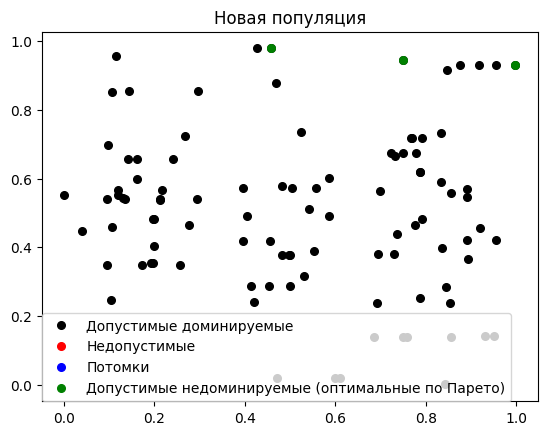

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [4.6875, -4.6875, 0.9375, -0.9375], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.4375, 3.4375], [2.8125, 3.4375, -0.937

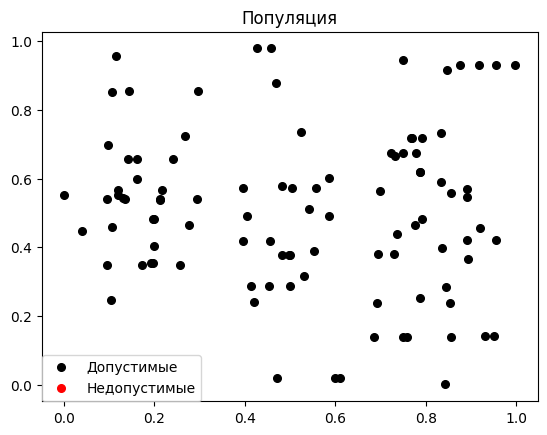

Pareto: 3 optimal values, 3 objects


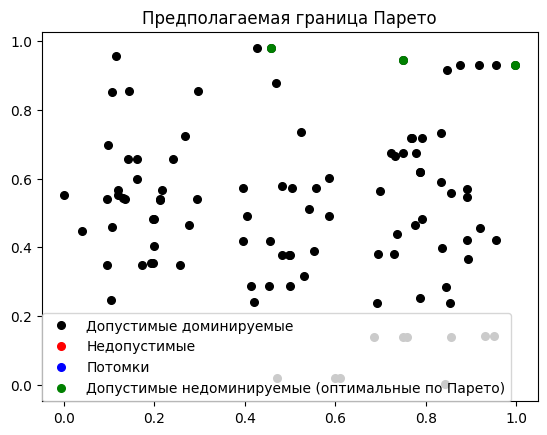

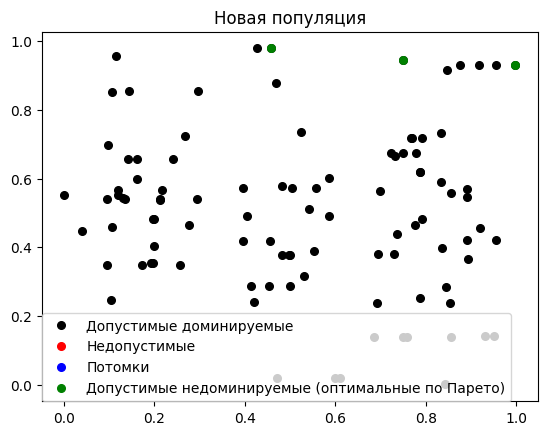

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [2.8125, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [4.6875, -4.6875, 0.9375, -0.9375], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.437

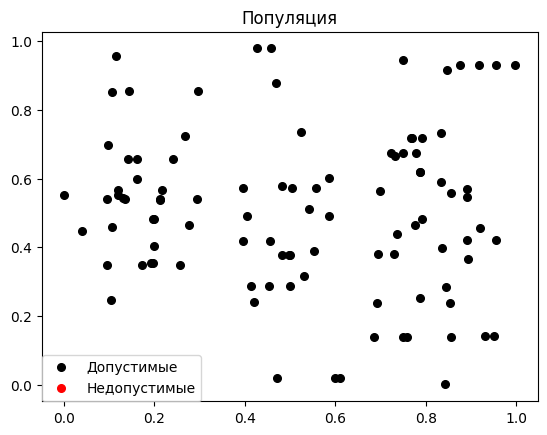

Pareto: 3 optimal values, 3 objects


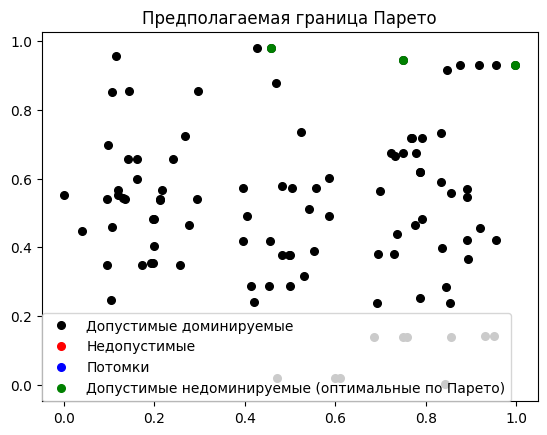

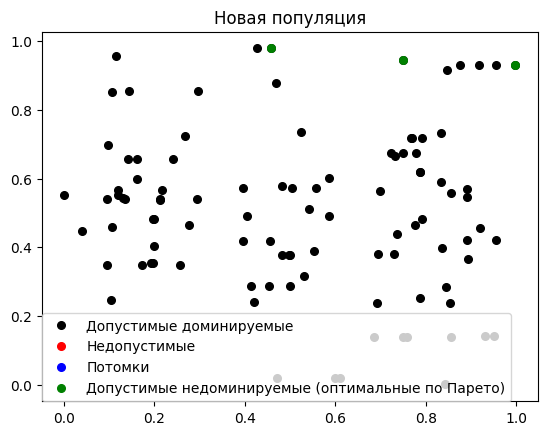

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [2.8125, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [4.6875, -4.6875, 0.9375, -0.9375], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.437

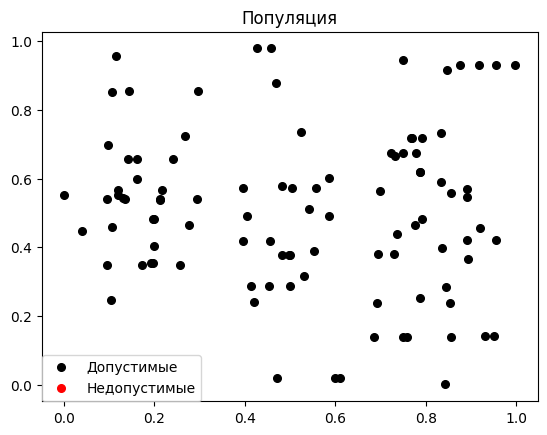

Pareto: 3 optimal values, 3 objects


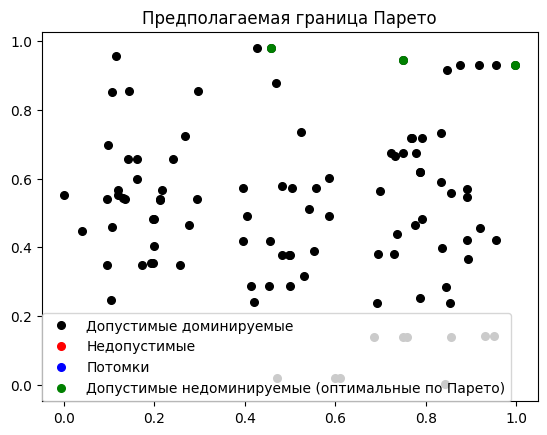

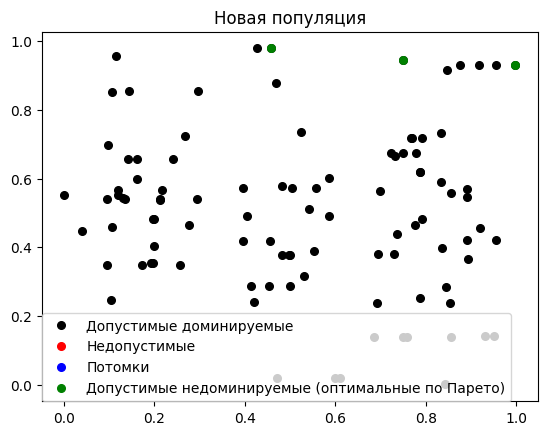

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [2.8125, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [4.6875, -4.6875, 0.9375, -0.9375], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.437

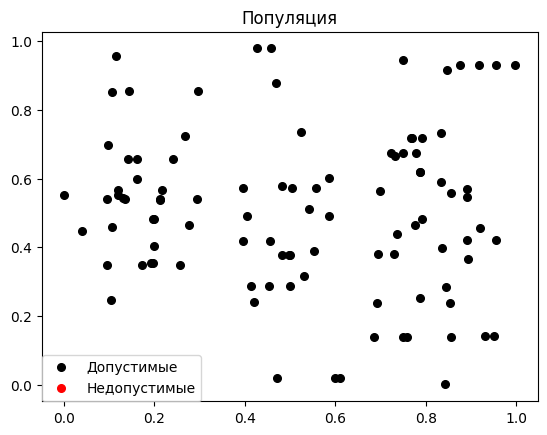

Pareto: 3 optimal values, 3 objects


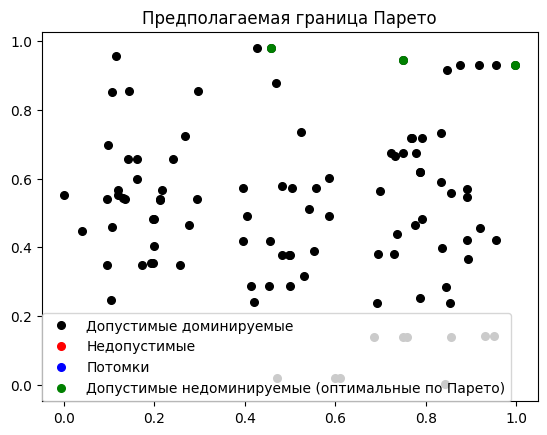

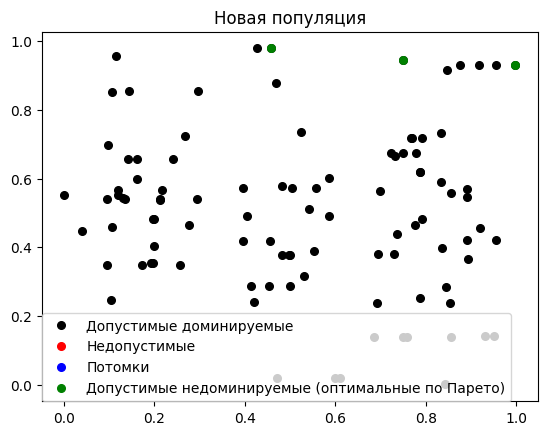

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [2.8125, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [4.6875, -4.6875, 0.9375, -0.9375], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.437

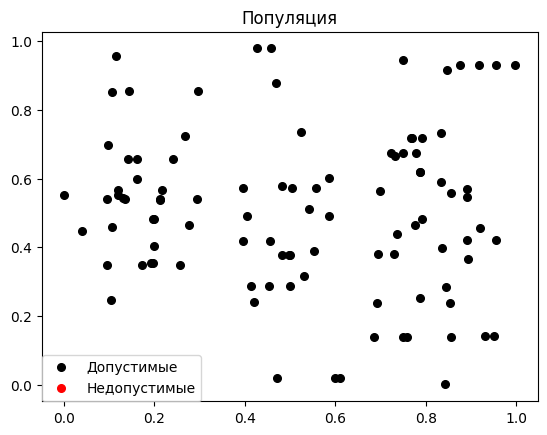

Pareto: 3 optimal values, 3 objects


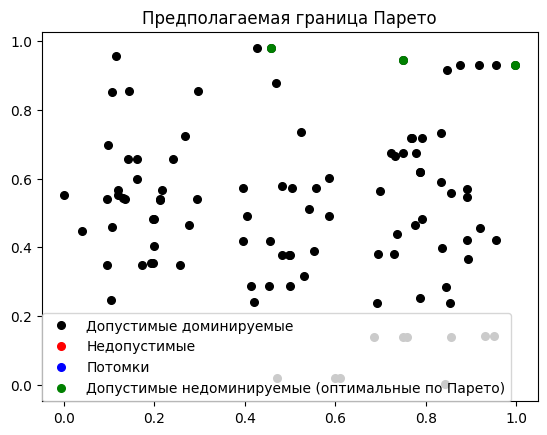

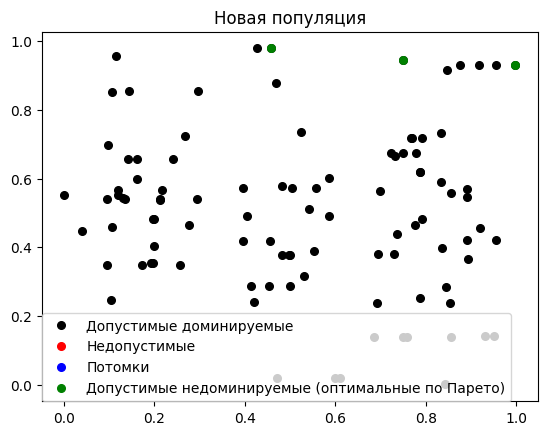

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [2.8125, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [4.6875, -4.6875, 0.9375, -0.9375], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.437

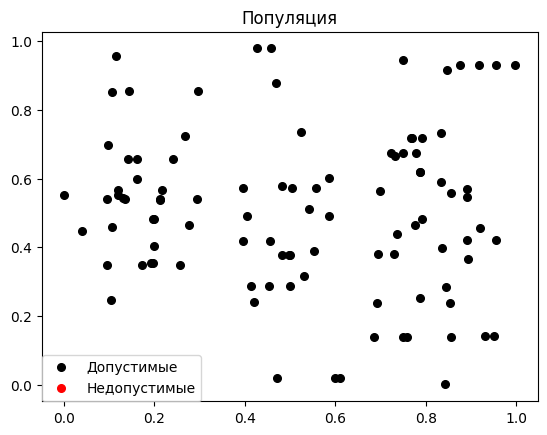

Pareto: 3 optimal values, 3 objects


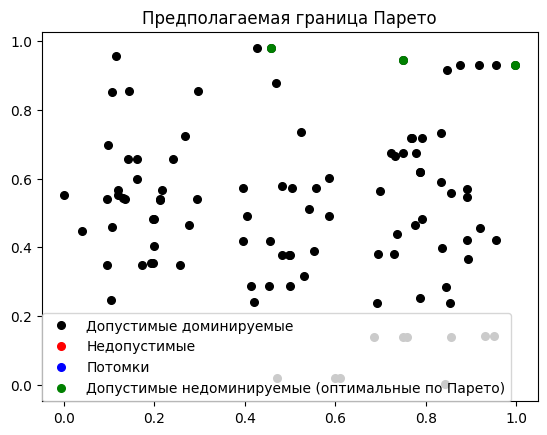

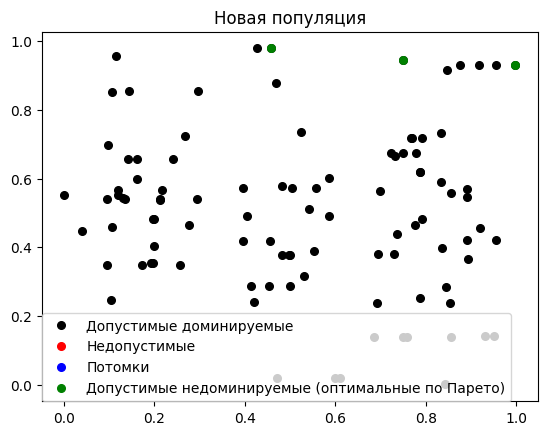

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125], [-4.0625, -3.4375, -0.3125, -0.3125], [3.4375, -4.0625, 0.3125, 0.3125], [2.8125, -4.0625, 0.3125, 0.3125], [-0.9375, 0.9375, -0.3125, 0.3125], [-2.1875, -4.0625, -0.3125, -4.0625], [1.5625, -0.3125, 3.4375, 2.1875], [-3.4375, -3.4375, -0.3125, 2.1875], [1.5625, 2.8125, 0.3125, 2.1875], [4.6875, 0.9375, 0.3125, 3.4375], [-4.6875, -2.8125, 0.3125, 4.0625], [4.6875, -4.6875, 0.9375, -0.9375], [2.1875, 0.9375, -0.3125, -4.6875], [-1.5625, -4.6875, 3.4375, -1.5625], [4.6875, 0.9375, -0.3125, 0.9375], [-3.4375, 2.8125, -3.4375, 3.4375], [2.8125, -0.3125, 0.3125, 4.6875], [-0.3125, -3.4375, -3.43

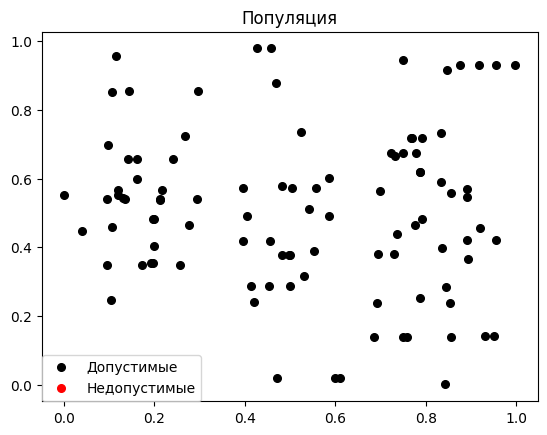

Pareto: 3 optimal values, 3 objects


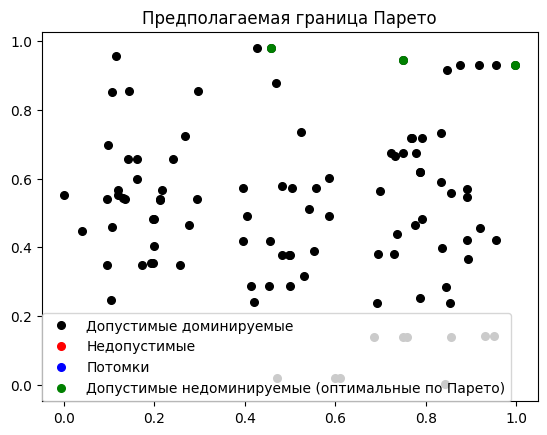

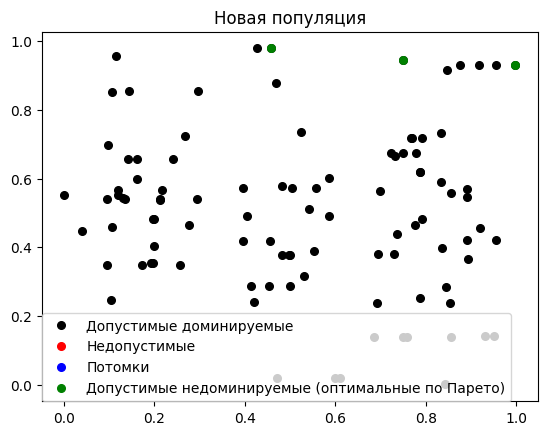

Optimal: [[-2.1875, 2.1875, -0.9375, -0.3125], [-0.3125, -0.9375, -2.8125, -0.3125], [4.6875, 4.6875, 0.3125, 0.3125]]
A1 =  0.8
A2 =  0.19999999999999996
--- 3.0171852111816406 seconds ---
_________________________________________________________________________Generation  1  _________________________________________________________________________
Population [[2.1875, 1.5625, 3.4375, -1.5625], [2.1875, 4.0625, 2.8125, -4.0625], [-2.1875, -0.9375, 2.8125, 4.6875], [-2.8125, -4.0625, -0.3125, 2.8125], [-2.1875, 4.6875, 3.4375, 3.4375], [2.1875, -4.6875, -2.8125, 2.8125], [4.0625, 0.9375, 2.1875, 0.3125], [0.3125, -0.3125, -4.6875, -0.3125], [-1.5625, -3.4375, 0.3125, -4.6875], [-0.9375, 4.0625, 4.0625, 4.6875], [-2.8125, -2.8125, -3.4375, 3.4375], [-1.5625, -2.8125, 2.1875, -3.4375], [-1.5625, 2.1875, 0.9375, -1.5625], [-4.0625, -0.9375, 0.9375, 0.3125], [-1.5625, -0.3125, 4.6875, 0.3125], [0.3125, -2.1875, -0.9375, -2.8125], [1.5625, 1.5625, 4.0625, -0.9375], [-0.3125, 0.9375, 2.1875,

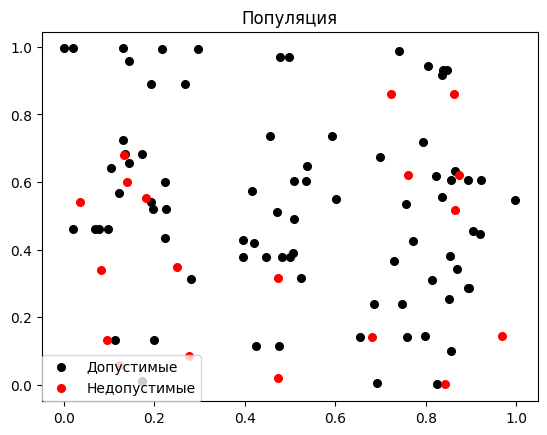

Pareto: 9 optimal values, 9 objects


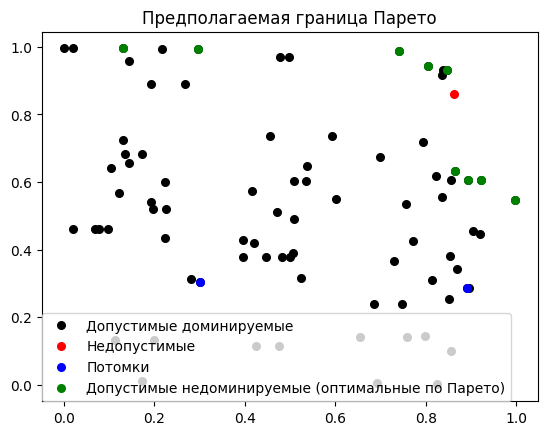

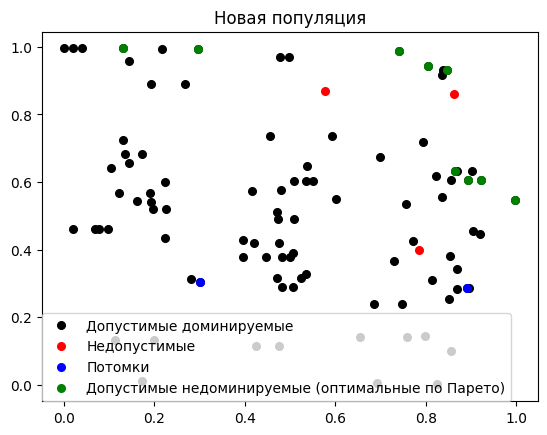

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [2.8125, -4.6875, -0.3125, -0.9375], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [-1.5625, -4.6875, 3.4375, 0.9375]]
_________________________________________________________________________Generation  2  _________________________________________________________________________
Population [[0.9375, 0.3125, 4.0625, -1.5625], [-1.5625, 2.1875, 0.3125, -4.0625], [0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [2.8125, -4.6875, -0.3125, -0.9375], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [-1.5625, -4.6875, 3.4375, 0.9375], [-2.8125, -4.0625, -0.3125, 2.8125], [2.1875, -2.1875, -0.3125, 2.1875], [-2.1875, 3.4375

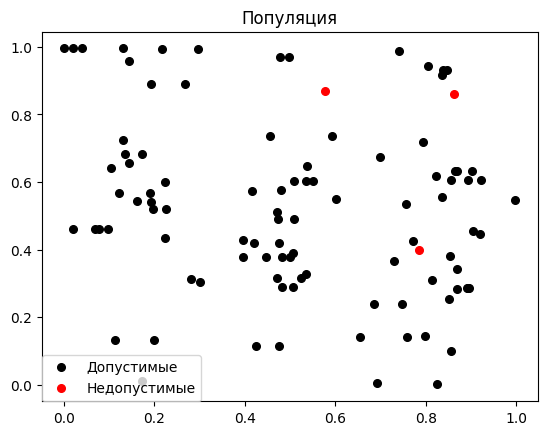

Pareto: 8 optimal values, 8 objects


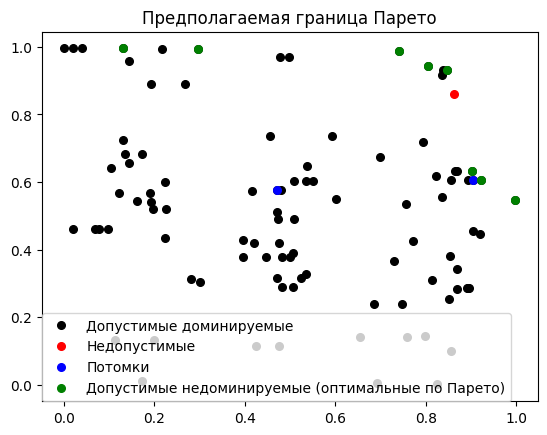

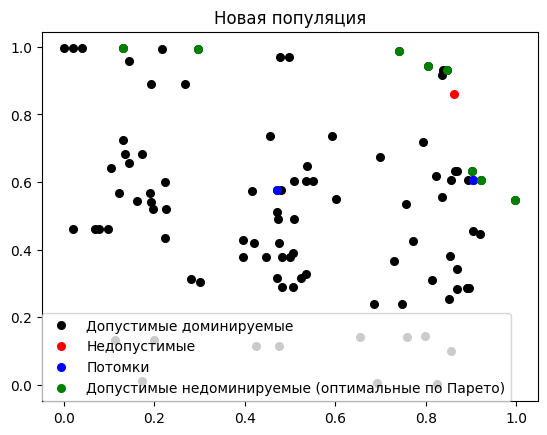

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
_________________________________________________________________________Generation  3  _________________________________________________________________________
Population [[0.9375, 2.1875, 0.3125, -3.4375], [-1.5625, 2.1875, 2.8125, -0.9375], [0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375], [-2.8125, -4.0625, -0.3125, 2.8125], [-1.5625, -4.6875, 3.4375, 0.9375], [2.1875, -2.1875, -0.3125, 2.1875], [-2.1875, 3.4375, 0.3125, 0.3125], [-3.4375, -4.6875, -0.3

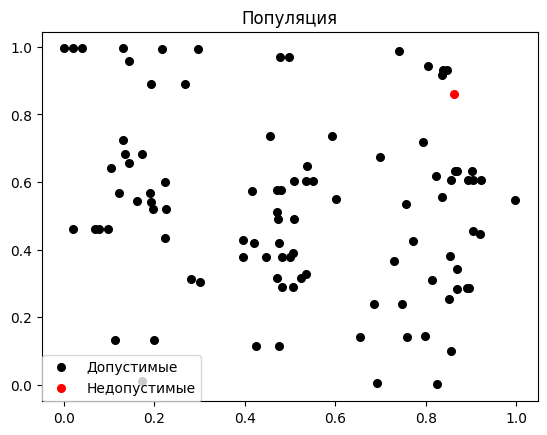

Pareto: 8 optimal values, 8 objects


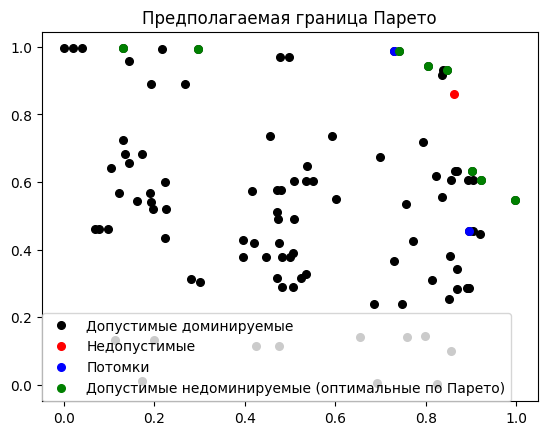

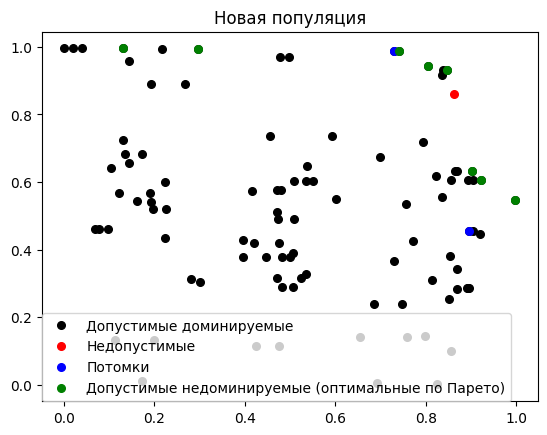

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
_________________________________________________________________________Generation  4  _________________________________________________________________________
Population [[2.8125, -2.8125, 0.3125, -2.1875], [-1.5625, 0.9375, -3.4375, -0.3125], [0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375], [0.9375, 2.1875, 0.3125, -3.4375], [-2.8125, -4.0625, -0.3125, 2.8125], [-1.5625, -4.6875, 3.4375, 0.9375], [2.1875, -2.1875, -0.3125, 2.1875], [-2.1875, 3.4375, 0.3

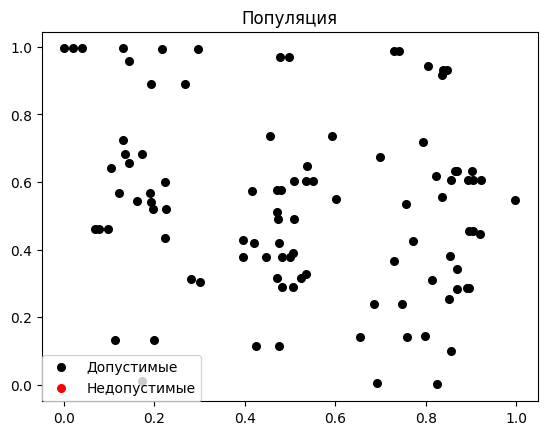

Pareto: 8 optimal values, 8 objects


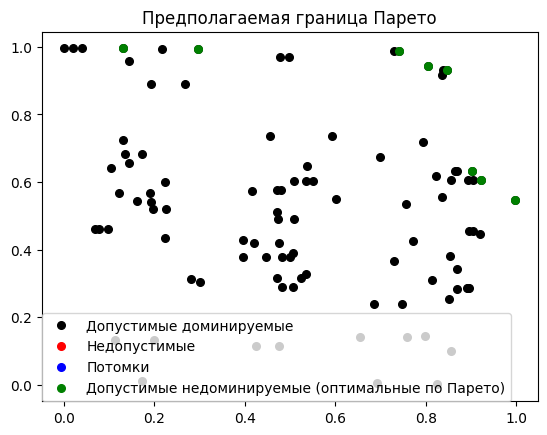

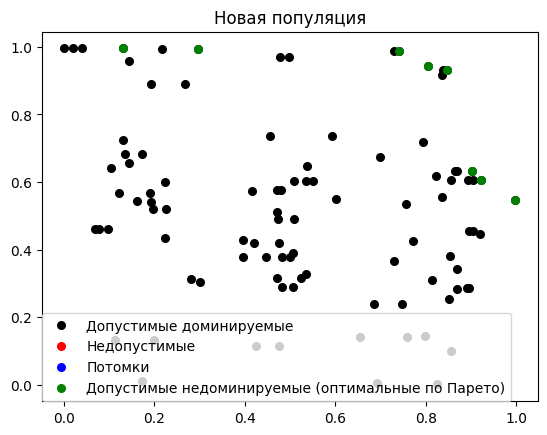

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
_________________________________________________________________________Generation  5  _________________________________________________________________________
Population [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375], [0.9375, 2.1875, 0.3125, -3.4375], [-2.8125, -4.0625, -0.3125, 2.8125], [-1.5625, -4.6875, 3.4375, 0.9375], [2.1875, -2.1875, -0.3125, 2.1875], [2.8125, -2.8125, 0.3125, -2.1875], [-2.1875, 3.4375, 0.3125, 0.3125], [-3.4375, -4.6875, -0.3

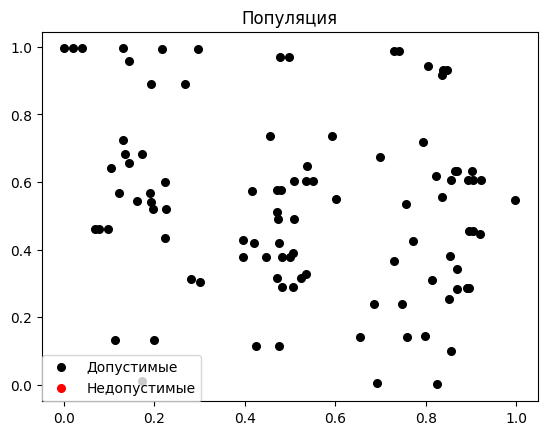

Pareto: 8 optimal values, 8 objects


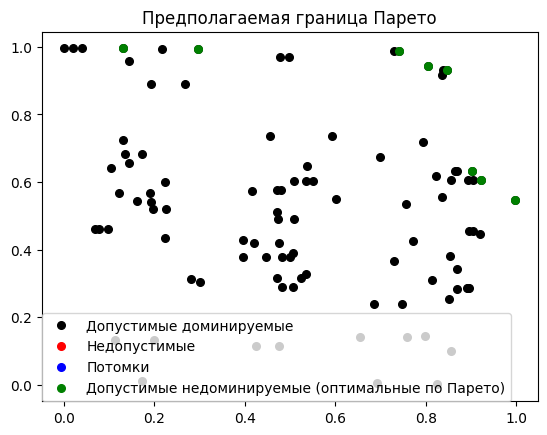

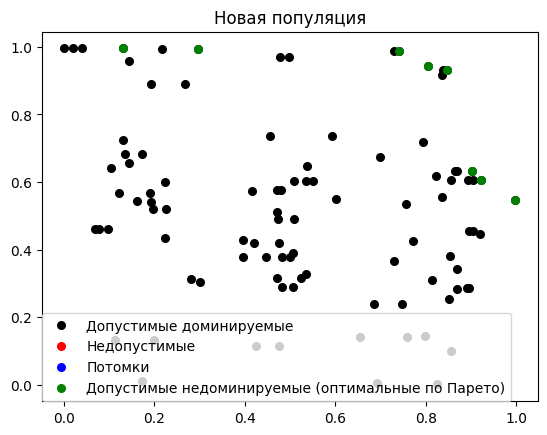

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
_________________________________________________________________________Generation  6  _________________________________________________________________________
Population [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375], [0.9375, 2.1875, 0.3125, -3.4375], [-2.8125, -4.0625, -0.3125, 2.8125], [-1.5625, -4.6875, 3.4375, 0.9375], [2.1875, -2.1875, -0.3125, 2.1875], [2.8125, -2.8125, 0.3125, -2.1875], [-2.1875, 3.4375, 0.3125, 0.3125], [-3.4375, -4.6875, -0.3

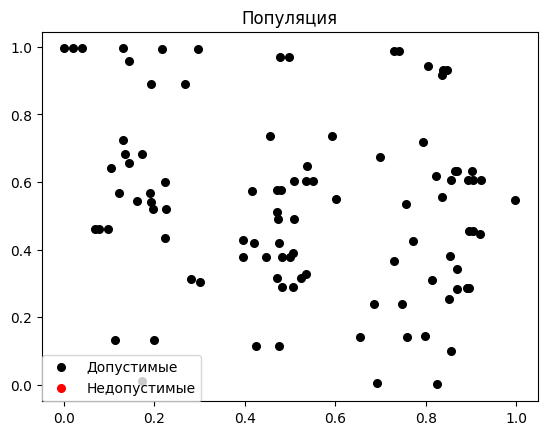

Pareto: 8 optimal values, 8 objects


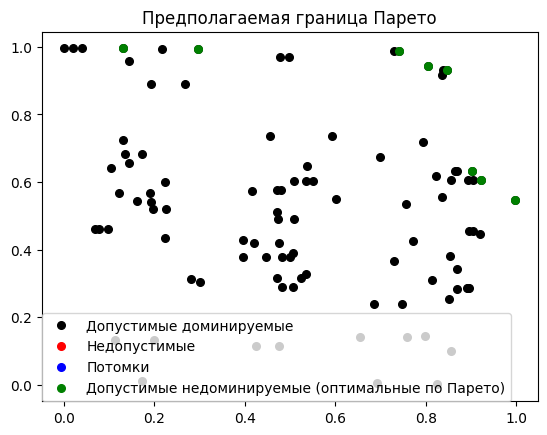

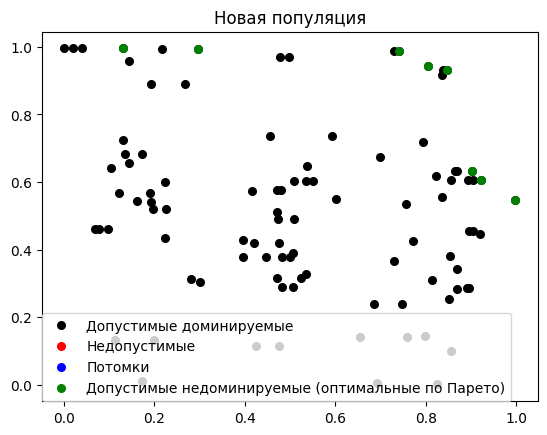

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
_________________________________________________________________________Generation  7  _________________________________________________________________________
Population [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375], [0.9375, 2.1875, 0.3125, -3.4375], [-2.8125, -4.0625, -0.3125, 2.8125], [-1.5625, -4.6875, 3.4375, 0.9375], [2.1875, -2.1875, -0.3125, 2.1875], [2.8125, -2.8125, 0.3125, -2.1875], [-2.1875, 3.4375, 0.3125, 0.3125], [-3.4375, -4.6875, -0.3

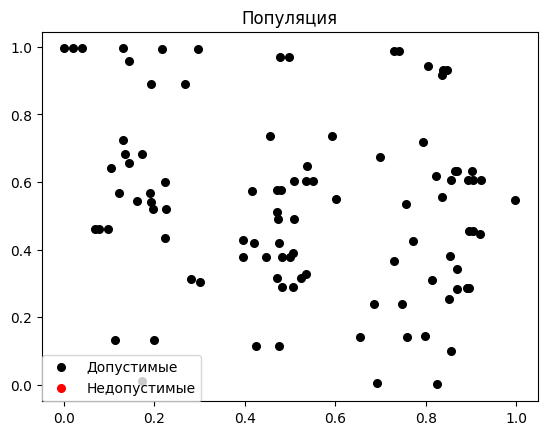

Pareto: 8 optimal values, 8 objects


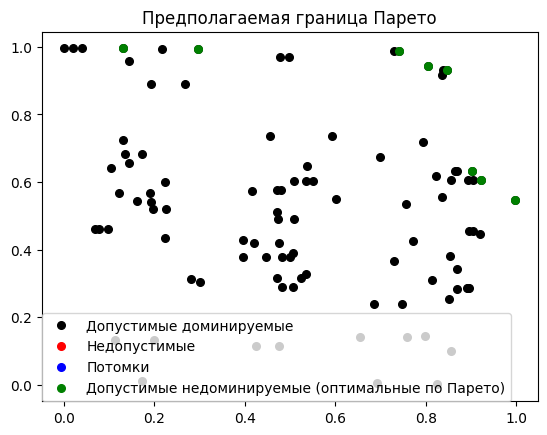

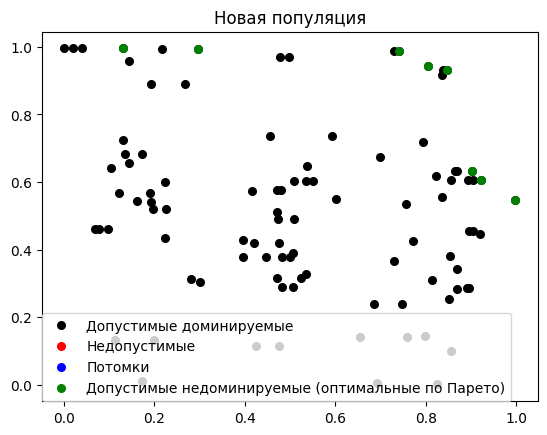

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
_________________________________________________________________________Generation  8  _________________________________________________________________________
Population [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375], [0.9375, 2.1875, 0.3125, -3.4375], [-2.8125, -4.0625, -0.3125, 2.8125], [-1.5625, -4.6875, 3.4375, 0.9375], [2.1875, -2.1875, -0.3125, 2.1875], [2.8125, -2.8125, 0.3125, -2.1875], [-2.1875, 3.4375, 0.3125, 0.3125], [-3.4375, -4.6875, -0.3

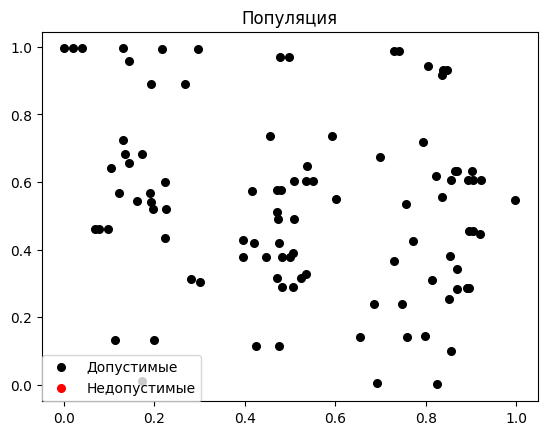

Pareto: 8 optimal values, 8 objects


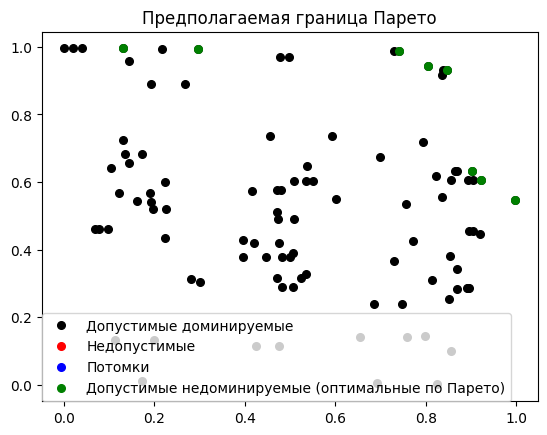

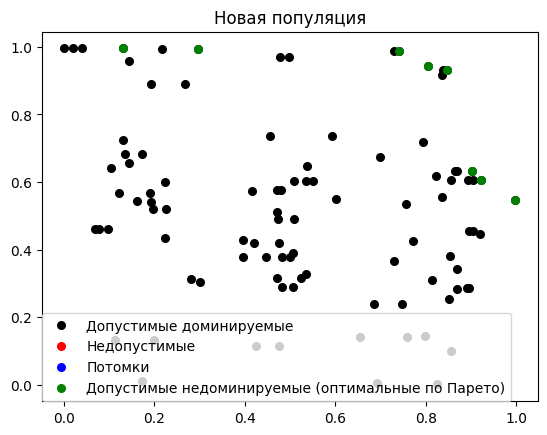

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
_________________________________________________________________________Generation  9  _________________________________________________________________________
Population [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375], [0.9375, 2.1875, 0.3125, -3.4375], [-2.8125, -4.0625, -0.3125, 2.8125], [-1.5625, -4.6875, 3.4375, 0.9375], [2.1875, -2.1875, -0.3125, 2.1875], [2.8125, -2.8125, 0.3125, -2.1875], [-2.1875, 3.4375, 0.3125, 0.3125], [-3.4375, -4.6875, -0.3

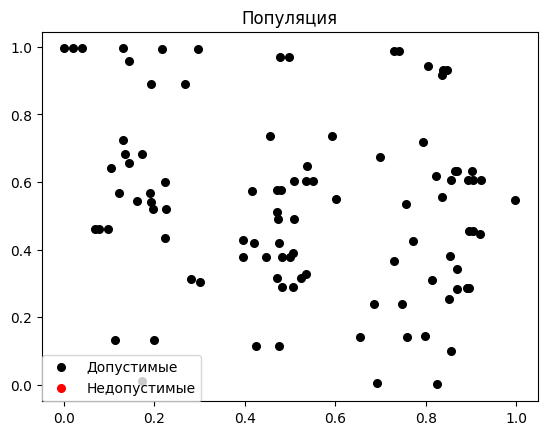

Pareto: 8 optimal values, 8 objects


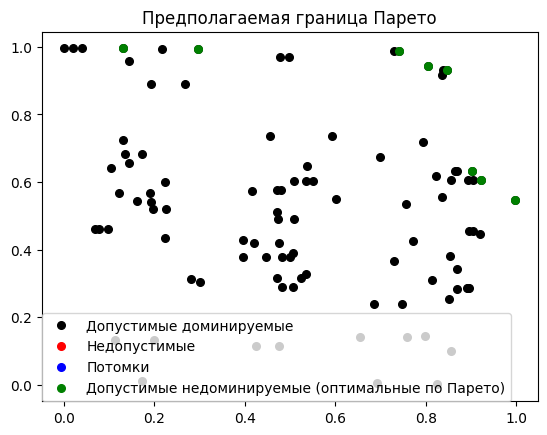

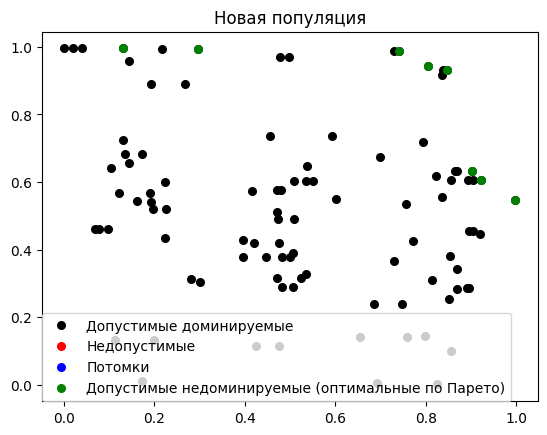

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
_________________________________________________________________________Generation  10  _________________________________________________________________________
Population [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375], [0.9375, 2.1875, 0.3125, -3.4375], [-2.8125, -4.0625, -0.3125, 2.8125], [-1.5625, -4.6875, 3.4375, 0.9375], [2.1875, -2.1875, -0.3125, 2.1875], [2.8125, -2.8125, 0.3125, -2.1875], [-2.1875, 3.4375, 0.3125, 0.3125], [-3.4375, -4.6875, -0.

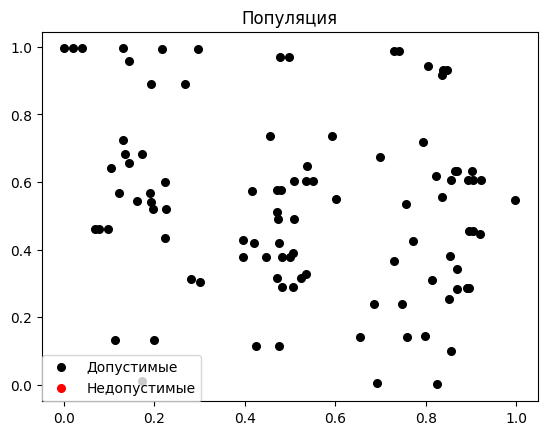

Pareto: 8 optimal values, 8 objects


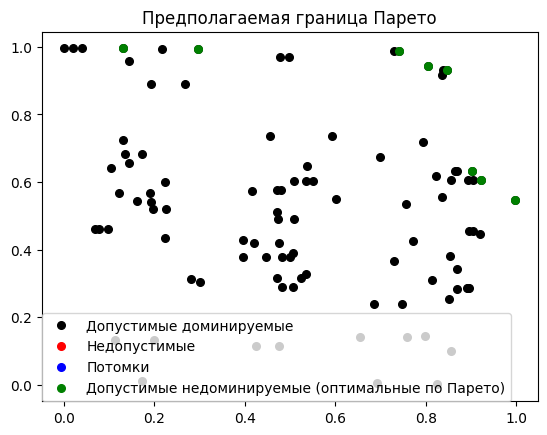

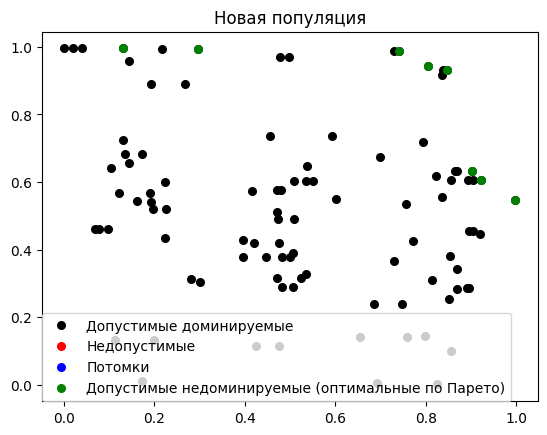

Optimal: [[0.3125, -0.3125, -4.6875, -0.3125], [-4.0625, -0.9375, 0.9375, 0.3125], [-2.1875, -0.9375, 3.4375, 0.3125], [-1.5625, -1.5625, 4.0625, 0.3125], [4.6875, -4.6875, -0.3125, -2.1875], [-0.9375, 0.9375, -0.3125, -0.3125], [2.8125, -3.4375, 0.3125, -3.4375], [4.0625, 2.8125, 0.3125, 0.9375]]
A1 =  0.9
A2 =  0.09999999999999998
--- 3.184476852416992 seconds ---
Среднее время: %s seconds --- 3.1653375890519886


In [20]:
import time
sum_time = 0
opt_pareto = []
for _ in range(9):
    start_time = time.time()
    opt_pareto.append(pareto_optimization(bound_left,bound_right,number_species,number_generations,mutation_rate,power_of_two,occupancy_ratio,0.1*(_+1)))
    print("A1 = ",0.1*(_+1))
    print("A2 = ",1.0-0.1*(_+1))
    print("--- %s seconds ---" % (time.time() - start_time))
    sum_time += (time.time() - start_time)
print("Среднее время: %s seconds ---", sum_time/9)

In [22]:
def f(individual):
    x1, x2, x3, x4 = individual
    f1 = -np.sin(x1)*np.cos(x2**2) - 4*np.cos(x3**2)
    f2 = np.sin(x3*x4) + 6*(np.cos(x4**2))**3
    return f1, f2

[-4.207045198313785, -2.9104802893101276, -4.77695652386463, -3.998202826080916, 2.594433009638815, 3.7090975960183945] [3.22979177533828, 6.793863691760206, -0.7711034404842978, 6.012146579102201, 6.869607344533322, 6.909037750217361]


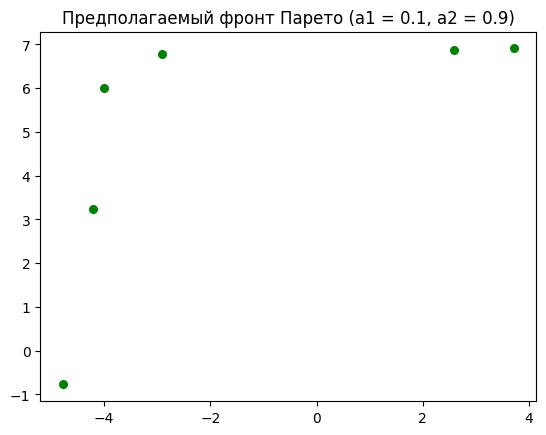

[-3.9248139793530163, -2.609857653672982, -2.3698564178157153, -3.923059047709522, 2.160649014354626, -4.577865442617006, -3.757942678783731, -4.03954623719696, -3.7387550533540432] [0.7689796274371989, 6.2034412228490705, 6.793863691760206, 1.2693229554784677, 6.869607344533322, -0.6292776240819427, 3.22979177533828, 0.6338890949633602, 5.035427259306273]


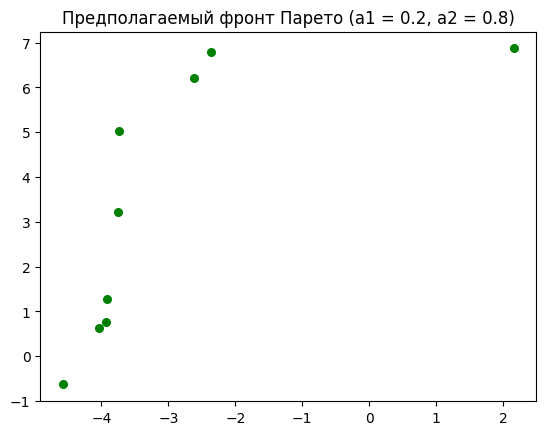

[-4.577865442617006, 3.105831126195504, 3.7628377307420138, -4.5973696965210555, -4.5448851144976805, -3.2499818856765343] [-0.7711034404842978, 6.869607344533322, 6.909037750217361, -3.1523649745469275, 5.817144371964278, 6.793863691760206]


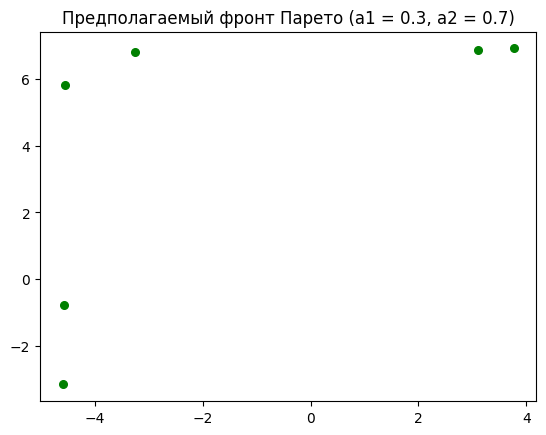

[-4.773299320694109, -1.2860134407577597, 2.277976686722698, 3.382888057890585, -4.745637439214968, 0.28246292619236074, -4.5448851144976805] [-3.0095353874523036, 6.546228835055891, 6.869607344533322, 6.909037750217361, 5.817144371964278, 6.684687009493988, 6.012146579102201]


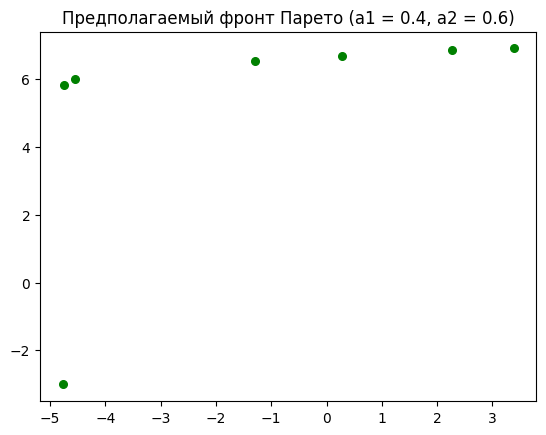

[-4.304070916602559, -4.980461027197871, -3.92664724956352, -4.783182134833142, 3.677671419793613] [3.22979177533828, -2.214147606189105, 6.793863691760206, 1.471355342884347, 6.909037750217361]


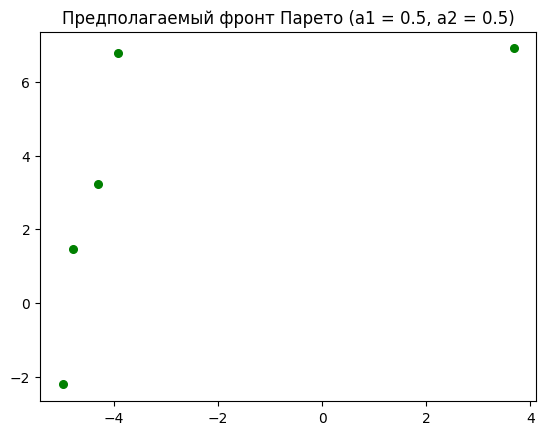

[3.600685644624396, -4.2160466903641804, -0.591069524290066, -3.776929499847561, -2.767062491362901, 4.994517253735504] [6.869607344533322, 3.22979177533828, 6.684687009493988, 6.012146579102201, 6.2034412228490705, 6.909037750217361]


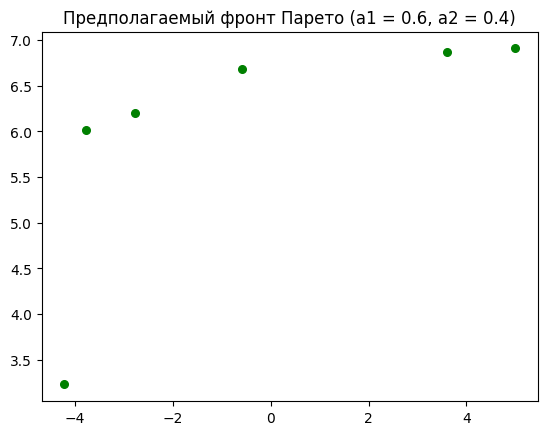

[0.030832393184130946, -4.5448851144976805, -3.7444633105284706, 1.8035179991379304, -3.6907231758048513, -3.999086886033027, -4.6805288846734445] [6.546228835055891, 1.471355342884347, 3.22979177533828, 6.869607344533322, 6.012146579102201, 1.8469144501101296, 0.7689796274371989]


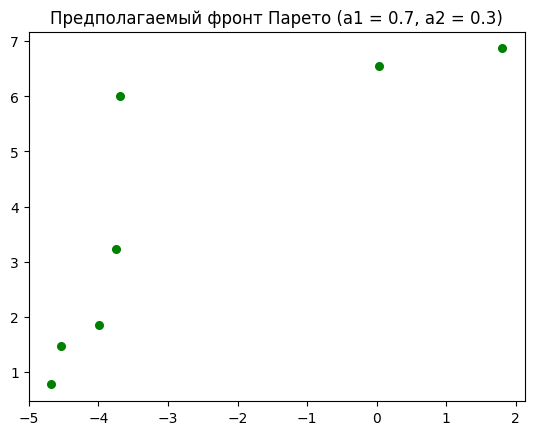

[-2.4926646478917776, 0.42072416024941417, -4.980461027197871] [6.2034412228490705, 6.684687009493988, 6.012146579102201]


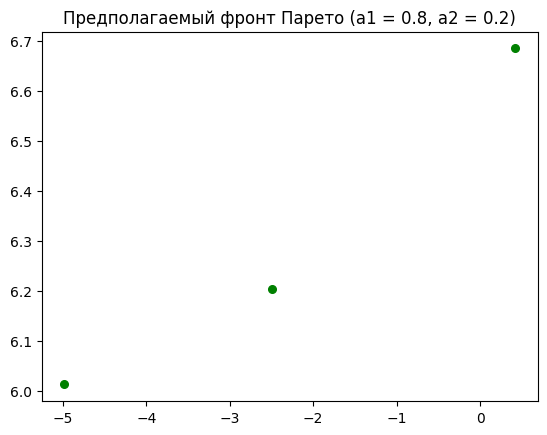

[3.693342389121573, -3.0599143911722284, -2.4063841460054203, 2.0337494047743845, -4.980461027197871, -3.466666951126842, -4.217420023669627, -4.02564162500414] [6.909037750217361, 6.2034412228490705, 6.793863691760206, 6.869607344533322, 0.6338890949633602, 6.012146579102201, 1.471355342884347, 1.8469144501101296]


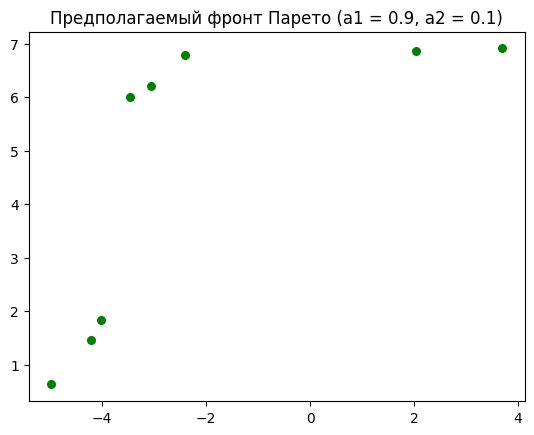

In [ ]:
for i in range(9):
    f_opt_1 = []
    f_opt_2 = []
    for j in range(len(opt_pareto[i])):
        f_opt_1.append(f(opt_pareto[i][j])[0])
        f_opt_2.append(f(opt_pareto[i][j])[1])
    plt.plot(f_opt_1[:], f_opt_2[:], '.g', markersize=11)
    plt.title(f"Предполагаемый фронт Парето (a1 = {round((i+1)*0.1,1)}, a2 = {round((9-i)*0.1,1)})")
    plt.show()

In [27]:
roy = [[1.5708, 0,  -0.5906, -0.2535],[1.5708, 0,  -0.4346, -0.2293],[1.5708, 0,  0.355, 0.2144],[1.5708, 0, 0.3008,  0.2029],[1.5708, 0,  -0.2584, -0.1929],[1.5708, 0,  -0.2219, -0.1834],[1.5708, 0, 0.1881, 0.1735],[1.5708, 0,  0.1536, 0.1622],[1.5708, 0, -0.1134, -0.1466]]

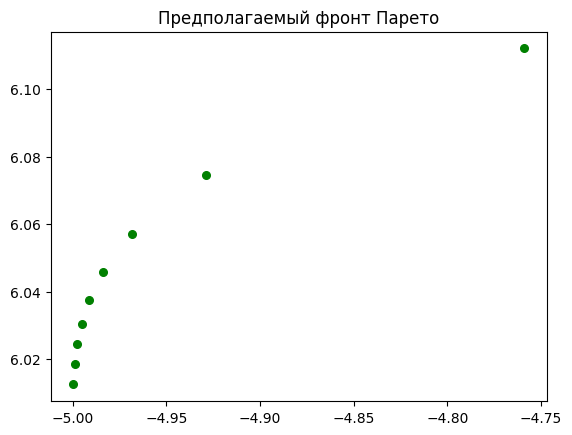

In [28]:
f_opt_1 = []
f_opt_2 = []
for i in range(9):
    f_opt_1.append(f(roy[i])[0])
    f_opt_2.append(f(roy[i])[1])
plt.plot(f_opt_1[:], f_opt_2[:], '.g', markersize=11)
plt.title(f"Предполагаемый фронт Парето")
plt.show()